# Group 19 - Jupyter Notebook
# “Learn to Code”: Data Science Education Optimization Report

This Jupyter Notebook details the steps that were followed in the design of the "Intro to Data Science and Analytics" course and the Master's of data science program. 

The Notebook includes all data collection, data analysis and results used throughout this project.

The outline of the Notebook is as follows:

1.   Scraping information about data science courses from the Coursera website
2.   Exctracting important information from the Coursera dataset
3.   Extracting the most common topics among Coursera beginner courses   
4.   Identifying most important skills for entry level jobs from the Kaggle survey
5.   Combining skills from Coursera and Kaggle
6.   Indeed Web Scraping
7.   Extracting Kaggle skills for respondents with less than 5 years of ML Experience
8.   Determining most important online platforms
9.   Assessing the importance of an internship
10.  Models for classifying level of courses
11.  Clustering of Indeed for course generation
12.  TOP 10 Master Programs






## 1-Scraping information about data science courses from the Coursera website

In this section, we use a list of key words related to the data science field to extract courses from the Coursera website. We chose Coursera for data extraction since it is one of the most used online learning platforms for the data science field (refer to section######). Therefore, the skills extracted from Coursera should be more or less representative of the currently most sought after skills.

In [1]:
from bs4 import BeautifulSoup
import urllib
import requests
import re
import collections
from time import sleep
import pandas as pd
import nltk
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')
# user_agent = 'Mozilla/5.0 (Windows NT 6.1; Win64; x64)'
# req = urllib.request.Request("https://towardsdatascience.com/20-universities-for-pursuing-master-of-science-in-data-science-on-campus-in-the-usa-2018-9970d5d25bd5", headers={'User-Agent': user_agent})

# with urllib.request.urlopen(req) as response:
#     content = response.read()
#     soup = BeautifulSoup(content, 'html')
#     prettyHTML = soup.prettify()
#     print(prettyHTML)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [2]:
base_url = "https://www.coursera.org/search"
technical_skill = ['excel', 'python', 'r', 'java', 'c', 'c++', 'matlab', 'sas','sql', 
                   'tableau', 'hadoop', 'spark','power bi',
                   'tensorflow', 'keras','pytorch','theano','caffe', 
                   'machine learning', 'data science', 'analytics', 'data visualization', 
                   'stata', 'ruby', 'perl', 'javascript', 'scala', 'd3.js', 'spss',
                   'd3', 'mapreduce', 'pig', 'hive', 'shark', 'oozie', 'zookeeper', 'flume', 
                   'mahout', 'nosql', 'hbase', 'cassandra', 'mongodb']

business_skill = ['communication', 'problem solving', 'project management', 'consulting', 
                  'presentation', 'leadership', 'documentation', 'marketing', 
                  'time management', 'collaborate', 'organize', 'powerpoint', 'teamwork']

The next few cells define and run the functions used to scrape the Coursera website. They will be commented out since they take a long time to run and in order to be able to replicate the same results.

The output of the webscraping exercise will be read in the next section for data analysis.

In [ ]:
# def scrape_by_skill(base_url="https://www.coursera.org/search", skill='python', page_limit=None, parse_description=False):
#     params = {
#         'query': skill,
#         'index': "prod_all_products_term_optimization"
#     }
#     df = pd.DataFrame(columns=['course title', 'number of students', 'rating', 
#                                'rating count', 'difficulty', 'course_type', 
#                                'course_partner', 'detail_title', 'detail_desc',
#                                'skills'])
#     skill_set = None
#     if parse_description:
#         skill_set = set()

#     # ##########################################################################
#     # This block is trying to reduce the overhead and assign page_limit
#     # if it's None
#     try:
#         r = requests.get(base_url, params=params)
#         soup = BeautifulSoup(r.text, 'lxml')
#         pagenum_lst = soup.find_all('button', {'class': 'box number'})
#         max_page = int(re.findall(r'\d+', pagenum_lst[-1]['aria-label'])[0])
#         if page_limit is None or max_page < page_limit:
#             print("Reassign page_limit to", max_page)
#             page_limit = max_page
#     except:
#         if page_limit is None:
#             print("Failed to find the maximum page, please manual define a maximum number for page")
#             return
#     # ##########################################################################
    
#     for page_num in range(1, page_limit+1):
#         scrape_page(base_url, page_num, params, df, parse_description=parse_description, skill_set=skill_set)
#         print('[Debug]: Finish scraping page {}'.format(page_num))
#         sleep(1)
    
#     if parse_description:
#         return df, skill_set
    
#     return df


# def scrape_page(base_url, page_num, params, df, parse_description=False, skill_set=None):
#     params.update({'page': page_num})
#     r = requests.get(base_url, params=params)
#     soup = BeautifulSoup(r.text, 'lxml')

#     course_lst = soup.find_all('li', {'class': 'ais-InfiniteHits-item'})

#     for course in course_lst:

#         course_metadata_tag = course.find("a", {'class': "rc-DesktopSearchCard anchor-wrapper"})
#         try:
#             href = course_metadata_tag['href']
#             href = 'https://www.coursera.org' + href
#         except:
#             print("[Warning]: cannot extract course href")
#             print(course)
#             href = None
#             continue
        
#         course_title_tag = course.find("h2", {'class': "color-primary-text card-title headline-1-text"})
#         try:
#             course_title = course_title_tag.text
#         except:
#             print("[Warning]: cannot extract course title")
#             print(href)
#             course_title = None
        
#         course_rating_tag = course_metadata_tag.find("span", {'class': "ratings-text"})
#         try:
#             course_rating = course_rating_tag.text
#         except:
#             print("[Warning]: cannot extract course rating")
#             print(href)
#             course_rating = None

#         course_rating_count_tag = course_metadata_tag.find("span", {'class': "ratings-count"})
#         try:
#             course_rating_count = course_rating_count_tag.text.strip('() ')
#         except:
#             print("[Warning]: cannot extract course rating count")
#             print(href)
#             course_rating_count = None 

#         course_enrollment_number_tag = course_metadata_tag.find("span", {'class': "enrollment-number"})
#         try:
#             course_enrollment_number = course_enrollment_number_tag.text
#         except:
#             print("[Warning]: cannot extract course enrollment count")
#             print(href)
#             course_enrollment_number = None 

#         course_difficulty_tag = course_metadata_tag.find("span", {'class': "difficulty"})
#         try:
#             course_difficulty = course_difficulty_tag.text
#         except:
#             print("[Warning]: cannot extract course difficulty")
#             print(href)
#             course_difficulty = None
        
#         course_partner_tag = course_metadata_tag.find("span", {'class': 'partner-name m-b-1s'})
#         try:
#             course_partner = course_partner_tag.text
#         except:
#             print("[Warning]: cannot extract course parner")
#             print(href)
#             course_partner = None
        
#         course_type_tag = course_metadata_tag.find("div", {'class': '_jen3vs _1d8rgfy3'})
#         try:
#             course_type = course_type_tag.text
#             # There is a strange character in this label
#             if 'MASTERTRACK' in course_type:
#                 course_type = 'MASTERTRACK CERTIFICATE'
#         except:
#             print('[Warning]: cannot extract course type')
#             print(href)
#             course_type = None
        

#         # print([href, course_title, course_rating, course_rating_count, course_enrollment_number])
#         df.loc[href] = {'course title': course_title, 
#                         'rating': course_rating,
#                         'rating count': course_rating_count,
#                         'number of students': course_enrollment_number,
#                         'difficulty': course_difficulty,
#                         'course_partner': course_partner,
#                         'course_type': course_type}
        
#         if parse_description:
#             sleep(0.5)
#             parse_desc_page(href, df=df, skill_set=skill_set, course_type=course_type)

# def parse_desc_page(href, df=None, base_url='https://www.coursera.org', skill_set=None, course_type=None):
#     url = href
#     r = requests.get(url)
#     soup = BeautifulSoup(r.text, 'lxml')

#     tag_map = COURSE_TYPE_TAG_MAP[course_type]

#     # Parse the list of skill the course provides
#     skills = soup.find_all(*tag_map['skills'])
#     try:
#         skills = [skill.text.lower().strip() for skill in skills]
#         # Help to generate skill set, not required
#         if skill_set is not None:
#             skill_set.update(set(skills))
#     except:
#         # skills = None
#         print(skills)
#         print("[Warning]: skills description are not provided in this course")
#         print(href)

#     # Parse the course title 
#     # It's different in the query page, no idea why, same reason for following
#     title = soup.find(*tag_map['title'])
#     try:
#         title = title.text
#     except:
#         title = None
#         print("[Warning]: title cannot be found in the description page")
#         print(href)
    
#     # Parse the description
#     # Notice some courses don't have description
#     desc = soup.find(*tag_map['desc'])
#     try:
#         desc = desc.text
#     except:
#         desc = None
#         print("[Warning]: description cannot be found in the description page")
#         print(href)
    
#     result = {'skills': skills,
#               'detail_title': title, 
#               'detail_desc': desc}

#     if df is None:
#         print(result)
#     else:
#         for key, value in result.items():
#             if key in df.columns:
#                 df.loc[href, key] = value

# # Here is a map of course type to html tag
# # Last 2 items are not important
# COURSE_TYPE_TAG_MAP = {
#     'COURSE': {
#         'skills': ('span', {'class': '_1q9sh65'}),
#         'title': ('h1', {'class': ['banner-title m-b-0', 'banner-title m-b-0 banner-title-without--subtitle']}),
#         'desc': ('div', {'class': 'content'})
#     },
#     'GUIDED PROJECT': {
#         'skills': ('span', {'class': '_1q9sh65'}),
#         'title': ('h1', {'class': '_125g251l _gkjc69'}),
#         'desc': ('p', {'class': '_g61i7y'})
#     },
#     'SPECIALIZATION': {
#         'skills': ('span', {'class': '_1q9sh65'}),
#         'title': ('h1', {'class': ['banner-title m-b-0', 'banner-title m-b-0 banner-title-without--subtitle']}),
#         'desc': ('p', {'class': 'max-text-width m-b-0'})   
#     },
#     'PROFESSIONAL CERTIFICATE': {
#         'skills': ('span', {'class': '_1q9sh65'}),
#         'title': ('h1', {'class': 'banner-title m-b-0'}),
#         'desc': ('p', {'class': 'max-text-width m-b-0'})   
#     },
#     'MASTERTRACK CERTIFICATE': {
#         'skills': ('span', {'class': '_1q9sh65'}),
#         'title': ('h1', {'class': '_1l2q8kho max-text-width-xl m-b-2'}),
#         'desc': ('h2', {'class': '_wmgtrl9 max-text-width m-b-0'})   
#     },
#     'DEGREE': {
#         'skills': ('span', {'class': '_1q9sh65'}),
#         'title': ('h1', {'class': 'page-title'}),
#         'desc': ('p', {'class': 'max-text-width m-b-0'})   
#     },
# }

In [ ]:
# data_df, skill_set = scrape_by_skill(skill='data science', page_limit=None, parse_description=True)

Reassign page_limit to 100
[Warning]: description cannot be found in the description page
https://www.coursera.org/specializations/data-science-foundations-r
[Warning]: description cannot be found in the description page
https://www.coursera.org/specializations/data-science-statistics-machine-learning
[Debug]: Finish scraping page 1
[Warning]: description cannot be found in the description page
https://www.coursera.org/specializations/learn-sql-basics-data-science
[Debug]: Finish scraping page 2
[Debug]: Finish scraping page 3
[Warning]: description cannot be found in the description page
https://www.coursera.org/specializations/practical-data-science-matlab
[Debug]: Finish scraping page 4
[Warning]: description cannot be found in the description page
https://www.coursera.org/specializations/investment-management-python-machine-learning
[Warning]: description cannot be found in the description page
https://www.coursera.org/specializations/ibm-ai-workflow
[Debug]: Finish scraping page 5

In [ ]:
# data_df

,course title,number of students,rating,rating count,difficulty,course_type,course_partner,detail_title,detail_desc,skills
https://www.coursera.org/professional-certificates/ibm-data-science,IBM Data Science,670k,4.6,"64,892",Beginner,PROFESSIONAL CERTIFICATE,IBM,IBM Data Science Professional Certificate,Kickstart your career in data science & ML. Ma...,"[data science, statistical analysis, machine l..."
https://www.coursera.org/specializations/jhu-data-science,Data Science,1m,4.5,"43,582",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science Specialization,Launch Your Career in Data Science. A ten-cour...,"[github, machine learning, r programming, regr..."
https://www.coursera.org/specializations/data-science-python,Applied Data Science with Python,670k,4.5,"27,256",Intermediate,SPECIALIZATION,University of Michigan,Applied Data Science with Python Specialization,Gain new insights into your data . Learn to a...,"[text mining, python programming, pandas, matp..."
https://www.coursera.org/specializations/introduction-data-science,Introduction to Data Science,430k,4.6,"49,781",Beginner,SPECIALIZATION,IBM,Introduction to Data Science Specialization,Launch your career in data science. Gain found...,"[data science, relational database management ..."
https://www.coursera.org/specializations/data-science-foundations-r,Data Science: Foundations using R,950k,4.6,"41,301",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science: Foundations using R Specialization,None,"[data science, machine learning, github, r pro..."
...,...,...,...,...,...,...,...,...,...,...
https://www.coursera.org/learn/predictive-analytics-data-mining,Predictive Analytics and Data Mining,6.6k,4.4,103,Intermediate,COURSE,University of Illinois at Urbana-Champaign,Predictive Analytics and Data Mining,This course introduces students to the science...,"[predictive analytics, decision-making softwar..."
https://www.coursera.org/learn/big-data-language-1,Big data and Language 1,3k,4.5,60,Beginner,COURSE,Korea Advanced Institute of Science and Techno...,Big data and Language 1,"In this course, students will understand chara...",[]
https://www.coursera.org/learn/gis-data-acquisition-map-design,GIS Data Acquisition and Map Design,13k,4.9,353,Beginner,COURSE,University of Toronto,GIS Data Acquisition and Map Design,"In this course, you will learn how to find GIS...","[geographic information system (gis), cartogra..."
https://www.coursera.org/specializations/from-data-to-insights-google-cloud-platform-jp,From Data to Insights with Google Cloud Platfo...,None,4.6,7,Beginner,SPECIALIZATION,Google Cloud,From Data to Insights with Google Cloud Platfo...,ã¹ã±ã¼ã©ãã«å¯è½ãªãã¼ã¿åææ¹æ...,[]


In [ ]:
# data_df.to_csv('coursera_data_science_result.csv')

In [ ]:
# data_df.to_json('coursera_data_science_result.json')

In [ ]:
# skillset_str = ', '.join(skill_set)
# with open('skill_set.txt', 'w') as f:
#     f.write(skillset_str)

In [ ]:
# !cp coursera_data_science_result* drive/My\ Drive/MIE1624
# !cp skill_set.txt drive/My\ Drive/MIE1624

# 2- Extracting beginner courses from the Coursera dataset

In this section we extract and analyze the beginner courses that were extracted from Coursera. These courses will be used for the design of the introductory course. 

The idea here is to identify the beginner skills that are the most in demand.

## Get top skill

In [3]:
import pandas as pd
from collections import Counter
import json
import ast
import matplotlib.pyplot as plt
import numpy as np
import nltk
nltk.download('wordnet')
nltk.download("stopwords")
nltk.download('punkt')
from nltk.corpus import stopwords
from nltk import word_tokenize 
from nltk.util import ngrams
from wordcloud import WordCloud
import re


from wordcloud import WordCloud
from collections import Counter
from nltk.tokenize import RegexpTokenizer

import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import html
from html.parser import HTMLParser
import re 
import string
import nltk
from nltk.tokenize import word_tokenize 
#nltk.download('punkt')
import warnings
sns.set_style('whitegrid')

# The following line is needed to show plots inline in notebooks
%matplotlib inline 

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [4]:
coursera_df = pd.read_csv(r'coursera_data_science_result.csv')
coursera_df = coursera_df.set_index('Unnamed: 0')

In [5]:
display(coursera_df)

,course title,number of students,rating,rating count,difficulty,course_type,course_partner,detail_title,detail_desc,skills
Unnamed: 0,,,,,,,,,,
https://www.coursera.org/professional-certificates/ibm-data-science,IBM Data Science,670k,4.6,"64,892",Beginner,PROFESSIONAL CERTIFICATE,IBM,IBM Data Science Professional Certificate,Kickstart your career in data science & ML. Ma...,"['data science', 'statistical analysis', 'mach..."
https://www.coursera.org/specializations/jhu-data-science,Data Science,1m,4.5,"43,582",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science Specialization,Launch Your Career in Data Science. A ten-cour...,"['github', 'machine learning', 'r programming'..."
https://www.coursera.org/specializations/data-science-python,Applied Data Science with Python,670k,4.5,"27,256",Intermediate,SPECIALIZATION,University of Michigan,Applied Data Science with Python Specialization,Gain new insights into your data . Learn to a...,"['text mining', 'python programming', 'pandas'..."
https://www.coursera.org/specializations/introduction-data-science,Introduction to Data Science,430k,4.6,"49,781",Beginner,SPECIALIZATION,IBM,Introduction to Data Science Specialization,Launch your career in data science. Gain found...,"['data science', 'relational database manageme..."
https://www.coursera.org/specializations/data-science-foundations-r,Data Science: Foundations using R,950k,4.6,"41,301",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science: Foundations using R Specialization,NaN,"['data science', 'machine learning', 'github',..."
...,...,...,...,...,...,...,...,...,...,...
https://www.coursera.org/learn/predictive-analytics-data-mining,Predictive Analytics and Data Mining,6.6k,4.4,103,Intermediate,COURSE,University of Illinois at Urbana-Champaign,Predictive Analytics and Data Mining,This course introduces students to the science...,"['predictive analytics', 'decision-making soft..."
https://www.coursera.org/learn/big-data-language-1,Big data and Language 1,3k,4.5,60,Beginner,COURSE,Korea Advanced Institute of Science and Techno...,Big data and Language 1,"In this course, students will understand chara...",[]
https://www.coursera.org/learn/gis-data-acquisition-map-design,GIS Data Acquisition and Map Design,13k,4.9,353,Beginner,COURSE,University of Toronto,GIS Data Acquisition and Map Design,"In this course, you will learn how to find GIS...","['geographic information system (gis)', 'carto..."


In [6]:
#select only the courses with a beginner difficulty
beginner_coursera_df = coursera_df[coursera_df['difficulty'] == 'Beginner']
display(beginner_coursera_df)

,course title,number of students,rating,rating count,difficulty,course_type,course_partner,detail_title,detail_desc,skills
Unnamed: 0,,,,,,,,,,
https://www.coursera.org/professional-certificates/ibm-data-science,IBM Data Science,670k,4.6,"64,892",Beginner,PROFESSIONAL CERTIFICATE,IBM,IBM Data Science Professional Certificate,Kickstart your career in data science & ML. Ma...,"['data science', 'statistical analysis', 'mach..."
https://www.coursera.org/specializations/jhu-data-science,Data Science,1m,4.5,"43,582",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science Specialization,Launch Your Career in Data Science. A ten-cour...,"['github', 'machine learning', 'r programming'..."
https://www.coursera.org/specializations/introduction-data-science,Introduction to Data Science,430k,4.6,"49,781",Beginner,SPECIALIZATION,IBM,Introduction to Data Science Specialization,Launch your career in data science. Gain found...,"['data science', 'relational database manageme..."
https://www.coursera.org/specializations/data-science-foundations-r,Data Science: Foundations using R,950k,4.6,"41,301",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science: Foundations using R Specialization,NaN,"['data science', 'machine learning', 'github',..."
https://www.coursera.org/specializations/python,Python for Everybody,2.2m,4.8,"201,508",Beginner,SPECIALIZATION,University of Michigan,Python for Everybody Specialization,Learn to Program and Analyze Data with Python....,"['json', 'xml', 'python programming', 'databas..."
...,...,...,...,...,...,...,...,...,...,...
https://www.coursera.org/specializations/precalculus-data-modelling,Precalculus through Data and Modelling,NaN,NaN,NaN,Beginner,SPECIALIZATION,Johns Hopkins University,Precalculus through Data and Modelling Special...,Learn foundational math skills and concepts. D...,"['function analysis', 'vectors', 'regression',..."
https://www.coursera.org/learn/intro-translational-science,Introduction to Translational Science,5.4k,4.5,72,Beginner,COURSE,University of Rochester,Introduction to Translational Science,Translational science seeks to speed up the pr...,[]
https://www.coursera.org/learn/big-data-language-1,Big data and Language 1,3k,4.5,60,Beginner,COURSE,Korea Advanced Institute of Science and Techno...,Big data and Language 1,"In this course, students will understand chara...",[]


In [7]:
#remove non-alphanumeric characters from course titles
beginner_coursera_df.loc[:, 'course title'] = beginner_coursera_df['course title'].apply(lambda x: re.sub(r'[^\s\w]', '', x))
beginner_coursera_df.loc[:, 'course title'] = beginner_coursera_df['course title'].apply(lambda x: x.encode('ascii', 'ignore').decode())

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


In [8]:
beginner_coursera_df

,course title,number of students,rating,rating count,difficulty,course_type,course_partner,detail_title,detail_desc,skills
Unnamed: 0,,,,,,,,,,
https://www.coursera.org/professional-certificates/ibm-data-science,IBM Data Science,670k,4.6,"64,892",Beginner,PROFESSIONAL CERTIFICATE,IBM,IBM Data Science Professional Certificate,Kickstart your career in data science & ML. Ma...,"['data science', 'statistical analysis', 'mach..."
https://www.coursera.org/specializations/jhu-data-science,Data Science,1m,4.5,"43,582",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science Specialization,Launch Your Career in Data Science. A ten-cour...,"['github', 'machine learning', 'r programming'..."
https://www.coursera.org/specializations/introduction-data-science,Introduction to Data Science,430k,4.6,"49,781",Beginner,SPECIALIZATION,IBM,Introduction to Data Science Specialization,Launch your career in data science. Gain found...,"['data science', 'relational database manageme..."
https://www.coursera.org/specializations/data-science-foundations-r,Data Science Foundations using R,950k,4.6,"41,301",Beginner,SPECIALIZATION,Johns Hopkins University,Data Science: Foundations using R Specialization,NaN,"['data science', 'machine learning', 'github',..."
https://www.coursera.org/specializations/python,Python for Everybody,2.2m,4.8,"201,508",Beginner,SPECIALIZATION,University of Michigan,Python for Everybody Specialization,Learn to Program and Analyze Data with Python....,"['json', 'xml', 'python programming', 'databas..."
...,...,...,...,...,...,...,...,...,...,...
https://www.coursera.org/specializations/precalculus-data-modelling,Precalculus through Data and Modelling,NaN,NaN,NaN,Beginner,SPECIALIZATION,Johns Hopkins University,Precalculus through Data and Modelling Special...,Learn foundational math skills and concepts. D...,"['function analysis', 'vectors', 'regression',..."
https://www.coursera.org/learn/intro-translational-science,Introduction to Translational Science,5.4k,4.5,72,Beginner,COURSE,University of Rochester,Introduction to Translational Science,Translational science seeks to speed up the pr...,[]
https://www.coursera.org/learn/big-data-language-1,Big data and Language 1,3k,4.5,60,Beginner,COURSE,Korea Advanced Institute of Science and Techno...,Big data and Language 1,"In this course, students will understand chara...",[]


### Generate Counter for skill in coursera data

In [9]:
def convert_to_list(skill_string):
    try:
        # converted_skill_string = skill_string.replace(r"'", r'"')
        # skills = json.loads(converted_skill_string)
        # ===============
        skills = ast.literal_eval(skill_string)
    except:
        print(converted_skill_string)
    return skills

def count_skills(df):
    c = Counter()
    df['skills'].apply(lambda skill_string: c.update(convert_to_list(skill_string)))
    return c

In [10]:
skill_counter = count_skills(beginner_coursera_df)

In [11]:
#Extract the 30 most common beginner courses from Coursera
skill_counter.most_common(30)

[('data analysis', 71),
 ('python programming', 56),
 ('machine learning', 50),
 ('data science', 48),
 ('data visualization (dataviz)', 46),
 ('r programming', 25),
 ('statistics', 22),
 ('deep learning', 20),
 ('artificial intelligence (ai)', 18),
 ('sql', 16),
 ('microsoft excel', 13),
 ('linear regression', 13),
 ('pandas', 12),
 ('statistical hypothesis testing', 12),
 ('analytics', 12),
 ('regression analysis', 11),
 ('exploratory data analysis', 11),
 ('rstudio', 10),
 ('computer programming', 10),
 ('big data', 10),
 ('business intelligence', 9),
 ('numpy', 9),
 ('statistical analysis', 8),
 ('data cleansing', 8),
 ('data management', 8),
 ('predictive analytics', 8),
 ('data virtualization', 7),
 ('spreadsheet', 7),
 ('tensorflow', 7),
 ('mathematical optimization', 7)]

### Visualizing the 100 most common beginner skills extracted from Coursera

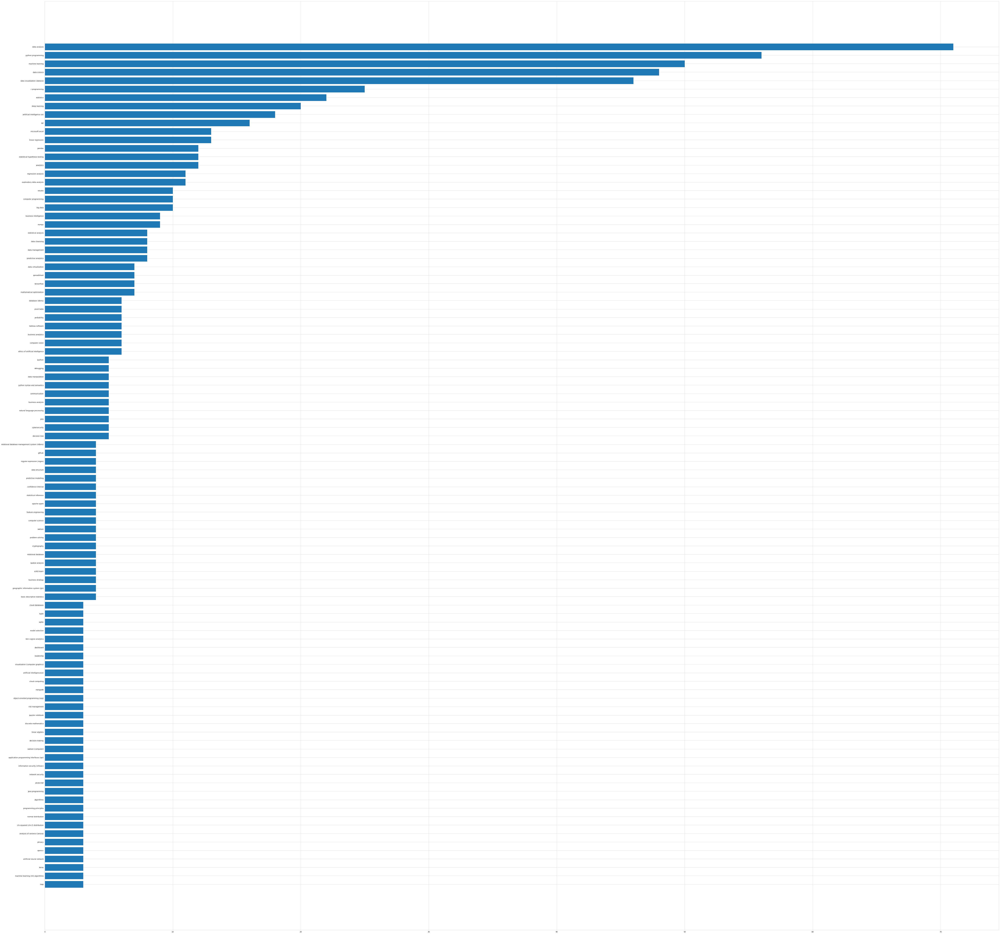

In [12]:
top_skills_arr = []
top_counter_arr = []

for skill, count in skill_counter.most_common(100):
    top_skills_arr.append(skill)
    top_counter_arr.append(count)

plt.figure(figsize=(100, 100))
plt.barh(np.array(top_skills_arr)[::-1], np.array(top_counter_arr)[::-1])
plt.rc('ytick',labelsize=40)
plt.rc('xtick',labelsize=40)

plt.show()


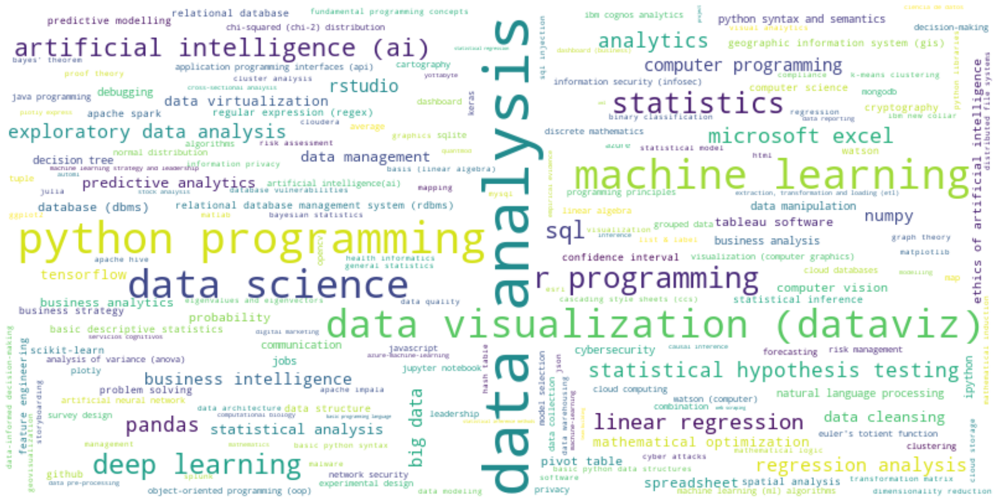

In [ ]:
# generate a word cloud for the most 30 repeated skills
# word_cloud_skill_text = ""

# for skill, count in skill_counter.most_common(30):
#     word_cloud_skill_text += (skill + " ") * count


# wordcloud = WordCloud().generate(word_cloud_skill_text)
wordcloud = WordCloud(background_color='white', width=800, height=400, max_font_size=50)
wordcloud = wordcloud.generate_from_frequencies(frequencies=skill_counter)

# Display the generated image:
plt.figure(figsize=(30, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

# 3-Extracting the most common topics among Coursera beginner courses

In this section we will identify the most common topics among beginner courses from the Coursera dataset, using unigram, bigram and trigram

### Generate Counter for unigram

In [13]:
lemmatizer = nltk.WordNetLemmatizer()
stemmer = nltk.stem.porter.PorterStemmer()
stopword_list = stopwords.words("english")
stopword_list.append('la')
stopword_list.append('cinecia')
stopword_list.append('de')
stopword_list.append('datos')
stopword_list.append('con')

def process_text(text):
    text_list = []
    for word in text.split():
        if word.lower() not in stopword_list:
            word = word.lower()
            # word = stemmer.stem(word)
            # word = lemmatizer.lemmatize(word)
            text_list.append(word)
    return text_list

In [14]:
def get_top_topic(df):
    c = Counter()
    df['course title'].apply(lambda topic: c.update(process_text(topic)))
    return c

In [15]:
top_topic_unigram_counter = get_top_topic(beginner_coursera_df)

In [16]:
#Identify the 30 most common topics using unigram
top_topic_unigram_counter.most_common(30)

[('data', 100),
 ('science', 46),
 ('python', 41),
 ('using', 32),
 ('r', 25),
 ('analysis', 25),
 ('introduction', 23),
 ('learning', 21),
 ('machine', 18),
 ('google', 15),
 ('big', 14),
 ('analytics', 14),
 ('visualization', 14),
 ('business', 13),
 ('statistics', 11),
 ('sql', 11),
 ('ai', 10),
 ('computer', 9),
 ('regression', 9),
 ('azure', 9),
 ('ibm', 8),
 ('foundations', 8),
 ('basics', 8),
 ('programming', 8),
 ('getting', 8),
 ('started', 8),
 ('excel', 7),
 ('health', 7),
 ('linear', 7),
 ('ciencia', 7)]

### Some visualizations for unigram

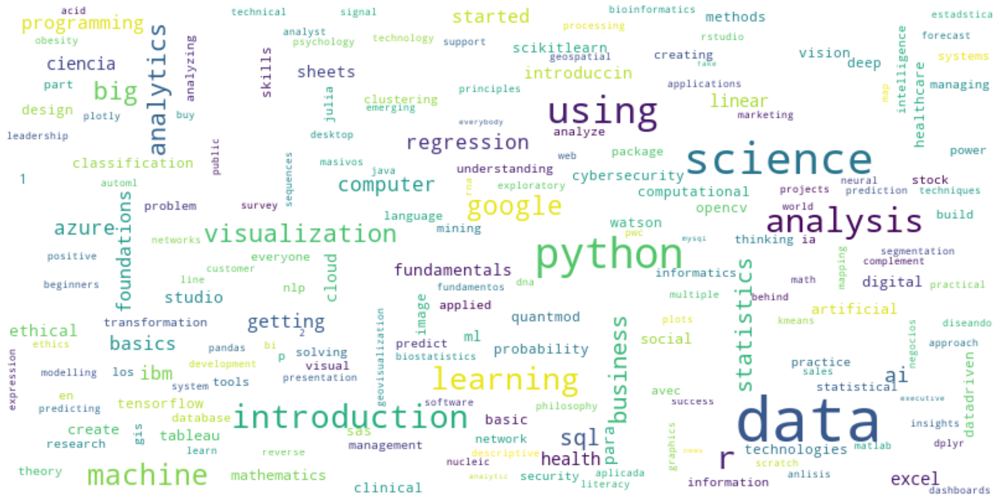

In [ ]:
top_topic_unigram_most_common = top_topic_unigram_counter.most_common(200)
top_topic_unigram_counter_ = dict([(word, count) for word, count in top_topic_unigram_most_common])
wordcloud = WordCloud(background_color ='white', max_font_size=50, stopwords = stopword_list, width=800, height=400).generate_from_frequencies(top_topic_unigram_counter_)

# Display the generated image:
plt.figure(figsize=(30, 30))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Bigram

In [17]:
def ngram_process_text(text, n=2):
    """ n = 1 => unigram
        n = 2 => bigram
        n = 3 => trigram """
    # ============== Clean the text ==============
    words_lst = []
    for word in text.split():
        if word not in stopword_list:
            words_lst.append(word)

    text_cleaned = " ".join(words_lst)
    # ===========================================
    token = nltk.word_tokenize(text_cleaned)
    ngram_words = list(ngrams(token, n))
    return ngram_words

def get_top_topic_ngram(df, n=2):
    c = Counter()
    df['course title'].apply(lambda topic: c.update(ngram_process_text(topic, n=n)))
    return c

In [18]:
top_topic_bigram_counter = get_top_topic_ngram(beginner_coursera_df, n=2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: generator 'ngrams' raised StopIteration
  


In [19]:
#Identifying the 100 most common topics using bigram
top_topic_bigram_counter.most_common(100)

[(('Data', 'Science'), 30),
 (('Machine', 'Learning'), 17),
 (('Data', 'Analysis'), 16),
 (('Big', 'Data'), 13),
 (('Data', 'Visualization'), 8),
 (('Getting', 'Started'), 8),
 (('Google', 'Sheets'), 6),
 (('using', 'R'), 5),
 (('Computer', 'Science'), 5),
 (('Linear', 'Regression'), 5),
 (('Data', 'Analytics'), 4),
 (('Google', 'Cloud'), 4),
 (('R', 'Quantmod'), 4),
 (('Introduction', 'Data'), 3),
 (('Statistics', 'Python'), 3),
 (('Python', 'Data'), 3),
 (('Problem', 'Solving'), 3),
 (('Business', 'Analytics'), 3),
 (('Basic', 'Statistics'), 3),
 (('Computer', 'Vision'), 3),
 (('Artificial', 'Intelligence'), 3),
 (('Social', 'Science'), 3),
 (('Deep', 'Learning'), 3),
 (('Azure', 'ML'), 3),
 (('ML', 'Studio'), 3),
 (('Quantmod', 'Package'), 3),
 (('Ciencia', 'Datos'), 3),
 (('IBM', 'Data'), 2),
 (('Basics', 'Data'), 2),
 (('Science', 'AI'), 2),
 (('Exploratory', 'Data'), 2),
 (('Beginners', 'Data'), 2),
 (('Google', 'IT'), 2),
 (('SQL', 'Data'), 2),
 (('KMeans', 'Clustering'), 2),
 (

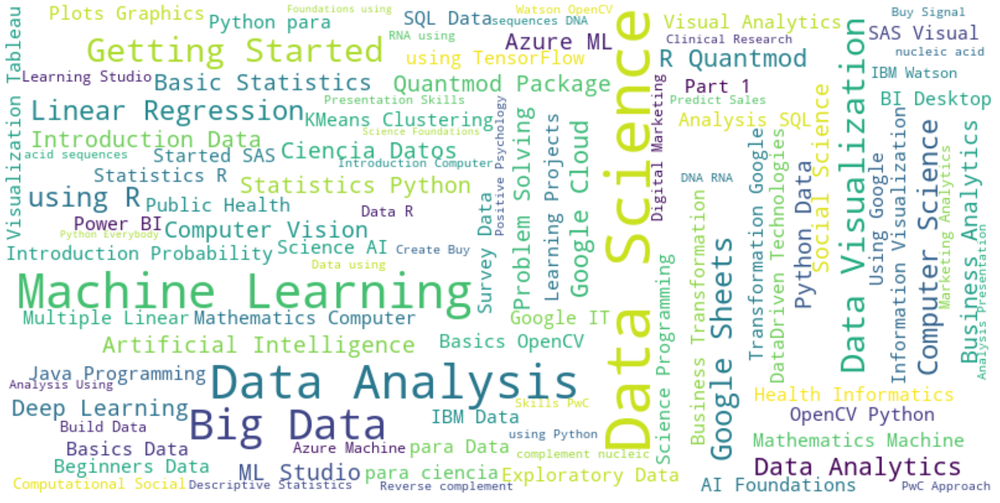

In [ ]:
#Visualizing our results from bigram
top_topic_bigram_most_common = top_topic_bigram_counter.most_common(100)
top_topic_bigram_counter_ = dict([(' '.join(word_split), count) for word_split, count in top_topic_bigram_most_common])
wordcloud = WordCloud(background_color ='white', max_font_size=50, stopwords = stopword_list, width=800, height=400).generate_from_frequencies(top_topic_bigram_counter_)

plt.figure(figsize=(30, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### Trigram

In [20]:
top_topic_trigram_counter = get_top_topic_ngram(beginner_coursera_df, n=3)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: generator 'ngrams' raised StopIteration
  


In [21]:
top_topic_trigram_counter.most_common(100)

[(('Azure', 'ML', 'Studio'), 3),
 (('R', 'Quantmod', 'Package'), 3),
 (('Data', 'Science', 'AI'), 2),
 (('Exploratory', 'Data', 'Analysis'), 2),
 (('Beginners', 'Data', 'Science'), 2),
 (('SQL', 'Data', 'Science'), 2),
 (('Python', 'para', 'Data'), 2),
 (('para', 'Data', 'Science'), 2),
 (('Mathematics', 'Machine', 'Learning'), 2),
 (('Mathematics', 'Computer', 'Science'), 2),
 (('Big', 'Data', 'Analysis'), 2),
 (('Data', 'Analysis', 'SQL'), 2),
 (('Computer', 'Science', 'Programming'), 2),
 (('Power', 'BI', 'Desktop'), 2),
 (('Getting', 'Started', 'SAS'), 2),
 (('Basics', 'OpenCV', 'Python'), 2),
 (('Multiple', 'Linear', 'Regression'), 2),
 (('Business', 'Transformation', 'Google'), 2),
 (('Transformation', 'Google', 'Cloud'), 2),
 (('Machine', 'Learning', 'Projects'), 2),
 (('Computational', 'Social', 'Science'), 2),
 (('Digital', 'Marketing', 'Analytics'), 2),
 (('Azure', 'Machine', 'Learning'), 2),
 (('Machine', 'Learning', 'Studio'), 2),
 (('Build', 'Data', 'Analysis'), 2),
 (('Cr

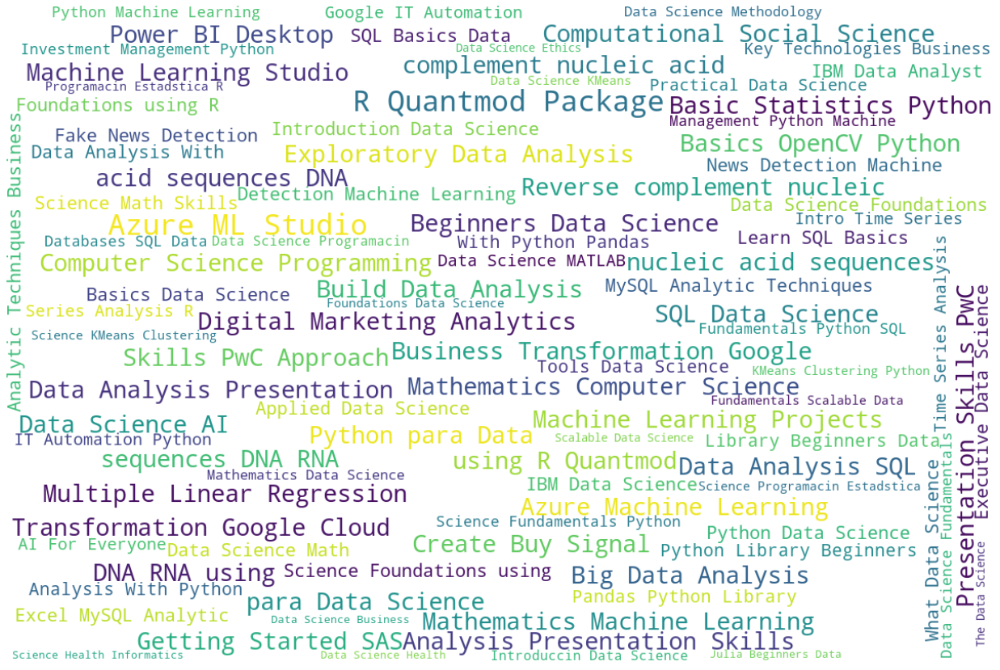

In [ ]:
#Visualizing our results from trigram
top_topic_trigram_most_common = top_topic_trigram_counter.most_common(100)
top_topic_trigram_counter_ = dict([(' '.join(word_split), count) for word_split, count in top_topic_trigram_most_common])
wordcloud = WordCloud(background_color ='white', max_font_size=35, stopwords = stopword_list, width=1200, height=800).generate_from_frequencies(top_topic_trigram_counter_)

plt.figure(figsize=(30, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Identifying important words from the course descriptions

A similar procedure was applied to the description column of the coursera dataset. However, We found that most of the words were not very helpful for designing the curriculum. Therefore, we did not use the results of this section

In [22]:
# Repeat for the detail_desc column:
# first start by dropping NaN values
beginner_coursera_df_clean = beginner_coursera_df.dropna(subset=['detail_desc'])
#beginner_coursera_df_clean['detail_desc'].isnull().sum
#beginner_coursera_df['detail_desc'].isnull().sum()

In [23]:
def get_top_topic(df):
    c = Counter()
    df['detail_desc'].apply(lambda topic: c.update(process_text(topic)))
    return c

In [24]:
# Cleaning the text data
from string import printable
import string
def Clean_text(text): 
    text=text.lower() # transform everything to lower case (useful for detecting stopwords later)
    #Removing punctuations
    text=text.translate(str.maketrans("","",string.punctuation))
    text=text.translate(str.maketrans("","",string.digits))
    text = html.unescape(text) #work with html characters (replace by ASCII equivalent)
    text = re.sub(r'[^\x00-\x7f]',r'', text)
    text = re.sub(r'<[^<]+?>', ' ', text) 
    text = re.sub(r"http\S+", " ", text)  # remove urls
    
    return text

In [25]:
# function to remove non-ASCII 
def remove_non_ascii(text): 
    return ''.join(i for i in text if ord(i)<128) 

In [26]:
# first level cleaning
beginner_coursera_df_clean['detail_desc'] = beginner_coursera_df_clean['detail_desc'].apply(Clean_text)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [27]:
beginner_coursera_df_clean['detail_desc'] = beginner_coursera_df_clean['detail_desc'].str.replace('http\S+|www.\S+', '', case=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [28]:
# second level cleaning
beginner_coursera_df_clean['detail_desc'] = beginner_coursera_df_clean['detail_desc'].apply(remove_non_ascii)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [29]:
# ensuring to remove other un-removed non-ASCII characters
beginner_coursera_df_clean['detail_desc'] = beginner_coursera_df_clean['detail_desc'].str.replace('weâ\x80\x99','')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [30]:
top_topic_unigram_counter = get_top_topic(beginner_coursera_df_clean)

In [31]:
top_topic_unigram_counter.most_common(30)
# We can realize that this data needs further cleaning

[('data', 749),
 ('course', 537),
 ('learn', 246),
 ('learning', 227),
 ('project', 204),
 ('science', 168),
 ('using', 168),
 ('use', 157),
 ('python', 156),
 ('machine', 152),
 ('analysis', 114),
 ('learners', 112),
 ('able', 110),
 ('experience', 107),
 ('basic', 95),
 ('business', 93),
 ('end', 89),
 ('also', 89),
 ('en', 89),
 ('programming', 85),
 ('based', 84),
 ('software', 84),
 ('working', 83),
 ('create', 81),
 ('r', 81),
 ('best', 80),
 ('access', 80),
 ('work', 78),
 ('get', 78),
 ('understand', 78)]

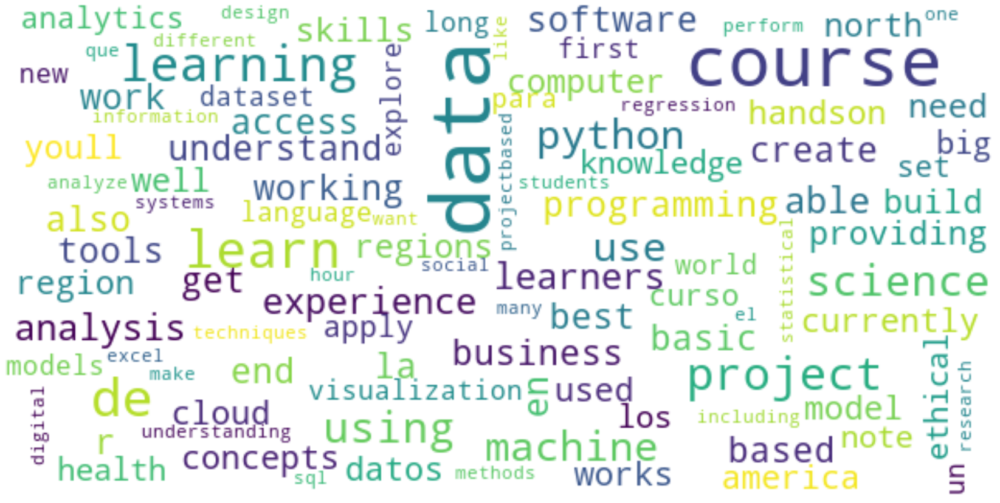

In [ ]:
top_topic_unigram_most_common = top_topic_unigram_counter.most_common(100)
top_topic_unigram_counter_ = dict([(word, count) for word, count in top_topic_unigram_most_common])
wordcloud = WordCloud(background_color ='white', max_font_size=50, stopwords = stopword_list, width=600, height=300).generate_from_frequencies(top_topic_unigram_counter_)

# Display the generated image:
plt.figure(figsize=(30, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [32]:
def ngram_process_text(text, n=2):
    """ n = 1 => unigram
        n = 2 => bigram
        n = 3 => trigram """
    # ============== Clean the text ==============
    words_lst = []
    for word in text.split():
        if word not in stopword_list:
            words_lst.append(word)

    text_cleaned = " ".join(words_lst)
    # ===========================================
    token = nltk.word_tokenize(text_cleaned)
    ngram_words = list(ngrams(token, n))
    return ngram_words

def get_top_topic_ngram(df, n=2):
    c = Counter()
    df['detail_desc'].apply(lambda topic: c.update(ngram_process_text(topic, n=n)))
    return c

In [33]:
top_topic_bigram_counter = get_top_topic_ngram(beginner_coursera_df_clean, n=2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: generator 'ngrams' raised StopIteration
  


In [34]:
top_topic_bigram_counter.most_common(30)
# We realize that we have punctuations and stop words

[(('machine', 'learning'), 145),
 (('data', 'science'), 89),
 (('data', 'analysis'), 64),
 (('works', 'best'), 60),
 (('best', 'learners'), 60),
 (('learners', 'based'), 59),
 (('based', 'north'), 59),
 (('north', 'america'), 59),
 (('america', 'region'), 59),
 (('region', 'currently'), 59),
 (('currently', 'working'), 59),
 (('working', 'providing'), 59),
 (('providing', 'experience'), 59),
 (('experience', 'regions'), 59),
 (('course', 'works'), 55),
 (('big', 'data'), 50),
 (('course', 'learn'), 48),
 (('projectbased', 'course'), 43),
 (('end', 'course'), 42),
 (('note', 'course'), 41),
 (('long', 'projectbased'), 36),
 (('end', 'project'), 35),
 (('data', 'visualization'), 34),
 (('hour', 'long'), 31),
 (('course', 'able'), 28),
 (('instant', 'access'), 27),
 (('este', 'curso'), 25),
 (('get', 'instant'), 25),
 (('access', 'cloud'), 25),
 (('cloud', 'desktop'), 25)]

In [35]:
top_topic_bigram_counter

Counter({('kickstart', 'career'): 2,
         ('career', 'data'): 5,
         ('data', 'science'): 89,
         ('science', 'ml'): 1,
         ('ml', 'master'): 1,
         ('master', 'data'): 2,
         ('science', 'learn'): 4,
         ('learn', 'python'): 4,
         ('python', 'sql'): 2,
         ('sql', 'analyze'): 1,
         ('analyze', 'visualize'): 8,
         ('visualize', 'data'): 13,
         ('data', 'build'): 1,
         ('build', 'machine'): 2,
         ('machine', 'learning'): 145,
         ('learning', 'models'): 5,
         ('launch', 'career'): 8,
         ('science', 'tencourse'): 1,
         ('tencourse', 'introduction'): 1,
         ('introduction', 'data'): 3,
         ('science', 'developed'): 1,
         ('developed', 'taught'): 1,
         ('taught', 'leading'): 1,
         ('leading', 'professors'): 1,
         ('science', 'gain'): 1,
         ('gain', 'foundational'): 2,
         ('foundational', 'data'): 1,
         ('science', 'skills'): 3,
         ('ski

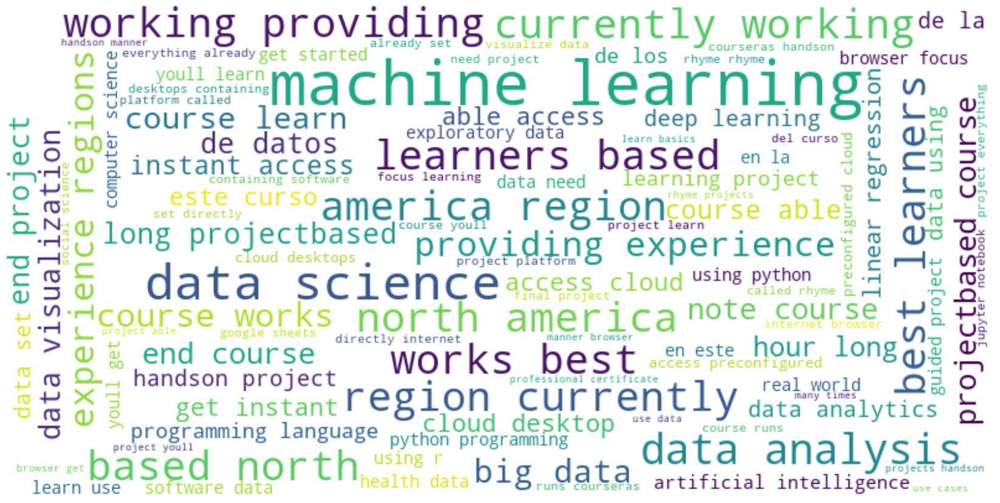

In [ ]:
top_topic_bigram_most_common = top_topic_bigram_counter.most_common(100)
top_topic_bigram_counter_ = dict([(' '.join(word_split), count) for word_split, count in top_topic_bigram_most_common])
wordcloud = WordCloud(background_color ='white', max_font_size=50, stopwords = stopword_list, width=800, height=400).generate_from_frequencies(top_topic_bigram_counter_)

plt.figure(figsize=(30, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [36]:
top_topic_trigram_counter = get_top_topic_ngram(beginner_coursera_df_clean, n=3)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: generator 'ngrams' raised StopIteration
  


In [37]:
top_topic_trigram_counter.most_common(30)

[(('works', 'best', 'learners'), 60),
 (('best', 'learners', 'based'), 59),
 (('learners', 'based', 'north'), 59),
 (('based', 'north', 'america'), 59),
 (('north', 'america', 'region'), 59),
 (('america', 'region', 'currently'), 59),
 (('region', 'currently', 'working'), 59),
 (('currently', 'working', 'providing'), 59),
 (('working', 'providing', 'experience'), 59),
 (('providing', 'experience', 'regions'), 59),
 (('course', 'works', 'best'), 55),
 (('note', 'course', 'works'), 41),
 (('long', 'projectbased', 'course'), 36),
 (('projectbased', 'course', 'learn'), 30),
 (('hour', 'long', 'projectbased'), 28),
 (('get', 'instant', 'access'), 25),
 (('access', 'cloud', 'desktop'), 24),
 (('end', 'course', 'able'), 18),
 (('instant', 'access', 'preconfigured'), 14),
 (('access', 'preconfigured', 'cloud'), 14),
 (('preconfigured', 'cloud', 'desktops'), 14),
 (('cloud', 'desktops', 'containing'), 14),
 (('desktops', 'containing', 'software'), 14),
 (('containing', 'software', 'data'), 14),

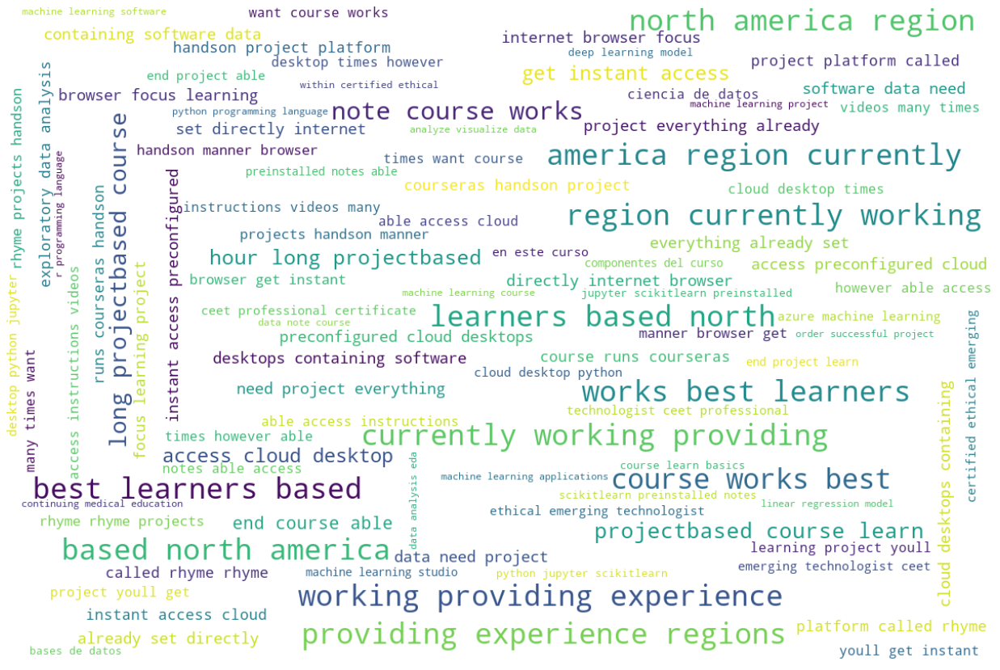

In [ ]:
top_topic_trigram_most_common = top_topic_trigram_counter.most_common(100)
top_topic_trigram_counter_ = dict([(' '.join(word_split), count) for word_split, count in top_topic_trigram_most_common])
wordcloud = WordCloud(background_color ='white', max_font_size=35, stopwords = stopword_list, width=1200, height=800).generate_from_frequencies(top_topic_trigram_counter_)

plt.figure(figsize=(30, 15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

By the end of this section, we would have extracted all the necessary data from Coursera that will be used for the design of the introductory course.

# 4-Identifying most important skills for entry level jobs from the Kaggle survey

In this section, we extracted skills from the Kaggle survey that corresponded to respondents that hold a Master's degree, that have less than 5 years of experience and that are highly paid. This will help us include important and useful skills in our introductory course.

In [38]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
try:
    import statsmodels.api as sm
except:
    !pip install statsmodels
    import statsmodels.api as sm
%matplotlib inline
from scipy import stats
import math
import random
import statistics

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Extract the skills from Kaggle data corresponding to Master degree graduates, with < 5 years of experience, who are paid the highest. 

In [39]:
# Read the CSV file and store it as a dataframe, df.
df = pd.read_csv('Kaggle_Salary.csv')

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (0,3,7,19,34,47,49,50,51,52,53,54,68,73,77,81,94,96,109,114,115,130,139,146,147,153,154,167,171,175,180,193,206,212,219,224,228,231,232,245) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


The first five rows of the dataset are displayed to visually examine the data and see which columns might be relevant for our analysis.

In [40]:
df.head()

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,...,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT,Q10_Encoded,Q10_buckets
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,What is your gender? - Prefer to self-describe...,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,Select the title most similar to your current ...,What is the size of the company where you are ...,Approximately how many individuals are respons...,Does your current employer incorporate machine...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,Select any activities that make up an importan...,What is your current yearly compensation (appr...,Approximately how much money have you spent on...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,Who/what are your favorite media sources that ...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,On which platforms have you begun or completed...,...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which of the following machine learning produc...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,Which automated machine learning tools (or par...,

Relevant columns:
* **Education**: Q4
* **Experience**: Q15 and Q23
* **Salary**: Q10_buckets
* **Skills**: Q16, Q18, Q20, Q24, Q28, Q32, Q33, Q34

| Q# | Question                                                                                                        | Renamed column |
|----|-----------------------------------------------------------------------------------------------------------------|---------------------|
| Q4  | What is the highest level of formal education that you have attained or plan to attain within the next 2 years?    | **education**                |
| Q15  | How long have you been writing code to analyze data (at work or at school)?                               | **coding_experience**              |
| Q23  | For how many years have you used machine learning methods?                                                      | **ML_experience**             |
| Q10_buckets  | What is your current yearly compensation (USD)? | **salary**     |
| Q16 (Part 1-11) | Which of the following integrated development environments (IDE's) do you use on a regular basis?       | **skills 1** |
| Q18 (Part 1-11) | What programming languages do you use on a regular basis?| **skills 2**   |
| Q20 (Part 1-11) | What data visualization libraries or tools do you use on a regular basis?| **skills 3**|       |
| Q24 (Part 1-11) | Which of the following ML algorithms do you use on a regular basis?| **skills 4**|       |
| Q28 (Part 1-11) | Which of the following machine learning frameworks do you use on a regular basis?| **skills 5**|       |
| Q32 (Part 1-11) | Which of the following machine learning products do you use on a regular basis?| **skills 6**|       |
| Q33 (Part 1-11) | Which automated machine learning tools (or partial AutoML tools) do you use on a regular basis?| **skills 7**|       |
| Q34 (Part 1-11) | Which of the following relational database products do you use on a regular basis?| **skills 8**|       |

In [41]:
# Filter only the relevant columns and rename them.
df = df[['Q4', 'Q15', 'Q23', 'Q10_buckets', 
         'Q16_Part_1', 'Q16_Part_2', 'Q16_Part_3', 'Q16_Part_4', 'Q16_Part_5', 'Q16_Part_6', 'Q16_Part_7', 
         'Q16_Part_8', 'Q16_Part_9', 'Q16_Part_10',
         'Q18_Part_1', 'Q18_Part_2', 'Q18_Part_3', 'Q18_Part_4', 'Q18_Part_5', 'Q18_Part_6', 'Q18_Part_7', 
         'Q18_Part_8', 'Q18_Part_9', 'Q18_Part_10', 
         'Q20_Part_1', 'Q20_Part_2', 'Q20_Part_3', 'Q20_Part_4', 'Q20_Part_5', 'Q20_Part_6', 'Q20_Part_7', 
         'Q20_Part_8', 'Q20_Part_9', 'Q20_Part_10',
         'Q24_Part_1', 'Q24_Part_2', 'Q24_Part_3', 'Q24_Part_4', 'Q24_Part_5', 'Q24_Part_6', 'Q24_Part_7', 
         'Q24_Part_8', 'Q24_Part_9', 'Q24_Part_10', 
         'Q28_Part_1', 'Q28_Part_2', 'Q28_Part_3', 'Q28_Part_4', 'Q28_Part_5', 'Q28_Part_6', 'Q28_Part_7',
         'Q28_Part_8', 'Q28_Part_9', 'Q28_Part_10', 
         'Q32_Part_1', 'Q32_Part_2', 'Q32_Part_3', 'Q32_Part_4', 'Q32_Part_5', 'Q32_Part_6', 'Q32_Part_7', 
         'Q32_Part_8', 'Q32_Part_9', 'Q32_Part_10', 
         'Q33_Part_1', 'Q33_Part_2', 'Q33_Part_3', 'Q33_Part_4', 'Q33_Part_5', 'Q33_Part_6', 'Q33_Part_7', 
         'Q33_Part_8', 'Q33_Part_9', 'Q33_Part_10',
         'Q34_Part_1', 'Q34_Part_2', 'Q34_Part_3', 'Q34_Part_4', 'Q34_Part_5', 'Q34_Part_6', 'Q34_Part_7', 
         'Q34_Part_8', 'Q34_Part_9', 'Q34_Part_10']]
df.columns = ['education', 'coding_experience', 'ML_experience', 'salary',
              'Q16_Jupyter', 'Q16_RStudio', 'Q16_PyCharm', 'Q16_Atom', 'Q16_MATLAB', 'Q16_Visual_Studio',
              'Q16_Spyder', 'Q16_Vim_Emacs', 'Q16_Notepad++', 'Q16_Sublime_Text', 
              'Q18_Python', 'Q18_R', 'Q18_SQL', 'Q18_C', 'Q18_C++', 'Q18_Java', 'Q18_Javascript', 
              'Q18_TypeScript', 'Q18_Bash', 'Q18_MATLAB', 
              'Q20_Ggplot_ggplot2', 'Q20_Matplotlib', 'Q20_Altair', 'Q20_Shiny', 'Q20_D3.js', 'Q20_Plotly_PlotlyExpress', 
              'Q20_Bokeh', 'Q20_Seaborn', 'Q20_Geoplotlib', 'Q20_Leaflet_Folium',
              'Q24_Linear_Logistic_Regression', 'Q24_Decision_Trees_Random_Forests', 'Q24_Gradient_Boosting_Machines', 
              'Q24_Bayesian_Approaches', 'Q24_Evolutionary_Approaches', 'Q24_Dense_Neural_Networks', 
              'Q24_Convolutional_Neural_Networks', 'Q24_Generative_Adversarial_Networks', 'Q24_Recurrent_Neural_Networks',
              'Q24_Transformer_Networks', 
              'Q28_Scikit-learn', 'Q28_TensorFlow', 'Q28_Keras', 'Q28_RandomForest', 'Q28_Xgboost', 'Q28_PyTorch', 
              'Q28_Caret', 'Q28_LightGBM', 'Q28_Spark_MLib', 'Q28_Fast.ai', 
              'Q32_SAS', 'Q32_Cloudera', 'Q32_Azure_ML_Studio', 'Q32_GoogleCloud_ML_Engine', 'Q32_GoogleCloud_Vision', 
              'Q32_GoogleCloud_SpeechtoText', 'Q32_GoogleCloud_Natural_Language', 
              'Q32_RapidMiner', 'Q32_GoogleCloud_Translation', 'Q32_Amazon_SageMaker', 
              'Q33_Google_AutoML', 'Q33_H20_Driverless_AI ', 'Q33_Databricks_AutoML', 'Q33_DataRobot_AutoML', 
              'Q33_Tpot', 'Q33_Auto-Keras', 'Q33_Auto-Sklearn', 'Q33_Auto_ml', 'Q33_Xcessiv', 'Q33_MLbox',
              'Q34_MySQL', 'Q34_PostgresSQL', 'Q34_SQLite', 'Q34_Microsoft_SQL_Server', 'Q34_Oracle_Database', 
              'Q34_Microsoft_Access', 'Q34_AWS_Relational_Database_Service', 
              'Q34_AWS_DynamoDB', 'Q34_Azure_SQL_Database', 'Q34_GoogleCloud_SQL']

In [42]:
# Remove the first row
df = df.drop(df.index[0])

In [43]:
# Diaplay first 5 rows of the new dataframe.
df.head()

,education,coding_experience,ML_experience,salary,Q16_Jupyter,Q16_RStudio,Q16_PyCharm,Q16_Atom,Q16_MATLAB,Q16_Visual_Studio,Q16_Spyder,Q16_Vim_Emacs,Q16_Notepad++,Q16_Sublime_Text,Q18_Python,Q18_R,Q18_SQL,Q18_C,Q18_C++,Q18_Java,Q18_Javascript,Q18_TypeScript,Q18_Bash,Q18_MATLAB,Q20_Ggplot_ggplot2,Q20_Matplotlib,Q20_Altair,Q20_Shiny,Q20_D3.js,Q20_Plotly_PlotlyExpress,Q20_Bokeh,Q20_Seaborn,Q20_Geoplotlib,Q20_Leaflet_Folium,Q24_Linear_Logistic_Regression,Q24_Decision_Trees_Random_Forests,Q24_Gradient_Boosting_Machines,Q24_Bayesian_Approaches,Q24_Evolutionary_Approaches,Q24_Dense_Neural_Networks,...,Q28_Scikit-learn,Q28_TensorFlow,Q28_Keras,Q28_RandomForest,Q28_Xgboost,Q28_PyTorch,Q28_Caret,Q28_LightGBM,Q28_Spark_MLib,Q28_Fast.ai,Q32_SAS,Q32_Cloudera,Q32_Azure_ML_Studio,Q32_GoogleCloud_ML_Engine,Q32_GoogleCloud_Vision,Q32_GoogleCloud_SpeechtoText,Q32_GoogleCloud_Natural_Language,Q32_RapidMiner,Q32_GoogleCloud_Translation,Q32_Amazon_SageMaker,Q33_Google_AutoML,Q33_H20_Driverless_AI,Q33_Databricks_AutoML,Q33_DataRobot_AutoML,Q33_Tpot,Q33_Auto-Keras,Q33_Auto-Sklearn,Q33_Auto_ml,Q33_Xcessiv,Q33_MLbox,Q34_MySQL,Q34_PostgresSQL,Q34_SQLite,Q34_Microsoft_SQL_Server,Q34_Oracle_Database,Q34_Microsoft_Access,Q34_AWS_Relational_Database_Service,Q34_AWS_DynamoDB,Q34_Azure_SQL_Database,Q34_GoogleCloud_SQL
1,Master’s degree,1-2 years,1-2 years,"30,000-39,999","Jupyter (JupyterLab, Jupyter Notebooks, etc)",RStudio,PyCharm,NaN,MATLAB,NaN,Spyder,NaN,NaN,NaN,Python,R,SQL,NaN,NaN,Java,Javascript,NaN,NaN,MATLAB,NaN,Matplotlib,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Linear or Logistic Regression,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Professional degree,I have never written code,NaN,"0-9,999",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Master’s degree,1-2 years,2-3 years,">250,000","Jupyter (JupyterLab, Jupyter Notebooks, etc)",NaN,NaN,NaN,NaN,Visual Studio / Visual Studio Code,NaN,NaN,NaN,NaN,Python,R,SQL,NaN,NaN,NaN,NaN,NaN,Bash,NaN,Ggplot / ggplot2,Matplotlib,NaN,NaN,NaN,NaN,NaN,Seaborn,NaN,NaN,Linear or Logistic Regression,NaN,NaN,NaN,NaN,NaN,...,Scikit-learn,TensorFlow,Keras,RandomForest,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Azure Machine Learning Studio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Azure SQL Database,NaN
4,Bachelor’s degree,< 1 years,< 1 years,"0-9,999","Jupyter (JupyterLab, Jupyter Notebooks, etc)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Python,NaN,SQL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Matplotlib,NaN,NaN,NaN,Plotly / Plotly Express,NaN,Seaborn,NaN,NaN,Linear or Logistic Regression,Decision Trees or Random Forests,"Gradient Boosting Machines (xgboost, lightgbm,...",NaN,NaN,NaN,...,Scikit-learn,NaN,NaN,RandomForest,Xgboost,NaN,NaN,LightGBM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Master’s degree,20+ years,10-15 years,"60,000-69,999",NaN,RStudio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Python,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ggplot / ggplot2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Linear or Logistic Regression,Decision Trees or Random Forests,"Gradient Boosting Machines (xgboost, lightgbm,...",Bayesian Approaches,NaN,NaN,...,Scikit-learn,TensorFlow,Keras,RandomForest,Xgboost,NaN,Caret,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,RapidMiner,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Auto-Keras,NaN,NaN,NaN,NaN,NaN,PostgresSQL,NaN,NaN,NaN,NaN,AWS Relational Database Service,NaN,NaN,NaN


#### Data Cleaning

In [44]:
# Check for missing values for each columns.
pd.set_option('max_rows', None) # Set the dataframe so that all rows are displayed
df.isnull().sum()

education                                  0
coding_experience                       1075
ML_experience                           1956
salary                                     0
Q16_Jupyter                             4682
Q16_RStudio                             9006
Q16_PyCharm                             9354
Q16_Atom                               11446
Q16_MATLAB                             11394
Q16_Visual_Studio                       9094
Q16_Spyder                             10354
Q16_Vim_Emacs                          11034
Q16_Notepad++                           9865
Q16_Sublime_Text                       10586
Q18_Python                              3134
Q18_R                                   8845
Q18_SQL                                 7069
Q18_C                                  11548
Q18_C++                                11141
Q18_Java                               10899
Q18_Javascript                         10777
Q18_TypeScript                         12144
Q18_Bash  

In [45]:
df.shape

(12497, 84)

We have dropped the missing values for "coding_experience" and "ML_experience" features (1075 and 1956 null values respectively) from our analysis.

In [46]:
# Remove null values
def drop_na(df, columns):
    initial = df.shape
    print("Before dropping NaN", ": ", initial)
    for column in columns:
        df.dropna(how='any', subset=[column], inplace=True)
        print("After dropping NaN for", column, ": ", df.shape)
    final = df.shape
    return print("Total number of missing values removed: ", str(initial[0]-final[0]))

In [47]:
drop_na(df, ['coding_experience', 'ML_experience'])

Before dropping NaN :  (12497, 84)
After dropping NaN for coding_experience :  (11422, 84)
After dropping NaN for ML_experience :  (10541, 84)
Total number of missing values removed:  1956


To deal with missing values for columns Q16 to Q34, since they are the skills columns, we will convert those columns as binary variables, so that missing values are replaced with 0 and text values are replaced with 1. First we make a list that contains the names of all the skills columns. Then, for each column in this list, NaN's are replaced with 0 and the text values are replaced with 1.

In [48]:
# Make a list that contains the names of the columns with null values (skills columns).
skill_columns = []
for column in df.columns:
    for row in df[column]:
        if row is np.nan:
            skill_columns.append(column)
    
skill_columns = list(set(skill_columns))
skill_columns = sorted(skill_columns)

print(skill_columns)

['Q16_Atom', 'Q16_Jupyter', 'Q16_MATLAB', 'Q16_Notepad++', 'Q16_PyCharm', 'Q16_RStudio', 'Q16_Spyder', 'Q16_Sublime_Text', 'Q16_Vim_Emacs', 'Q16_Visual_Studio', 'Q18_Bash', 'Q18_C', 'Q18_C++', 'Q18_Java', 'Q18_Javascript', 'Q18_MATLAB', 'Q18_Python', 'Q18_R', 'Q18_SQL', 'Q18_TypeScript', 'Q20_Altair', 'Q20_Bokeh', 'Q20_D3.js', 'Q20_Geoplotlib', 'Q20_Ggplot_ggplot2', 'Q20_Leaflet_Folium', 'Q20_Matplotlib', 'Q20_Plotly_PlotlyExpress', 'Q20_Seaborn', 'Q20_Shiny', 'Q24_Bayesian_Approaches', 'Q24_Convolutional_Neural_Networks', 'Q24_Decision_Trees_Random_Forests', 'Q24_Dense_Neural_Networks', 'Q24_Evolutionary_Approaches', 'Q24_Generative_Adversarial_Networks', 'Q24_Gradient_Boosting_Machines', 'Q24_Linear_Logistic_Regression', 'Q24_Recurrent_Neural_Networks', 'Q24_Transformer_Networks', 'Q28_Caret', 'Q28_Fast.ai', 'Q28_Keras', 'Q28_LightGBM', 'Q28_PyTorch', 'Q28_RandomForest', 'Q28_Scikit-learn', 'Q28_Spark_MLib', 'Q28_TensorFlow', 'Q28_Xgboost', 'Q32_Amazon_SageMaker', 'Q32_Azure_ML_Studi

In [49]:
for column in skill_columns:
    # replace null values with 0
    df[column] = df[column].fillna(0)
    # replace text values with 1. The text vales can be accessed using the unique() function and finding the string value using isinstance() function
    for unique_value in df[column].unique():
        if isinstance(unique_value, str):
            text = unique_value
            df[column] = df[column].replace(text, 1)

# display the transformed dataset df
df.head()

,education,coding_experience,ML_experience,salary,Q16_Jupyter,Q16_RStudio,Q16_PyCharm,Q16_Atom,Q16_MATLAB,Q16_Visual_Studio,Q16_Spyder,Q16_Vim_Emacs,Q16_Notepad++,Q16_Sublime_Text,Q18_Python,Q18_R,Q18_SQL,Q18_C,Q18_C++,Q18_Java,Q18_Javascript,Q18_TypeScript,Q18_Bash,Q18_MATLAB,Q20_Ggplot_ggplot2,Q20_Matplotlib,Q20_Altair,Q20_Shiny,Q20_D3.js,Q20_Plotly_PlotlyExpress,Q20_Bokeh,Q20_Seaborn,Q20_Geoplotlib,Q20_Leaflet_Folium,Q24_Linear_Logistic_Regression,Q24_Decision_Trees_Random_Forests,Q24_Gradient_Boosting_Machines,Q24_Bayesian_Approaches,Q24_Evolutionary_Approaches,Q24_Dense_Neural_Networks,...,Q28_Scikit-learn,Q28_TensorFlow,Q28_Keras,Q28_RandomForest,Q28_Xgboost,Q28_PyTorch,Q28_Caret,Q28_LightGBM,Q28_Spark_MLib,Q28_Fast.ai,Q32_SAS,Q32_Cloudera,Q32_Azure_ML_Studio,Q32_GoogleCloud_ML_Engine,Q32_GoogleCloud_Vision,Q32_GoogleCloud_SpeechtoText,Q32_GoogleCloud_Natural_Language,Q32_RapidMiner,Q32_GoogleCloud_Translation,Q32_Amazon_SageMaker,Q33_Google_AutoML,Q33_H20_Driverless_AI,Q33_Databricks_AutoML,Q33_DataRobot_AutoML,Q33_Tpot,Q33_Auto-Keras,Q33_Auto-Sklearn,Q33_Auto_ml,Q33_Xcessiv,Q33_MLbox,Q34_MySQL,Q34_PostgresSQL,Q34_SQLite,Q34_Microsoft_SQL_Server,Q34_Oracle_Database,Q34_Microsoft_Access,Q34_AWS_Relational_Database_Service,Q34_AWS_DynamoDB,Q34_Azure_SQL_Database,Q34_GoogleCloud_SQL
1,Master’s degree,1-2 years,1-2 years,"30,000-39,999",1,1,1,0,1,0,1,0,0,0,1,1,1,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Master’s degree,1-2 years,2-3 years,">250,000",1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,Bachelor’s degree,< 1 years,< 1 years,"0-9,999",1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Master’s degree,20+ years,10-15 years,"60,000-69,999",0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,...,1,1,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0
6,Master’s degree,3-5 years,2-3 years,"10,000-19,999",1,0,0,0,0,0,1,0,1,1,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,1,0,0,1,0,0,0,0,1,...,1,1,1,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,1,1,1,1,0,0,1,1,0,0,0,0,0,0,0,0


For the 'education' column, there are seven groups. I have only kept the "Master's degree" group since it is only relevant for our analysis.

In [50]:
df['education'].value_counts()

Master’s degree                                                      5020
Bachelor’s degree                                                    2758
Doctoral degree                                                      1850
Professional degree                                                   365
Some college/university study without earning a bachelor’s degree     326
I prefer not to answer                                                128
No formal education past high school                                   94
Name: education, dtype: int64

In [51]:
# Keep only the group "Master's degree"
df = df[(df['education'] == "Master’s degree")]

We also want to keep only the participants who have less than 5 years of professional experience. There are two relevant columns for professional experience: **coding_experience** and **ML_experience**. We will look at both of them.

#### 1) Coding Experience

For the years of coding experience, we can see that there are 7 groups. We will only keep the "I have never written code", "<1 years", "1-2 years", and "3-5 years".

In [52]:
df['coding_experience'].value_counts()

3-5 years      1446
1-2 years      1317
5-10 years      845
< 1 years       828
10-20 years     395
20+ years       189
Name: coding_experience, dtype: int64

In [53]:
# Filter only the participants with less than 5 years of coding experience.
df_coding = df[(df['coding_experience'] == "3-5 years") | (df['coding_experience'] == "1-2 years") | 
       (df['coding_experience'] == "< 1 years") | (df['coding_experience'] == "I have never written code")]

Now we want to see the participants with the highest salary. We have only kept those who earned more than 80K.

In [54]:
df_coding['salary'].value_counts()

0-9,999             1135
10,000-19,999        472
20,000-29,999        352
40,000-49,999        244
30,000-39,999        241
50,000-59,999        217
60,000-69,999        177
100,000-124,999      174
70,000-79,999        163
80,000-89,999        127
90,000-99,999        103
125,000-149,9991      98
150,000-199,999       51
>250,000              21
200,000-249,999       16
Name: salary, dtype: int64

In [55]:
df_coding_highest_salary = df_coding[(df_coding['salary'] == "80,000-89,999") | (df_coding['salary'] == "90,000-99,999") | 
                       (df_coding['salary'] == "100,000-124,999") | (df_coding['salary'] == "125,000-149,9991") | 
                       (df_coding['salary'] == "150,000-199,999") | (df_coding['salary'] == "200,000-249,999") | 
                       (df_coding['salary'] == ">250,000")]

In [56]:
df_coding_highest_salary.shape

(590, 84)

In [57]:
df_coding_highest_salary.head()

,education,coding_experience,ML_experience,salary,Q16_Jupyter,Q16_RStudio,Q16_PyCharm,Q16_Atom,Q16_MATLAB,Q16_Visual_Studio,Q16_Spyder,Q16_Vim_Emacs,Q16_Notepad++,Q16_Sublime_Text,Q18_Python,Q18_R,Q18_SQL,Q18_C,Q18_C++,Q18_Java,Q18_Javascript,Q18_TypeScript,Q18_Bash,Q18_MATLAB,Q20_Ggplot_ggplot2,Q20_Matplotlib,Q20_Altair,Q20_Shiny,Q20_D3.js,Q20_Plotly_PlotlyExpress,Q20_Bokeh,Q20_Seaborn,Q20_Geoplotlib,Q20_Leaflet_Folium,Q24_Linear_Logistic_Regression,Q24_Decision_Trees_Random_Forests,Q24_Gradient_Boosting_Machines,Q24_Bayesian_Approaches,Q24_Evolutionary_Approaches,Q24_Dense_Neural_Networks,...,Q28_Scikit-learn,Q28_TensorFlow,Q28_Keras,Q28_RandomForest,Q28_Xgboost,Q28_PyTorch,Q28_Caret,Q28_LightGBM,Q28_Spark_MLib,Q28_Fast.ai,Q32_SAS,Q32_Cloudera,Q32_Azure_ML_Studio,Q32_GoogleCloud_ML_Engine,Q32_GoogleCloud_Vision,Q32_GoogleCloud_SpeechtoText,Q32_GoogleCloud_Natural_Language,Q32_RapidMiner,Q32_GoogleCloud_Translation,Q32_Amazon_SageMaker,Q33_Google_AutoML,Q33_H20_Driverless_AI,Q33_Databricks_AutoML,Q33_DataRobot_AutoML,Q33_Tpot,Q33_Auto-Keras,Q33_Auto-Sklearn,Q33_Auto_ml,Q33_Xcessiv,Q33_MLbox,Q34_MySQL,Q34_PostgresSQL,Q34_SQLite,Q34_Microsoft_SQL_Server,Q34_Oracle_Database,Q34_Microsoft_Access,Q34_AWS_Relational_Database_Service,Q34_AWS_DynamoDB,Q34_Azure_SQL_Database,Q34_GoogleCloud_SQL
3,Master’s degree,1-2 years,2-3 years,">250,000",1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
11,Master’s degree,3-5 years,2-3 years,"90,000-99,999",1,0,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0,1,0,0,...,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
25,Master’s degree,1-2 years,2-3 years,"90,000-99,999",1,0,0,1,0,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,1,1,0,1,...,1,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
45,Master’s degree,1-2 years,1-2 years,"80,000-89,999",1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,1,0,0,1,1,0,0,0,1,0,0,0,1,1,1,1,0,0,1,...,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,1
50,Master’s degree,3-5 years,4-5 years,"150,000-199,999",1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [58]:
import matplotlib.pyplot as plt
df_coding_skills = df_coding_highest_salary[skill_columns]
coding_count = df_coding_skills.sum()
coding_count = coding_count.sort_values(ascending=False)

# Get the list of skills (Remove Q#)
skill_list = []
for column in coding_count.index:
    i = column.find('_')
    skill_list.append(column[i+1:])

# Make a table with the skills and count
data = {'Skills':  skill_list, 'Count': coding_count.values.tolist()}
df_coding_count = pd.DataFrame(data, columns = ["Skills", "Count"])

df_coding_count

,Skills,Count
0,Python,516
1,Linear_Logistic_Regression,451
2,Jupyter,432
3,Matplotlib,394
4,Scikit-learn,392
5,Decision_Trees_Random_Forests,379
6,SQL,323
7,Seaborn,283
8,Gradient_Boosting_Machines,268
9,R,231


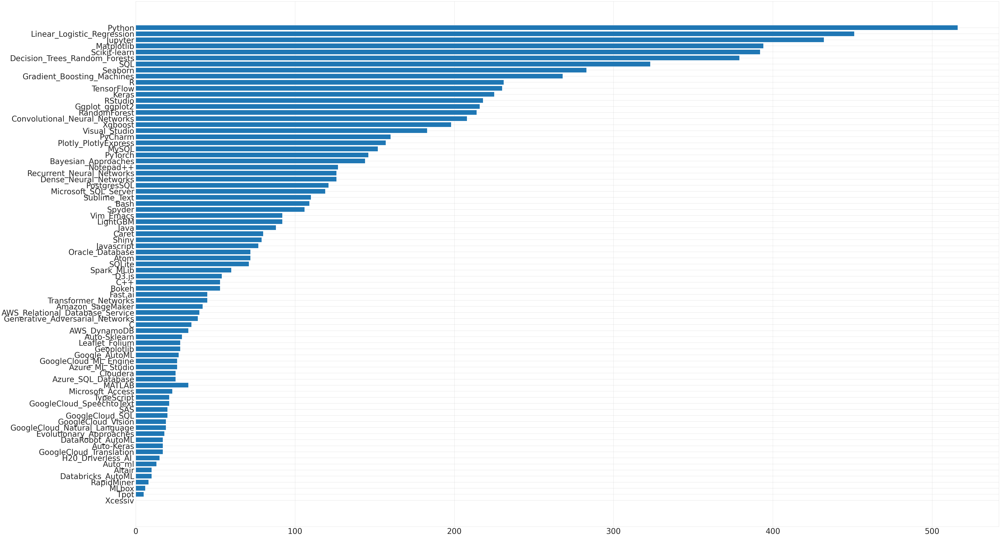

In [64]:
plt.figure(figsize=(80, 50))
plt.barh(df_coding_count["Skills"][::-1], df_coding_count["Count"][::-1])
plt.show()

In [65]:
# Get the list of skills
print(skill_list)

['Python', 'Linear_Logistic_Regression', 'Jupyter', 'Matplotlib', 'Scikit-learn', 'Decision_Trees_Random_Forests', 'SQL', 'Seaborn', 'Gradient_Boosting_Machines', 'R', 'TensorFlow', 'Keras', 'RStudio', 'Ggplot_ggplot2', 'RandomForest', 'Convolutional_Neural_Networks', 'Xgboost', 'Visual_Studio', 'PyCharm', 'Plotly_PlotlyExpress', 'MySQL', 'PyTorch', 'Bayesian_Approaches', 'Notepad++', 'Recurrent_Neural_Networks', 'Dense_Neural_Networks', 'PostgresSQL', 'Microsoft_SQL_Server', 'Sublime_Text', 'Bash', 'Spyder', 'Vim_Emacs', 'LightGBM', 'Java', 'Caret', 'Shiny', 'Javascript', 'Oracle_Database', 'Atom', 'SQLite', 'Spark_MLib', 'D3.js', 'C++', 'Bokeh', 'Fast.ai', 'Transformer_Networks', 'Amazon_SageMaker', 'AWS_Relational_Database_Service', 'Generative_Adversarial_Networks', 'C', 'MATLAB', 'AWS_DynamoDB', 'Auto-Sklearn', 'Leaflet_Folium', 'Geoplotlib', 'Google_AutoML', 'GoogleCloud_ML_Engine', 'Azure_ML_Studio', 'Cloudera', 'Azure_SQL_Database', 'MATLAB', 'Microsoft_Access', 'TypeScript', '

# 5- Combining skills from Coursera and Kaggle

Finally, we combined the skills and topics from the beginner Coursera courses to those extracted from Kaggle. We also added some relevant business skills manually.

This final list of skills was compared to the skills taught in MIE1624H, and the course was updated accordingly. 

In [66]:
import pandas as pd
import numpy as np

In [67]:
df_coursera = pd.read_csv('coursera_skills.csv')
df_coursera.drop(columns='Unnamed: 0', inplace=True)
df_coursera

,skills,Frequency
0,machine learning,217
1,python programming,194
2,data analysis,141
3,data science,119
4,deep learning,99
5,data visualization (dataviz),89
6,tensorflow,71
7,r programming,68
8,statistics,46
9,artificial intelligence (ai),44


In [68]:
# Coursera skills
coursera_skills = []

for skill in df_coursera.skills:
    coursera_skills.append(skill) # append the skill into the coursera_skills list

print(coursera_skills)

['machine learning', 'python programming', 'data analysis', 'data science', 'deep learning', 'data visualization (dataviz)', 'tensorflow', 'r programming', 'statistics', 'artificial intelligence (ai)', 'sql', 'keras', 'linear regression', 'regression analysis', 'exploratory data analysis', 'artificial neural network', 'big data', 'statistical hypothesis testing', 'computer vision', 'pandas', 'natural language processing', 'convolutional neural network', 'microsoft excel', 'business intelligence', 'predictive analytics', 'analytics', 'statistical analysis', 'numpy', 'data management', 'apache spark', 'data cleansing', 'rstudio', 'scikit-learn', 'computer programming', 'feature engineering', 'random forest', 'database (dbms)', 'algorithms', 'cloud computing', 'data virtualization', 'data structure', 'predictive modelling', 'tableau software', 'relational database', 'mathematical optimization', 'logistic regression', 'recommender systems', 'bigquery', 'google cloud platform', 'business an

In [69]:
# Manually cleaned coursera skills.
# For example, for the skill 'artificial intelligence (ai)', I separated this into "artificial intelligence" and "AI".
coursera_skills = ['machine learning', 'python', 'data analysis', 'data science', 'deep learning', 'data visualization', 'tensorflow', 'R', 
'statistics', 'artificial intelligence', 'AI', 'sql', 'keras', 'linear regression', 'regression analysis', 'exploratory data analysis', 
'artificial neural network', 'big data', 'hypothesis testing', 'computer vision', 'pandas', 'natural language processing', 'convolutional neural network', 
'excel', 'business intelligence', 'predictive analytics', 'analytics', 'statistical analysis', 'numpy', 'data management', 'apache spark', 
'data cleansing', 'rstudio', 'scikit-learn', 'computer programming', 'feature engineering', 'random forest', 'database', 'algorithms', 'cloud computing', 
'data virtualization', 'data structure', 'predictive modelling', 'tableau software', 'relational database', 'mathematical optimization', 'logistic regression', 
'recommender systems', 'bigquery', 'google cloud platform', 'business analytics', 'machine learning algorithms', 'statistical inference', 'decision tree', 
'reinforcement learning', 'data clustering algorithms', 'data manipulation', 'bioinformatics', 'regression', 'debugging', 'pivot table', 'spreadsheet', 
'ethics of artificial intelligence', 'bayesian statistics', 'python libraries', 'supervised learning', 'opencv', 'information engineering', 'hash table', 
'marketing', 'object-oriented programming', 'python syntax and semantics', 'confidence interval', 'forecasting', 'k-means clustering', 'dimensionality reduction', 
'model selection', 'cluster analysis', 'data mining', 'data warehousing', 'mysql', 'linear algebra', 'plotly', 'time series', 'github', 'geographic information system', 
'spatial analysis', 'extraction', 'transformation and loading', 'java', 'database design', 'mapreduce', 'graphs', 'javascript', 'communication', 'analysis of variance', 
'ANOVA', 'web development', 'probability', 'business analysis', 'automl', 'classification', 'power bi', 'jupyter notebook', 'inductive transfer', 'sentiment analysis', 
'graph theory', 'regular expression', 'regex', 'computer science', 'cybersecurity', 'problem solving', 'experimental design', 'machine learning concepts', 
'basic descriptive statistics', 'unsupervised learning', 'clustering', 'pyspark', 'streamlit', 'genomics', 'data modeling', 'artificial intelligence', 
'long short-term memory', 'data pre-processing', 'sagemaker', 'ipython', 'matlab', 'ridge regression', 'function approximation', 'intelligent systems', 
'application programming interfaces', 'matplotlib', 'jobs', 'web scraping', 'tuple', 'cryptography', 'apache hadoop', 'data collection', 'causal inference', 
'chi-squared distribution', 'chi-2', 'visualization', 'azure', 'spark sql', 'simulation', 'business strategy', 'privacy', 'visual analytics', 'google analytics', 
'computational biology', 'inference', 'data quality', 'postgresql', 'topic model', 'ggplot2', 'hyperparameter optimization', 'h2o', 
'relational database management system', 'biostatistics', 'recurrent neural network', 'watson', 'text mining', 'statistical model', 
'markov chain monte carlo', 'cloud storage', 'bayesian inference', 'business analytics', 'object detection', 'normal distribution', 'data model', 
'visualization', 'computer graphics', 'a/b testing', 'management', 'seaborn', 'dashboard', 'sqlite', 'cartography', 'mapping', 'modelling', 'network security', 
'marketing analytics', 'survey design', 'mathematics', 'logic programming', 'applied machine learning', 'dynamic programming', 'combination', 'average', 
'grouped data', "euler’s totient function", 'multivariate time series analysis', 'multivariate analysis', 'statistical classification', 'financial analysis', 
'general linear model', 'generalized linear model', 'ethics', 'deep-learning', 'image processing', 'bayesian optimization', 'summary statistics', 
'hyperparameter tuning', 'document classification', 'natural language toolkit', 'nltk', 'term frequency inverse document frequency', 'tf-idf', 
'image classification', 'multi-class classification', 'lookup table', 'support vector machine', 'risk management', 'network analysis', 'data science', 
'word2vec', 'data preparation', 'functional programming', 'project', 'mongodb', 'data warehouse', 'estimator', 'binary classification', 'decision-making', 
'biopython', 'image segmentation', 'time series forecasting', 'time series models', 'neo4j', 'health informatics', 'classification algorithms', 'graphical model', 
'markov random field', 'map', 'portfolio optimization', 'finance', 'gibbs sampling', 'watson', 'splunk', 'programming principles', 'cloudera', 'discrete mathematics', 
'mathematical logic', 'leadership', 'data architecture', 'ibm cognos analytics', 'apache hive', 'information security', 'json', 'cloud databases', 'esri', 
'list & label', 'data pipelines', 'workflow']


In [70]:
# Skills obtained from the Kaggle data
kaggle_skills = ['Python', 'Linear regression', 'Logistic regression', 'Jupyter', 'Matplotlib', 'Scikit-learn', 'Decision trees', 
                 'Random forest', 'SQL', 'Seaborn', 'Gradient boosting', 'R', 'TensorFlow', 'Keras', 'RStudio', 'Ggplot', 'ggplot2', 
                 'Convolutional neural networks', 'Xgboost', 'Visual studio', 'PyCharm', 'Plotly’, ‘PlotlyExpress', 'MySQL', 'PyTorch', 
                 'Bayesian', 'Notepad++', 'Recurrent neural networks', 'Dense neural networks', 'PostgresQL', 'SQL Server', 'Sublime text', 
                 'Bash', 'Spyder', 'Vim’, ‘Emacs', 'LightGBM', 'Java', 'Caret', 'Shiny', 'Javascript', 'Oracle database', 'Atom', 'SQLite', 
                 'Spark MLib', 'D3.js', 'C++', 'Bokeh', 'Fast.ai', 'Transformer networks', 'Amazon SageMaker', 'AWS Relational Database Service', 
                 'Generative adversarial networks', 'C', 'MATLAB', 'AWS DynamoDB', 'Auto-Sklearn', 'Leaflet Folium', 'Geoplotlib', 'Google AutoML', 
                 'Google Cloud machine learning engine', 'Azure machine learning studio', 'Cloudera', 'Azure SQL database', 'MATLAB', 'Microsoft Access', 
                 'TypeScript', 'Google Cloud speech-to-text', 'SAS', 'Google Cloud SQL', 'Google Cloud vision', 'Google Cloud natural language', 
                 'Evolutionary approaches', 'DataRobot AutoML', 'Auto-Keras', 'Google Cloud translation', 'H20 driverless AI ', 'Auto ml', 'Altair', 
                 'Databricks AutoML', 'RapidMiner', 'MLbox', 'Tpot']

In [71]:
# Other relevant skills not in coursera or kaggle
other_skills = ['tableau', 'hadoop', 'spark', 'theano', 'caffe', 'stata', 'ruby', 'perl', 'scala', 'spss', 'd3', 
                'pig', 'hive', 'shark', 'oozie', 'zookeeper', 'flume', 'mahout', 'nosql', 'hbase', 'cassandra', 
                'communication', 'problem solving', 'project management', 'consulting', 'presentation', 'leadership', 
                'documentation', 'marketing', 'time management', 'collaborate', 'organize', 'powerpoint', 'teamwork']

In [72]:
# Combine all the skills in Coursera, Kaggle, and other skills into one list
all_skills = coursera_skills + kaggle_skills + other_skills

# Convert all words in "all_skills" into lowercase letters
all_skills = [skill.lower() for skill in all_skills]

# Remove duplicate skills in the list
all_skills = list(dict.fromkeys(all_skills))
print(all_skills)

['machine learning', 'python', 'data analysis', 'data science', 'deep learning', 'data visualization', 'tensorflow', 'r', 'statistics', 'artificial intelligence', 'ai', 'sql', 'keras', 'linear regression', 'regression analysis', 'exploratory data analysis', 'artificial neural network', 'big data', 'hypothesis testing', 'computer vision', 'pandas', 'natural language processing', 'convolutional neural network', 'excel', 'business intelligence', 'predictive analytics', 'analytics', 'statistical analysis', 'numpy', 'data management', 'apache spark', 'data cleansing', 'rstudio', 'scikit-learn', 'computer programming', 'feature engineering', 'random forest', 'database', 'algorithms', 'cloud computing', 'data virtualization', 'data structure', 'predictive modelling', 'tableau software', 'relational database', 'mathematical optimization', 'logistic regression', 'recommender systems', 'bigquery', 'google cloud platform', 'business analytics', 'machine learning algorithms', 'statistical inferenc

In [73]:
len(all_skills)

339

# 6- Indeed Web Scraping

In this section, we used the most common skills found in the Coursera dataset to web scrape job postings from the Indeed website. We considered 3 job categories: Data scientist, Data analyst and Data manager. 

The data extracted from these job postings were later used for the design of the Master's Program.

The webscraping segments of the code will be commented out to be able to replicate the initial results that we obtained. Also note that the following code 

## Data Scientist

In [74]:
import pandas as pd
import numpy as np
import requests
import re
import csv
import os
import bs4
from bs4 import BeautifulSoup
import time
import warnings
warnings.simplefilter("ignore")

In [ ]:
# def extract_job_desc(url):
#     time.sleep(0.5)
#     try:
#         page = requests.get(url)
#         soup = BeautifulSoup(page.text, 'lxml')
#         job_desc = soup.find('div', attrs={'id': 'jobDescriptionText'})
#         return job_desc.text.strip()
#     except:
#         return "No job description"


# #This was set to the 3 exp levels.
# exp_lev = ['entry_level' , 'mid_level', 'senior_level']
# columns = ["Page Num", "link", "Experience", "job_title", "company_name", "salary"]
# df_data_scientist = pd.DataFrame(columns = columns)
# #This was set to 500
# last_page = 500
# for exp in exp_lev:
#   for start in range(0, last_page, 10):
#     url = 'https://www.indeed.com/jobs?q=data+scientist&explvl=' + str(exp) + '&start='+ str(start)
#     page = requests.get(url)     
#     print(url)
#     time.sleep(1)  #ensuring at least 1 second between page grabs
#     soup = BeautifulSoup(page.text, "lxml", from_encoding="utf-8")
#     for div in soup.find_all(name="div", attrs={"class":"row"}):
#       sponsered = div.find_all(name="span", attrs={"class":" sponsoredGray "}) 
#       if len(sponsered) == 0:
#         num = (len(df_data_scientist) + 1)
#         print(num) 
                
#         #creating an empty list to hold the data for each posting
#         job_post = []

#         #Page num
#         job_post.append(str(start))

#         #Link
#         for a in div.find_all(name="a", attrs={"data-tn-element":"jobTitle"}):
#           try:
#             link = 'https://www.indeed.com'+ a['href']
#             job_post.append(link)
#           except:
#             link = "None"
#             job_post.append(link)

#         #experience Level
#         job_post.append(exp)

#         #job title
#         for title in div.find_all(name="a", attrs={"data-tn-element":"jobTitle"}):
#           job_post.append(title["title"])

#         # company name
#         company = div.find_all(name="span", attrs={"class":"company"}) 
#         if len(company) > 0:
#           for name in company:
#             job_post.append(name.text.strip()) 
#         else:
#           sec_try = div.find_all(name="span", attrs={"class":"result-link-source"})
#           for span in sec_try:
#             job_post.append(span.text)
#             if len(sec_try) == 0:
#               job_post.append("None")  
            
#         # location name
#         #c = div.find_all(name='span', attrs={'class': 'location'})
#         #for span in c:
#         #     job_post.append(span.text)                  
#         #     if len(c) == 0:
#         #       job_post.append("None")
            
#         # salary
#         salary = div.find_all(name='span', attrs={"class":"salaryText"})
#         if len(salary) > 0:
#           for span in salary:
#             job_post.append(span.text.strip())
#         else:
#           job_post.append("No salary listed")
                            
#         # Job description
#         # e = div.find_all(name='div', attrs={'class': 'jobsearch-jobDescriptionText'})
#         # if len(e) > 0:
#         #     for span in e:
#         #         job_post.append(span.text)  
#         # else:
#         #     job_post.append("No job description")
#         #for a in div.find_all(name="a", attrs={"data-tn-element":"jobTitle"}):
#         #    descript_url = 'https://www.indeed.com'+ a['href']
#         #    job_desc = extract_job_desc(descript_url)
#         #    job_post.append(job_desc)

#         #print(len(job_post))
#         #print(job_post)

#         df_data_scientist.loc[num] = job_post

In [ ]:
# df_data_scientist.head(10)

,Page Num,link,Experience,job_title,company_name,salary
1,0,https://www.indeed.com/company/Horizon-Corp/jo...,entry_level,Data Scientist,Horizon Corp,No salary listed
2,0,https://www.indeed.com/rc/clk?jk=c8c2e55fbcb82...,entry_level,Data Scientist,LiveFree Health,No salary listed
3,0,https://www.indeed.com/rc/clk?jk=e1db6b1e6fa53...,entry_level,Data Scientist,General Mills,No salary listed
4,0,https://www.indeed.com/company/Sam's-Club-(a-d...,entry_level,Data Scientist - Sam's Club Technology,Sam's Club (a division of Walmart),"$65,000 - $132,500 a year"
5,0,https://www.indeed.com/rc/clk?jk=349a3652ec146...,entry_level,Data Scientist,Harvard University,No salary listed
6,0,https://www.indeed.com/rc/clk?jk=0558bb7a3458a...,entry_level,Data Scientist,Mystery.org,No salary listed
7,0,https://www.indeed.com/company/Simplex-Info/jo...,entry_level,Data Scientist,Simplex Info,"$104,045 - $143,505 a year"
8,0,https://www.indeed.com/rc/clk?jk=f51201ad681b4...,entry_level,Data Scientist / Engineer,Harvard University,No salary listed
9,0,https://www.indeed.com/rc/clk?jk=b6506065408f4...,entry_level,Early career data scientist / analyst / statis...,Data Tecnica,No salary listed
10,0,https://www.indeed.com/company/Line-Sniper/job...,entry_level,Sports Betting Data Scientist,Line Sniper,"$2,000 - $4,000 a month"


In [ ]:
# df_data_scientist.shape

(2260, 6)

In [ ]:
# # List possible skill requirements
# skills = all_skills

# # Add columns for skills
# for skill in skills:
#     df_data_scientist[skill] = np.zeros(len(df_data_scientist))

# df_data_scientist = df_data_scientist.reset_index()
# df_data_scientist.head()

,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,data analysis,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,1,0,https://www.indeed.com/company/Horizon-Corp/jo...,entry_level,Data Scientist,Horizon Corp,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0,https://www.indeed.com/rc/clk?jk=c8c2e55fbcb82...,entry_level,Data Scientist,LiveFree Health,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,https://www.indeed.com/rc/clk?jk=e1db6b1e6fa53...,entry_level,Data Scientist,General Mills,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0,https://www.indeed.com/company/Sam's-Club-(a-d...,entry_level,Data Scientist - Sam's Club Technology,Sam's Club (a division of Walmart),"$65,000 - $132,500 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0,https://www.indeed.com/rc/clk?jk=349a3652ec146...,entry_level,Data Scientist,Harvard University,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# # Confirm that column 2 is the column for job detail link
# df_data_scientist.iloc[1,2]

'https://www.indeed.com/rc/clk?jk=c8c2e55fbcb826a3&fccid=415eb13f4d2e2e41&vjs=3'

In [ ]:
# For each job, check its job details/description page
# to collect the required skills.
# Set skill entries to 1 if they are mentioned in job details


# for i in range(len(df_data_scientist)):
#   link = requests.get(df_data_scientist.iloc[i,2])
#   soup = BeautifulSoup(link.text, "lxml")
#   try:
#     text = soup.find('div', class_ = 'jobsearch-jobDescriptionText').text.strip().lower()
#     # Preprocessing, replace punctuations, and replace multiple spaces
#     text = re.sub(r'\,', ' ', text) 
#     text = re.sub('/', ' ', text) 
#     text = re.sub(r'\(', ' ', text) 
#     text = re.sub(r'\)', ' ', text) 
#     text = re.sub(' +',' ',text) 
#   except:
#     text = ""

#   for s in skills :
#     # This is specifically for C++, escape the ++. Convert C++ to C\+\+
#     if any(x in s for x in ['+']):
#       skill = re.escape(s)
#     else:
#       skill = s
#     matching = re.search(r'(?:^|(?<=\s))' + skill + r'(?=\s|$)',text)
#     if matching:
#       df_data_scientist[s][i] = 1
#       #print("matched skill ",s, "for job ",str(i+1))

In [ ]:
# df_data_scientist.to_csv('data_scientist_indeed.csv')
# df_data_scientist.head(10)

,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,data analysis,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,1,0,https://www.indeed.com/company/Horizon-Corp/jo...,entry_level,Data Scientist,Horizon Corp,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0,https://www.indeed.com/rc/clk?jk=c8c2e55fbcb82...,entry_level,Data Scientist,LiveFree Health,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,https://www.indeed.com/rc/clk?jk=e1db6b1e6fa53...,entry_level,Data Scientist,General Mills,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,4,0,https://www.indeed.com/company/Sam's-Club-(a-d...,entry_level,Data Scientist - Sam's Club Technology,Sam's Club (a division of Walmart),"$65,000 - $132,500 a year",1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,5,0,https://www.indeed.com/rc/clk?jk=349a3652ec146...,entry_level,Data Scientist,Harvard University,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,6,0,https://www.indeed.com/rc/clk?jk=0558bb7a3458a...,entry_level,Data Scientist,Mystery.org,No salary listed,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,7,0,https://www.indeed.com/company/Simplex-Info/jo...,entry_level,Data Scientist,Simplex Info,"$104,045 - $143,505 a year",0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,8,0,https://www.indeed.com/rc/clk?jk=f51201ad681b4...,entry_level,Data Scientist / Engineer,Harvard University,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,9,0,https://www.indeed.com/rc/clk?jk=b6506065408f4...,entry_level,Early career data scientist / analyst / statis...,Data Tecnica,No salary listed,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,10,0,https://www.indeed.com/company/Line-Sniper/job...,entry_level,Sports Betting Data Scientist,Line Sniper,"$2,000 - $4,000 a month",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# import matplotlib.pyplot as plt
# df_tech = df_data_scientist[technical_skill]
# tech_count = df_tech.sum()
# tech_count = tech_count.sort_values(ascending=False)
# df_tcount = pd.DataFrame(data=tech_count,columns=["Count"])
# df_tcount.index.name = "Technical Skills"
# df_tcount
# #plt.bar(,tech_count.to_list)

,Count
Technical Skills,
python,477.0
machine learning,449.0
data science,414.0
analytics,411.0
statistics,378.0
...,...
euler’s totient function,0.0
a/b testing,0.0
"vim’, ‘emacs",0.0


In [ ]:
# df_tcount.to_csv('indeed_data_scientist_skills')

Text(0.5, 1.0, 'Technical Skills Required for Data Scientist Jobs on Indeed.ca')

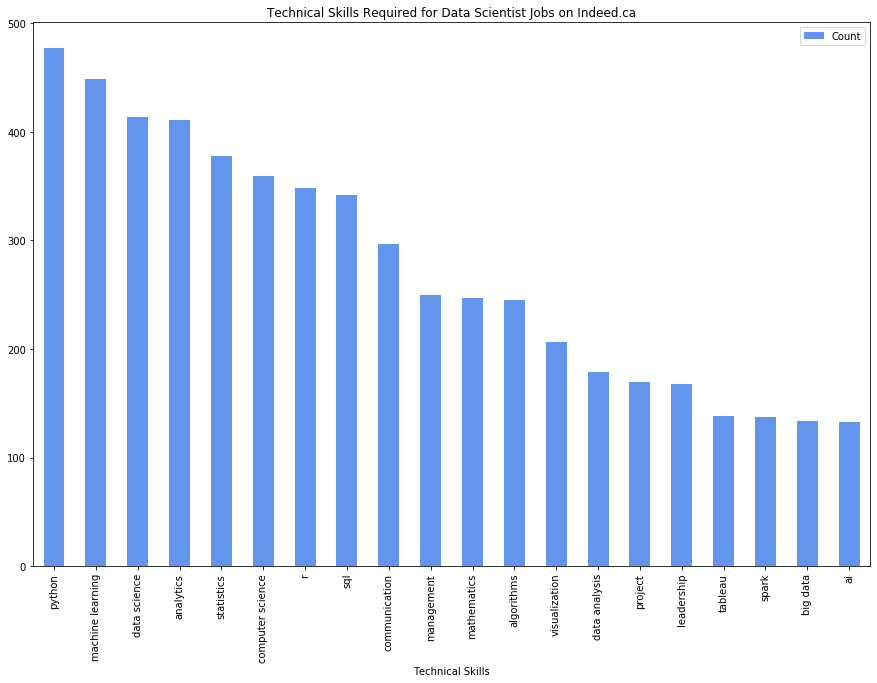

In [ ]:
# df_tcount.head(20).plot(kind="bar", figsize=(15,10), color='cornflowerblue')
# plt.title('Technical Skills Required for Data Scientist Jobs on Indeed.ca')

In [ ]:
# df_bus = df_data_scientist[business_skill]
# bus_count = df_bus.sum()
# bus_count = bus_count.sort_values(ascending=False)
# df_bcount = pd.DataFrame(data=bus_count,columns=["Count"])
# df_bcount.index.name = "Business Skills"
# df_bcount
#plt.bar(,tech_count.to_list)

,Count
Business Skills,
communication,297.0
leadership,168.0
collaborate,159.0
marketing,115.0
presentation,88.0
documentation,70.0
problem solving,62.0
consulting,61.0
project management,39.0


In [ ]:
# df_bcount.to_csv('indeed_data_scientist_skills_business')

Text(0.5, 1.0, 'Business Skills Required for Data Scientist Jobs on Indeed.ca')

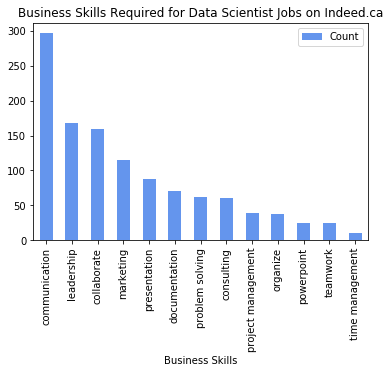

In [ ]:
# df_bcount.plot(kind="bar", color='cornflowerblue')
# plt.title('Business Skills Required for Data Scientist Jobs on Indeed.ca')

## Data Analyst

In [ ]:
# def extract_job_desc(url):
#     time.sleep(0.5)
#     try:
#         page = requests.get(url)
#         soup = BeautifulSoup(page.text, 'lxml')
#         job_desc = soup.find('div', attrs={'id': 'jobDescriptionText'})
#         return job_desc.text.strip()
#     except:
#         return "No job description"


# #This was set to the 3 exp levels.
# exp_lev = ['entry_level' , 'mid_level', 'senior_level']
# columns = ["Page Num", "link", "Experience", "job_title", "company_name", "salary"]
# df_data_analyst = pd.DataFrame(columns=columns)
# #This was set to 500
# last_page = 500

# for exp in exp_lev:
#   for start in range(0, last_page, 10):
#     url = 'https://www.indeed.com/jobs?q=data+analyst&explvl=' + str(exp) + '&start='+ str(start)
#     page = requests.get(url)
#     print(url)
#     time.sleep(1)  #ensuring at least 1 second between page grabs
#     soup = BeautifulSoup(page.text, "lxml", from_encoding="utf-8")
#     for div in soup.find_all(name="div", attrs={"class":"row"}):
#       sponsered = div.find_all(name="span", attrs={"class":" sponsoredGray "}) 
#       if len(sponsered) == 0:
#         num = (len(df_data_analyst) + 1)
#         print(num)
                
#         #creating an empty list to hold the data for each posting
#         job_post = []

#         #Page num
#         job_post.append(str(start))

#         #Link
#         for a in div.find_all(name="a", attrs={"data-tn-element":"jobTitle"}):
#           try:
#             link = 'https://www.indeed.com'+ a['href']
#             job_post.append(link)
#           except:
#             link = "None"
#             job_post.append(link)

#         #experience Level
#         job_post.append(exp)

#         #job title
#         for title in div.find_all(name="a", attrs={"data-tn-element":"jobTitle"}):
#           job_post.append(title["title"])

#         # company name
#         company = div.find_all(name="span", attrs={"class":"company"}) 
#         if len(company) > 0:
#           for name in company:
#             job_post.append(name.text.strip()) 
#         else:
#           sec_try = div.find_all(name="span", attrs={"class":"result-link-source"})
#           for span in sec_try:
#             job_post.append(span.text)
#             if len(sec_try) == 0:
#               job_post.append("None")
            
#         # salary
#         salary = div.find_all(name='span', attrs={"class":"salaryText"})
#         if len(salary) > 0:
#           for span in salary:
#             job_post.append(span.text.strip())
#         else:
#           job_post.append("No salary listed")

#         #print(len(job_post))
#         #print(job_post)

#         df_data_analyst.loc[num] = job_post

In [ ]:
# df_data_analyst.head()

,Page Num,link,Experience,job_title,company_name,salary
1,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Media Data Analyst [Remote],TMP Worldwide,No salary listed
2,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Systems Data Analyst - I,Ingenium Group LLC,$17 - $20 an hour
3,0,https://www.indeed.com/company/Helm360/jobs/Ju...,entry_level,Junior Data Analyst,Helm360,"$80,000 - $90,000 a year"
4,0,https://www.indeed.com/company/Park-Computer-S...,entry_level,entry data analyst,Park Computer Systems Inc,$10 - $22 an hour
5,0,https://www.indeed.com/company/First-Notch-Tec...,entry_level,Entry Level Business Analyst,First Notch Technology LLC,$27 - $35 an hour


In [ ]:
# df_data_analyst.shape

(2253, 6)

In [ ]:
# # List possible skill requirements
# skills = skills = all_skills 

# # Add columns for skills
# for skill in skills:
#     df_data_analyst[skill] = np.zeros(len(df_data_analyst))

# df_data_analyst = df_data_analyst.reset_index()
# df_data_analyst.head()

,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,data analysis,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,1,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Media Data Analyst [Remote],TMP Worldwide,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Systems Data Analyst - I,Ingenium Group LLC,$17 - $20 an hour,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,https://www.indeed.com/company/Helm360/jobs/Ju...,entry_level,Junior Data Analyst,Helm360,"$80,000 - $90,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0,https://www.indeed.com/company/Park-Computer-S...,entry_level,entry data analyst,Park Computer Systems Inc,$10 - $22 an hour,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0,https://www.indeed.com/company/First-Notch-Tec...,entry_level,Entry Level Business Analyst,First Notch Technology LLC,$27 - $35 an hour,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# # Confirm that column 2 is the column for job detail link
# df_data_analyst.iloc[1,2]

'https://www.indeed.com/pagead/clk?mo=r&ad=-6NYlbfkN0BSCI-t0Vj8cJ9erbUL1YB4p0z8TxzivFs0mJXfz4AQvayd6O4ATEgRlmAmcMAAWyUVwM41Xiolsb7I3g2CA-_3D4EXoNpL2u6KFRjt0WLXi6UrTJELhLF2unHa05vb04jfoZutqBTJCy93YvkC8XRnDvOdCAUpwielChfDBNPhwVcALqg2oZ2tIBvP6acrL0YUE9SH1Wyc_iCvUTTkXHIPBvOtjCqGWX8Ayvp0DPji4bTxZEvixwge64ZOw0AphKkOrSPCa_cjuzjcrrQwvGNH2EzK8jqWej8msLhJKAIQTjMFxG6r3ImQyceUO9nMxVxtNgac-VqM0owwrbL0uAPJzHkSaq0tS4zPnKfzHPAEPGEmkFIC2pW5sVYaSn9CRWyOgmXC8kwvZX5Uv0kdij5PJVenfe8zUgng_TEg7IZD9MKanPD_Odu53D89Gv0adpGYaK1puqUh4g==&p=1&fvj=1&vjs=3'

In [ ]:
# # For each job, check its job details/description page
# # to collect the required skills.
# # Set skill entries to 1 if they are mentioned in job details

# for i in range(len(df_data_analyst)):
#   link = requests.get(df_data_analyst.iloc[i,2])
#   soup = BeautifulSoup(link.text, "lxml")
#   try:
#     text = soup.find('div', class_ = 'jobsearch-jobDescriptionText').text.strip().lower()
#     # Preprocessing, replace punctuations, and replace multiple spaces
#     text = re.sub(r'\,', ' ', text) 
#     text = re.sub('/', ' ', text) 
#     text = re.sub(r'\(', ' ', text) 
#     text = re.sub(r'\)', ' ', text) 
#     text = re.sub(' +',' ',text) 
#   except:
#     text = ""

#   for s in skills :
#     # This is specifically for C++, escape the ++. Convert C++ to C\+\+
#     if any(x in s for x in ['+']):
#       skill = re.escape(s)
#     else:
#       skill = s
#     matching = re.search(r'(?:^|(?<=\s))' + skill + r'(?=\s|$)',text)
#     if matching:
#       df_data_analyst[s][i] = 1
#       #print("matched skill ",s, "for job ",str(i+1))

In [ ]:
# df_data_analyst.to_csv('data_analyst_indeed.csv')
# df_data_analyst.head(10)

,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,data analysis,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,1,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Media Data Analyst [Remote],TMP Worldwide,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Systems Data Analyst - I,Ingenium Group LLC,$17 - $20 an hour,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,https://www.indeed.com/company/Helm360/jobs/Ju...,entry_level,Junior Data Analyst,Helm360,"$80,000 - $90,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0,https://www.indeed.com/company/Park-Computer-S...,entry_level,entry data analyst,Park Computer Systems Inc,$10 - $22 an hour,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0,https://www.indeed.com/company/First-Notch-Tec...,entry_level,Entry Level Business Analyst,First Notch Technology LLC,$27 - $35 an hour,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5,6,0,https://www.indeed.com/company/Helm360/jobs/Da...,entry_level,Data Analyst,CCS Global Tech,"$80,000 - $90,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6,7,0,https://www.indeed.com/rc/clk?jk=b192bf946d90b...,entry_level,Encounter Data Analyst,Archcare,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,8,0,https://www.indeed.com/rc/clk?jk=4adb139cc91e8...,entry_level,Junior Data Analyst,Hydromax Usa,$14 an hour,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,9,0,https://www.indeed.com/company/Edgility-Consul...,entry_level,Data Analyst (Remote),Edgility Consulting,$25 - $35 an hour,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
9,10,0,https://www.indeed.com/rc/clk?jk=37a41acbcf9dd...,entry_level,Data Analyst,Mailbird,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# import matplotlib.pyplot as plt
# df_tech = df_data_analyst[technical_skill]
# tech_count = df_tech.sum()
# tech_count = tech_count.sort_values(ascending=False)
# df_tcount = pd.DataFrame(data=tech_count,columns=["Count"])
# df_tcount.index.name = "Technical Skills"
# df_tcount
# #plt.bar(,tech_count.to_list)

,Count
Technical Skills,
management,379.0
communication,330.0
analytics,297.0
sql,293.0
excel,250.0
...,...
regular expression,0.0
graph theory,0.0
sentiment analysis,0.0


In [ ]:
#df_tcount.to_csv('indeed_data_analyst_skills')
#df_tcount_DA  = pd.read_csv('indeed_data_analyst_skills.csv')
#df_tcount_DA

,Technical Skills,Count
0,management,379.0
1,communication,330.0
2,analytics,297.0
3,sql,293.0
4,excel,250.0
...,...,...
325,regular expression,0.0
326,graph theory,0.0
327,sentiment analysis,0.0
328,inductive transfer,0.0


Text(0.5, 1.0, 'Technical Skills Required for Data Analyst Jobs on Indeed.ca')

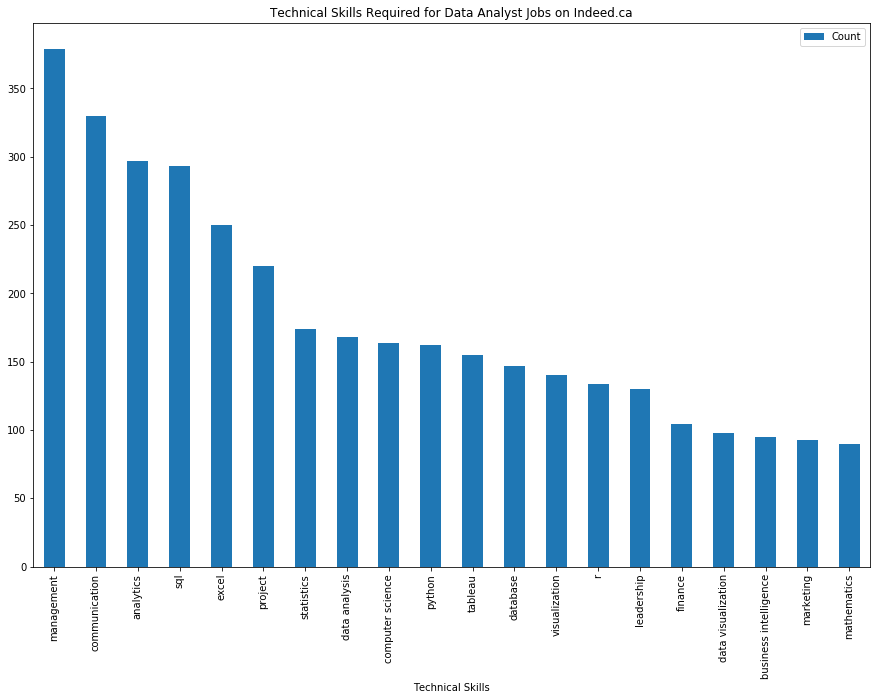

In [ ]:
# df_tcount_DA.head(20).plot(x='Technical Skills', y='Count', kind="bar", figsize=(15,10))
# plt.title('Technical Skills Required for Data Analyst Jobs on Indeed.ca')

In [ ]:
# df_bus = df_data_analyst[business_skill]
# bus_count = df_bus.sum()
# bus_count = bus_count.sort_values(ascending=False)
# df_bcount = pd.DataFrame(data=bus_count,columns=["Count"])
# df_bcount.index.name = "Business Skills"
# df_bcount
# #plt.bar(,tech_count.to_list)

,Count
Business Skills,
communication,330.0
collaborate,131.0
leadership,130.0
documentation,108.0
marketing,93.0
problem solving,72.0
project management,70.0
consulting,62.0
presentation,61.0


In [ ]:
# df_bcount.to_csv('indeed_data_analyst_skills_business')

Text(0.5, 1.0, 'Business Skills Required for Data Analyst Jobs on Indeed.ca')

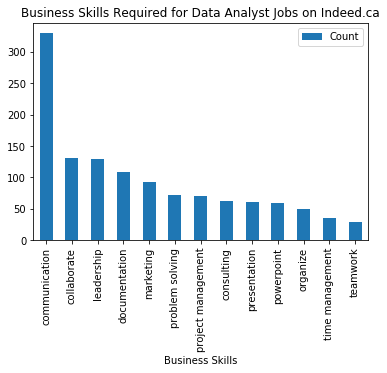

In [ ]:
# df_bcount.plot(kind="bar")
# plt.title('Business Skills Required for Data Analyst Jobs on Indeed.ca')

## Data Manager

In [ ]:
# def extract_job_desc(url):
#     time.sleep(0.5)
#     try:
#         page = requests.get(url)
#         soup = BeautifulSoup(page.text, 'lxml')
#         job_desc = soup.find('div', attrs={'id': 'jobDescriptionText'})
#         return job_desc.text.strip()
#     except:
#         return "No job description"


# #This was set to the 3 exp levels
# exp_lev = ['entry_level' , 'mid_level', 'senior_level']
# columns = ["Page Num", "link", "Experience", "job_title", "company_name", "salary"]
# df_data_manager = pd.DataFrame(columns = columns)
# #This was set to 500
# last_page = 500
# for exp in exp_lev:
#     for start in range(0, last_page, 10):
#         url = 'https://www.indeed.com/jobs?q=data+manager&explvl=' + str(exp) + '&start='+ str(start)
#         page = requests.get(url)     
#         print(url)
#         time.sleep(1)  #ensuring at least 1 second between page grabs
#         soup = BeautifulSoup(page.text, "lxml", from_encoding="utf-8")
#         for div in soup.find_all(name="div", attrs={"class":"row"}):
#           sponsered = div.find_all(name="span", attrs={"class":" sponsoredGray "}) 
#           if len(sponsered) == 0:
#             num = (len(df_data_manager) + 1)
#             print(num) 
                
#             #creating an empty list to hold the data for each posting
#             job_post = [] 
#             #Page num
#             job_post.append(str(start))
#             #Link
#             try:
#               link = 'https://www.indeed.com'+ a['href']
#               job_post.append(link)
#             except:
#               link = None
#               job_post.append(link)
#             #experience Level
#             job_post.append(exp)
#             #job title
#             for a in div.find_all(name="a", attrs={"data-tn-element":"jobTitle"}):
#                 job_post.append(a["title"])
#             # company name
#             company = div.find_all(name="span", attrs={"class":"company"}) 
#             if len(company) > 0: 
#                 for b in company:
#                     job_post.append(b.text.strip()) 
#             else: 
#                 sec_try = div.find_all(name="span", attrs={"class":"result-link-source"})
#                 for span in sec_try:
#                     job_post.append(span.text)               
#                     if len(sec_try) == 0: 
#                         job_post.append("none")  

#             # salary
#             d = div.find_all(name='span', attrs={"class":"salaryText"})
#             if len(d) > 0:
#                 for span in d:
#                     job_post.append(span.text.strip())
#             else:
#                 job_post.append("No salary listed")              

#             df_data_manager.loc[num] = job_post

In [ ]:
# #df_data_manager.drop(columns='level_0', inplace=True)
# df_data_manager.head()

,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,data analysis,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,1,0,None,entry_level,Data Entry Clerk,Demant,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Registrar & Student Data Manager,Notre Dame High School,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0,https://www.indeed.com/company/Notre-Dame-High...,entry_level,Area Manager 2021 IL/WI,Amazon.com Services LLC,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,0,https://www.indeed.com/rc/clk?jk=53e7964fcfeb9...,entry_level,Logistics Coordinator - Full Remote,Shippabo,"$48,000 - $50,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0,https://www.indeed.com/company/Shippabo/jobs/L...,entry_level,Project Data Assistant,Everlight Solar,"$22,000 - $30,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# # List possible skill requirements
# skills = all_skills

# # Add columns for skills
# for skill in skills:
#     df_data_manager[skill] = np.zeros(len(df_data_manager))

# df_data_manager = df_data_manager.reset_index()
# df_data_manager.head()

,level_0,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,0,1,0,None,entry_level,Data Entry Clerk,Demant,No salary listed,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,2,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Registrar & Student Data Manager,Notre Dame High School,No salary listed,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,3,0,https://www.indeed.com/company/Notre-Dame-High...,entry_level,Area Manager 2021 IL/WI,Amazon.com Services LLC,No salary listed,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,4,0,https://www.indeed.com/rc/clk?jk=53e7964fcfeb9...,entry_level,Logistics Coordinator - Full Remote,Shippabo,"$48,000 - $50,000 a year",0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,5,0,https://www.indeed.com/company/Shippabo/jobs/L...,entry_level,Project Data Assistant,Everlight Solar,"$22,000 - $30,000 a year",0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# # The first row had a missing value in the link column, which caused an error when running the next cell. Therefore, this row was dropped.
# df_data_manager = df_data_manager.drop([0])
# df_data_manager = df_data_manager.reset_index()
# df_data_manager.drop(columns='level_0', inplace=True)
# df_data_manager.head()

,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,data analysis,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,2,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Registrar & Student Data Manager,Notre Dame High School,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,0,https://www.indeed.com/company/Notre-Dame-High...,entry_level,Area Manager 2021 IL/WI,Amazon.com Services LLC,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4,0,https://www.indeed.com/rc/clk?jk=53e7964fcfeb9...,entry_level,Logistics Coordinator - Full Remote,Shippabo,"$48,000 - $50,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5,0,https://www.indeed.com/company/Shippabo/jobs/L...,entry_level,Project Data Assistant,Everlight Solar,"$22,000 - $30,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6,0,https://www.indeed.com/rc/clk?jk=a55dc903b8651...,entry_level,Client Reporting Manager (Client Success),LetsGetChecked,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# # Confirm that column 2 is the column for job detail link
# df_data_manager.iloc[1,2]

'https://www.indeed.com/company/Notre-Dame-High-School/jobs/Registrar-Student-Data-Manager-5b41da3127247a14?fccid=7bb6b99d1db13465&vjs=3'

In [ ]:
# # For each job, check its job details/description page
# # to collect the required skills.
# # Set skill entries to 1 if they are mentioned in job details

# for i in range(len(df_data_manager)):
#   link = requests.get(df_data_manager.iloc[i,2])
#   soup = BeautifulSoup(link.text, "lxml")
#   try:
#     text = soup.find('div', class_ = 'jobsearch-jobDescriptionText').text.strip().lower()
#     # Preprocessing, replace punctuations, and replace multiple spaces
#     text = re.sub(r'\,', ' ', text) 
#     text = re.sub('/', ' ', text) 
#     text = re.sub(r'\(', ' ', text) 
#     text = re.sub(r'\)', ' ', text) 
#     text = re.sub(' +',' ',text) 
#   except:
#     text = ""

#   for s in skills :
#     # This is specifically for C++, escape the ++. Convert C++ to C\+\+
#     if any(x in s for x in ['+']):
#       skill = re.escape(s)
#     else:
#       skill = s
#     matching = re.search(r'(?:^|(?<=\s))' + skill + r'(?=\s|$)',text)
#     if matching:
#       df_data_manager[s][i] = 1
#       #print("matched skill ",s, "for job ",str(i+1))

In [ ]:
# df_data_manager.to_csv('data_manager_indeed.csv')
# df_data_manager.head(10)

,index,Page Num,link,Experience,job_title,company_name,salary,machine learning,python,data analysis,...,cassandra,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,2,0,https://www.indeed.com/pagead/clk?mo=r&ad=-6NY...,entry_level,Registrar & Student Data Manager,Notre Dame High School,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3,0,https://www.indeed.com/company/Notre-Dame-High...,entry_level,Area Manager 2021 IL/WI,Amazon.com Services LLC,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,4,0,https://www.indeed.com/rc/clk?jk=53e7964fcfeb9...,entry_level,Logistics Coordinator - Full Remote,Shippabo,"$48,000 - $50,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,5,0,https://www.indeed.com/company/Shippabo/jobs/L...,entry_level,Project Data Assistant,Everlight Solar,"$22,000 - $30,000 a year",0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,6,0,https://www.indeed.com/rc/clk?jk=a55dc903b8651...,entry_level,Client Reporting Manager (Client Success),LetsGetChecked,No salary listed,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0
5,7,0,https://www.indeed.com/rc/clk?jk=3ee781e55118f...,entry_level,"Strategic Partnerships Manager, Data & Insights",Jungle Scout,No salary listed,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,8,0,https://www.indeed.com/rc/clk?jk=e6d086733d2f4...,entry_level,Clinical Data Manager,"IT Engagements,Inc.",$35 - $45 an hour,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,9,0,https://www.indeed.com/company/IT-Engagements/...,entry_level,Medical Service Representatives - Medical Bill...,Liberty Mutual Insurance,"$37,000 a year",0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8,10,0,https://www.indeed.com/rc/clk?jk=12d1ace1b16ad...,entry_level,Program Manager,Valiant Integrated Services,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,11,0,https://www.indeed.com/rc/clk?jk=7305037fad94f...,entry_level,Project Manager I,Windstream Communications,No salary listed,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
# import matplotlib.pyplot as plt
# df_tech = df_data_manager[technical_skill]
# tech_count = df_tech.sum()
# tech_count = tech_count.sort_values(ascending=False)
# df_tcount = pd.DataFrame(data=tech_count,columns=["Count"])
# df_tcount.index.name = "Technical Skills"
# df_tcount
# #plt.bar(,tech_count.to_list)

,Count
Technical Skills,
management,508.0
communication,426.0
project,272.0
leadership,241.0
marketing,168.0
...,...
statistical classification,0.0
multivariate analysis,0.0
multivariate time series analysis,0.0


In [ ]:
# df_tcount.to_csv('indeed_data_manager_skills.csv')

Text(0.5, 1.0, 'Technical Skills Required for Data Manager Jobs on Indeed.ca')

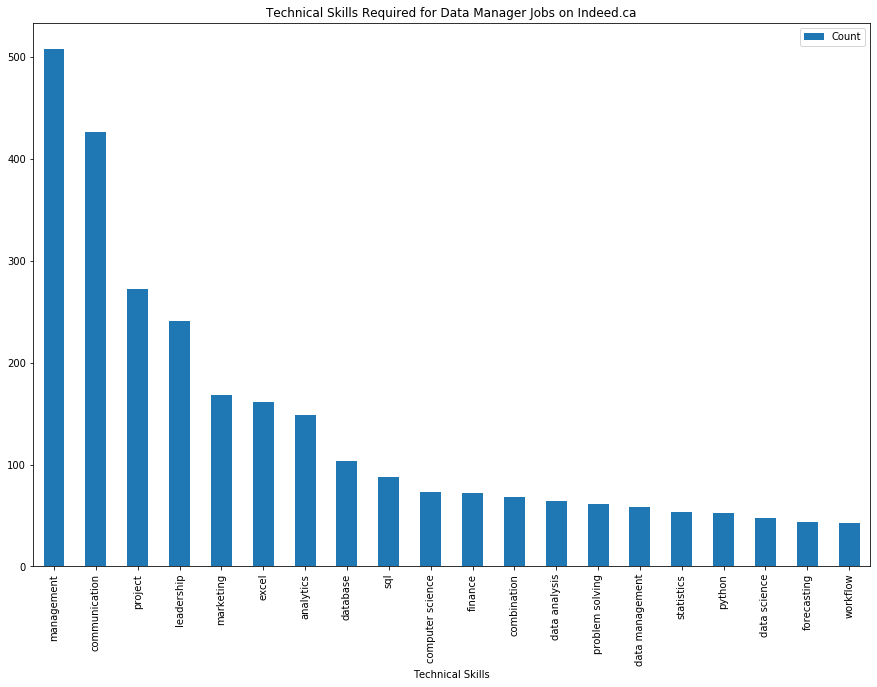

In [ ]:
# df_tcount.head(20).plot(kind="bar", figsize=(15,10))
# plt.title('Technical Skills Required for Data Manager Jobs on Indeed.ca')

In [ ]:
# df_bus = df_data_manager[business_skill]
# bus_count = df_bus.sum()
# bus_count = bus_count.sort_values(ascending=False)
# df_bcount = pd.DataFrame(data=bus_count,columns=["Count"])
# df_bcount.index.name = "Business Skills"
# df_bcount
# #plt.bar(,tech_count.to_list)

,Count
Business Skills,
communication,426.0
leadership,241.0
marketing,168.0
documentation,126.0
project management,125.0
collaborate,102.0
presentation,80.0
problem solving,61.0
consulting,53.0


In [ ]:
# df_bcount.to_csv('indeed_data_manager_skills_business')

Text(0.5, 1.0, 'Business Skills Required for Data Manager Jobs on Indeed.ca')

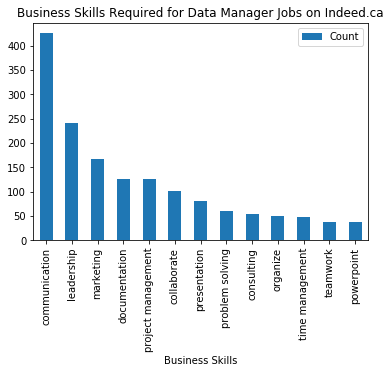

In [ ]:
# df_bcount.plot(kind="bar")
# plt.title('Business Skills Required for Data Manager Jobs on Indeed.ca')

In [ ]:
# df_data_scientist = pd.read_csv('data_scientist_indeed.csv')
# df_data_analyst = pd.read_csv('data_analyst_indeed.csv')
# df_data_manager = pd.read_csv('data_manager_indeed.csv')

# frames = [df_data_scientist, df_data_analyst, df_data_manager]
# df_combined = pd.concat(frames, ignore_index=True)

# #saving df as a local csv file define your own local path to save contents 
# df_combined.to_csv("indeed_job_list_combined.csv")

Please note that the entire code of the indeed web scraping section was commented out since only the outputs were exported to a .csv file and not the immediate result of the web scraping. The outputs are uploaded with our files as: 'data_analyst_indeed.csv', 'data_scientist_indeed.csv', 'data_manager_indeed.csv' 

# 7-Extracting Kaggle skills for respondents with less than 5 years of ML Experience

For the years of machine learning experience, we can see that there are 8 groups. We will only keep the groups with less than 5 years of experience.

In [75]:
df['ML_experience'].value_counts()

1-2 years      1367
< 1 years      1340
2-3 years       840
3-4 years       512
4-5 years       429
5-10 years      362
10-15 years     107
20+ years        63
Name: ML_experience, dtype: int64

In [76]:
# Filter only the participants with less than 5 years of machine learning experience.
df_ML = df[(df['ML_experience'] == "< 1 years") | (df['ML_experience'] == "1-2 years") | 
       (df['ML_experience'] == "2-3 years") | (df['ML_experience'] == "3-4 years") | 
       (df['ML_experience'] == "4-5 years")]

Now we want to see the participants with the highest salary. We have only kept those who earned more than 80K.

In [77]:
df_ML['salary'].value_counts()

0-9,999             1235
10,000-19,999        525
20,000-29,999        423
30,000-39,999        314
40,000-49,999        303
100,000-124,999      284
50,000-59,999        274
60,000-69,999        238
70,000-79,999        216
125,000-149,9991     175
80,000-89,999        173
90,000-99,999        143
150,000-199,999      109
>250,000              40
200,000-249,999       36
Name: salary, dtype: int64

In [78]:
df_ML_highest_salary = df_ML[(df_ML['salary'] == "80,000-89,999") | (df_ML['salary'] == "90,000-99,999") | 
                       (df_ML['salary'] == "100,000-124,999") | (df_ML['salary'] == "125,000-149,9991") | 
                       (df_ML['salary'] == "150,000-199,999") | (df_ML['salary'] == "200,000-249,999") | 
                       (df_ML['salary'] == ">250,000")]

In [79]:
df_ML_highest_salary.shape

(960, 84)

In [80]:
df_ML_highest_salary.head()

,education,coding_experience,ML_experience,salary,Q16_Jupyter,Q16_RStudio,Q16_PyCharm,Q16_Atom,Q16_MATLAB,Q16_Visual_Studio,Q16_Spyder,Q16_Vim_Emacs,Q16_Notepad++,Q16_Sublime_Text,Q18_Python,Q18_R,Q18_SQL,Q18_C,Q18_C++,Q18_Java,Q18_Javascript,Q18_TypeScript,Q18_Bash,Q18_MATLAB,Q20_Ggplot_ggplot2,Q20_Matplotlib,Q20_Altair,Q20_Shiny,Q20_D3.js,Q20_Plotly_PlotlyExpress,Q20_Bokeh,Q20_Seaborn,Q20_Geoplotlib,Q20_Leaflet_Folium,Q24_Linear_Logistic_Regression,Q24_Decision_Trees_Random_Forests,Q24_Gradient_Boosting_Machines,Q24_Bayesian_Approaches,Q24_Evolutionary_Approaches,Q24_Dense_Neural_Networks,...,Q28_Scikit-learn,Q28_TensorFlow,Q28_Keras,Q28_RandomForest,Q28_Xgboost,Q28_PyTorch,Q28_Caret,Q28_LightGBM,Q28_Spark_MLib,Q28_Fast.ai,Q32_SAS,Q32_Cloudera,Q32_Azure_ML_Studio,Q32_GoogleCloud_ML_Engine,Q32_GoogleCloud_Vision,Q32_GoogleCloud_SpeechtoText,Q32_GoogleCloud_Natural_Language,Q32_RapidMiner,Q32_GoogleCloud_Translation,Q32_Amazon_SageMaker,Q33_Google_AutoML,Q33_H20_Driverless_AI,Q33_Databricks_AutoML,Q33_DataRobot_AutoML,Q33_Tpot,Q33_Auto-Keras,Q33_Auto-Sklearn,Q33_Auto_ml,Q33_Xcessiv,Q33_MLbox,Q34_MySQL,Q34_PostgresSQL,Q34_SQLite,Q34_Microsoft_SQL_Server,Q34_Oracle_Database,Q34_Microsoft_Access,Q34_AWS_Relational_Database_Service,Q34_AWS_DynamoDB,Q34_Azure_SQL_Database,Q34_GoogleCloud_SQL
3,Master’s degree,1-2 years,2-3 years,">250,000",1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,...,1,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
11,Master’s degree,3-5 years,2-3 years,"90,000-99,999",1,0,1,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1,1,0,1,0,0,...,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
12,Master’s degree,10-20 years,1-2 years,"125,000-149,9991",1,1,0,0,0,1,0,0,1,0,1,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
22,Master’s degree,10-20 years,2-3 years,"100,000-124,999",1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,1,0,0,0,...,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0
25,Master’s degree,1-2 years,2-3 years,"90,000-99,999",1,0,0,1,0,0,0,1,0,0,1,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,1,1,0,1,...,1,1,1,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [81]:
import matplotlib.pyplot as plt
df_ML_skills = df_ML_highest_salary[skill_columns]
ML_count = df_ML_skills.sum()
ML_count = ML_count.sort_values(ascending=False)

# Get the list of skills (Remove Q#)
skill_list = []
for column in coding_count.index:
    i = column.find('_')
    skill_list.append(column[i+1:])

# Make a table with the skills and count
data = {'Skills':  skill_list, 'Count': ML_count.values.tolist()}
df_ML_count = pd.DataFrame(data, columns = ["Skills", "Count"])

df_ML_count

,Skills,Count
0,Python,828
1,Linear_Logistic_Regression,742
2,Jupyter,685
3,Matplotlib,635
4,Scikit-learn,634
5,Decision_Trees_Random_Forests,621
6,SQL,598
7,Seaborn,442
8,Gradient_Boosting_Machines,437
9,R,388


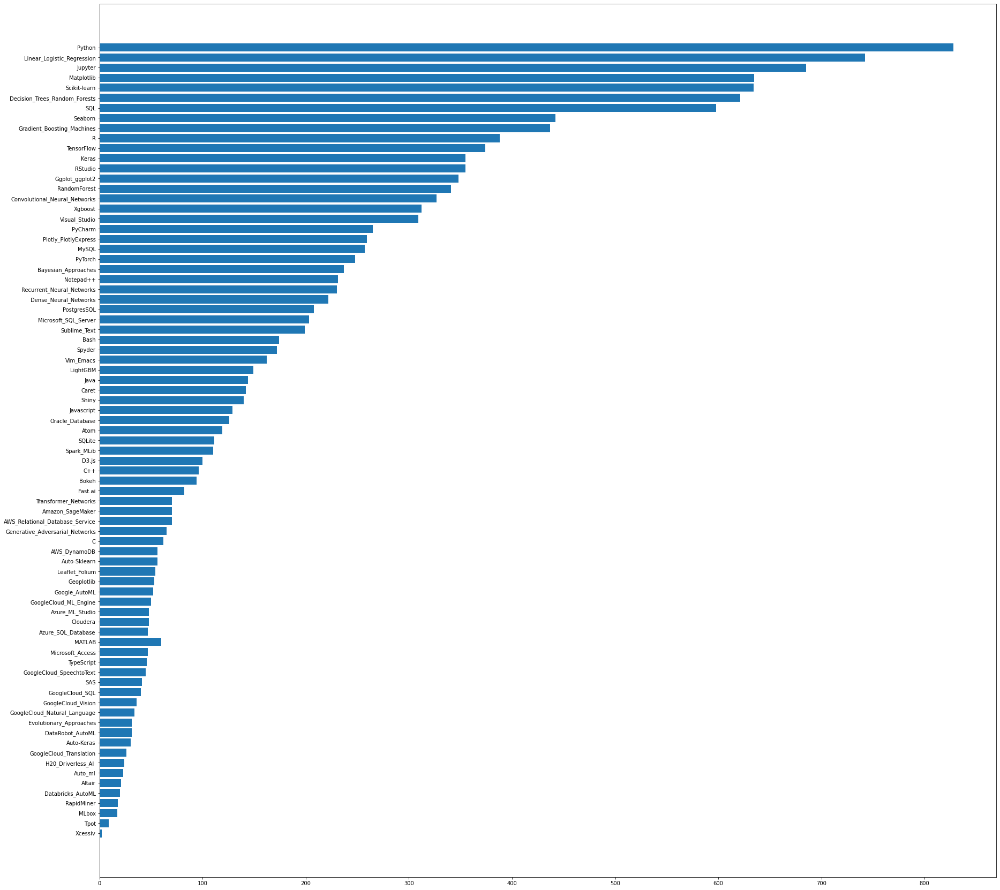

In [ ]:
plt.figure(figsize=(30, 30))
plt.barh(df_ML_count["Skills"][::-1], df_ML_count["Count"][::-1])
plt.show()

In [82]:
# Get the list of skills
print(skill_list)

['Python', 'Linear_Logistic_Regression', 'Jupyter', 'Matplotlib', 'Scikit-learn', 'Decision_Trees_Random_Forests', 'SQL', 'Seaborn', 'Gradient_Boosting_Machines', 'R', 'TensorFlow', 'Keras', 'RStudio', 'Ggplot_ggplot2', 'RandomForest', 'Convolutional_Neural_Networks', 'Xgboost', 'Visual_Studio', 'PyCharm', 'Plotly_PlotlyExpress', 'MySQL', 'PyTorch', 'Bayesian_Approaches', 'Notepad++', 'Recurrent_Neural_Networks', 'Dense_Neural_Networks', 'PostgresSQL', 'Microsoft_SQL_Server', 'Sublime_Text', 'Bash', 'Spyder', 'Vim_Emacs', 'LightGBM', 'Java', 'Caret', 'Shiny', 'Javascript', 'Oracle_Database', 'Atom', 'SQLite', 'Spark_MLib', 'D3.js', 'C++', 'Bokeh', 'Fast.ai', 'Transformer_Networks', 'Amazon_SageMaker', 'AWS_Relational_Database_Service', 'Generative_Adversarial_Networks', 'C', 'MATLAB', 'AWS_DynamoDB', 'Auto-Sklearn', 'Leaflet_Folium', 'Geoplotlib', 'Google_AutoML', 'GoogleCloud_ML_Engine', 'Azure_ML_Studio', 'Cloudera', 'Azure_SQL_Database', 'MATLAB', 'Microsoft_Access', 'TypeScript', '

# 8- Determining most important online platforms

This part consists of determining what are the most important sources for data science. The most commonly used platforms will them be used in our analysis.
The data was taken from the Kaggle survey.

In [83]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
import os
import operator
import seaborn as sns
import math
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, KFold
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, classification_report
from sklearn.metrics import make_scorer, r2_score, mean_squared_error, auc, mean_absolute_error
from scipy.optimize import fmin_tnc
from sklearn.model_selection import GridSearchCV
from collections import Counter
from html.parser import HTMLParser
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.tree import DecisionTreeClassifier
import re
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from time import time
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import RepeatedStratifiedKFold, GridSearchCV
from sklearn.preprocessing import normalize
import scipy.cluster.hierarchy as sch
from scipy import zeros as sci_zeros
from scipy.spatial.distance import euclidean
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
from scipy.cluster.hierarchy import dendrogram, linkage ,ward
from sklearn.cluster import DBSCAN
#!pip install gensim
import gensim
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cosine
%matplotlib inline

Text(0.5, 1.0, 'Platforms used according to Kaggle survey')

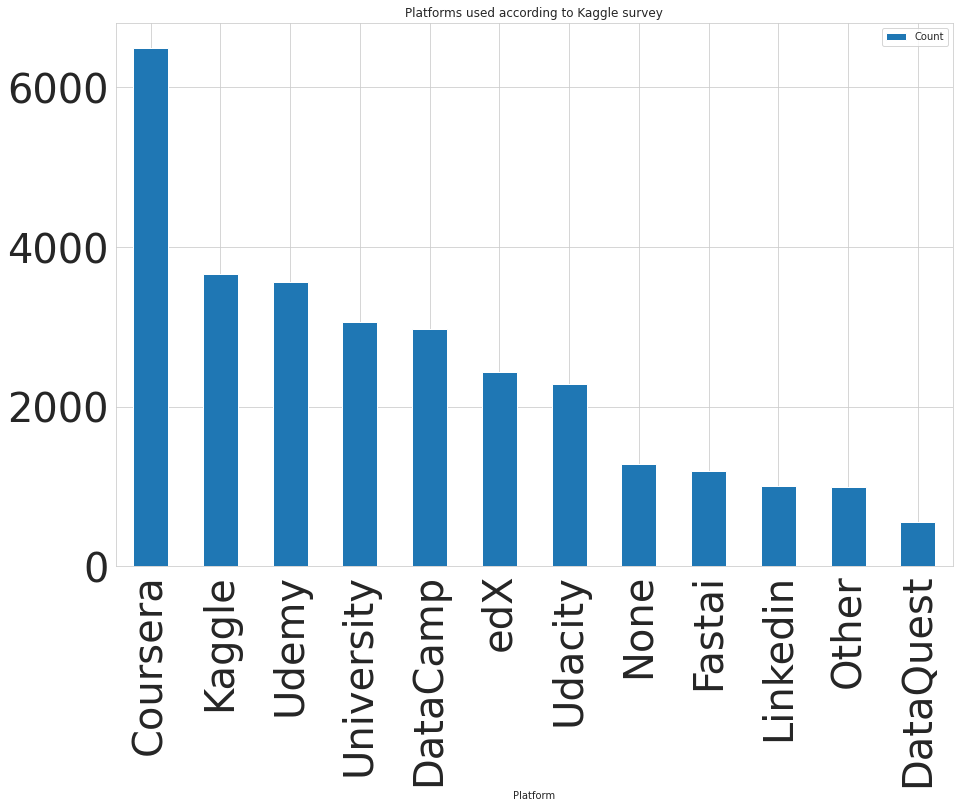

In [84]:
###Plotting most used educational sources for data science
#os.chdir("C:/Users/user/Desktop/JadZ/UofT/2-Courses/1-Fall 2020-2021/MIE1624H - Introduction to Data Science and Analytics/4-Assignments/Assignment 2")

df = pd.read_csv("Kaggle_Salary.csv", low_memory = False)


q13 = df[['Q13_Part_1', 'Q13_Part_2', 'Q13_Part_3', 'Q13_Part_4', 'Q13_Part_5', 'Q13_Part_6',
         'Q13_Part_7', 'Q13_Part_8', 'Q13_Part_9', 'Q13_Part_10', 'Q13_Part_11', 'Q13_Part_12']]

q13 = q13.drop([0], axis = 0)

def col_convert(x):
    try: 
        float(x)
        return 0
    except:
        return 1
    
    
columns_names = ['Udacity', 'Coursera', 'edX', 'DataCamp', 'DataQuest', 'Kaggle',
               'Fastai', 'Udemy', 'Linkedin', 'University', 'Other', 'None']

q13.columns = columns_names

for i in columns_names:
    q13[i] = q13[i].apply(lambda x: col_convert(x))

q13_count = q13.sum()
q13_count = q13_count.sort_values(ascending=False)
q13_tcount = pd.DataFrame(data=q13_count,columns=["Count"])
q13_tcount.index.name = "Platform"
q13_tcount

q13_tcount.plot(kind="bar", figsize=(15,10))
plt.title('Platforms used according to Kaggle survey')

As we can see, Coursera is by far the most used platfrom for learning data science skills, followed by Kaggle.

# 9-Assessing the importance of an internship

Now we want to see how around 1 year of additional work experience might affect the salary of data science. This will help us in deciding whether it is important to include an internship in the curriculum or not. We will only base our analysis on 0 to 5 years of experience and on respondents that have a bachelor's degree alone and those who have a master's degree alone. We will also consider 2 countries separately (the 2 that had the largest number of respondents) to remove any biases that might be added due to different income levels in different countries.

In [85]:
salaries = df[['Q3', 'Q4', 'Q15', 'Q10_buckets']]

salaries = salaries.drop([0], axis = 0)

salaries.columns = ['Country', 'Education', 'Experience', 'Salary']

selected_experience = ['< 1 years', '1-2 years', '3-5 years']
salaries = salaries[salaries.Experience.isin(selected_experience)]


#Now for the salaries, we will take the average of the upper and lower bounds for each salary range.
def SalaryToNum(x):
    if x == '>250,000':
        x = float(250000)
    if x == '0-9,999':
        x = float(5000)
    if x == '10,000-19,999':
        x = float(15000)
    if x == '100,000-124,999':
        x = float(112500)
    if x ==  '125,000-149,9991':
        x = float(137500)
    if x ==  '150,000-199,999':
        x = float(175000)
    if x == '20,000-29,999':
        x = float(25000)
    if x == '200,000-249,999':
        x = float(225000)
    if x ==  '30,000-39,999':
        x = float(35000)
    if x ==  '40,000-49,999':
        x = float(45000)
    if x == '50,000-59,999':
        x = float(55000)
    if x == '60,000-69,999':
        x = float(65000)
    if x == '70,000-79,999':
        x = float(75000)
    if x == '80,000-89,999':
        x = float(85000)
    if x == '90,000-99,999':
        x = float(95000)
    return x
    
salaries['Salary'] = salaries['Salary'].apply(lambda x: SalaryToNum(x))

selected_countries = ['United States of America', 'India']
salaries = salaries[salaries.Country.isin(selected_countries)]



Now we will bootstrap our data and conduct anova tests for each country/education combination.

## a) United States - Bachelor's Degree

In [86]:
bachelor = salaries[salaries['Education']== 'Bachelor’s degree']

master = salaries[salaries['Education'] == 'Master’s degree']

In [87]:
np.random.seed(100)
#Setting the seed in order to get the same result every time
bachelor = bachelor[bachelor['Country'] == 'United States of America']

zero_array= bachelor['Salary'][bachelor['Experience'] == '< 1 years'].to_numpy()
onetotwo_array= bachelor['Salary'][bachelor['Experience'] == '1-2 years'].to_numpy()
twotofive_array= bachelor['Salary'][bachelor['Experience'] == '3-5 years'].to_numpy()


In [88]:

group= 1000 #number of times to re-sample

zero_bootstrap = []
onetotwo_bootstrap =[]
twotofive_bootstrap =[]

for i in range(group):
    zero_salary_avg= np.mean(zero_array[np.random.randint( len(zero_array),size= len(zero_array))])
    onetotwo_salary_avg= np.mean(onetotwo_array[np.random.randint(len(onetotwo_array),size= len(onetotwo_array))])
    twotofive_salary_avg= np.mean(twotofive_array[np.random.randint(len(twotofive_array),size= len(twotofive_array))])
    zero_bootstrap.append(zero_salary_avg)
    onetotwo_bootstrap.append(onetotwo_salary_avg)
    twotofive_bootstrap.append(twotofive_salary_avg)

Text(0.5, 1.0, "Salaries of American respondents with a Bachelor's Degree")

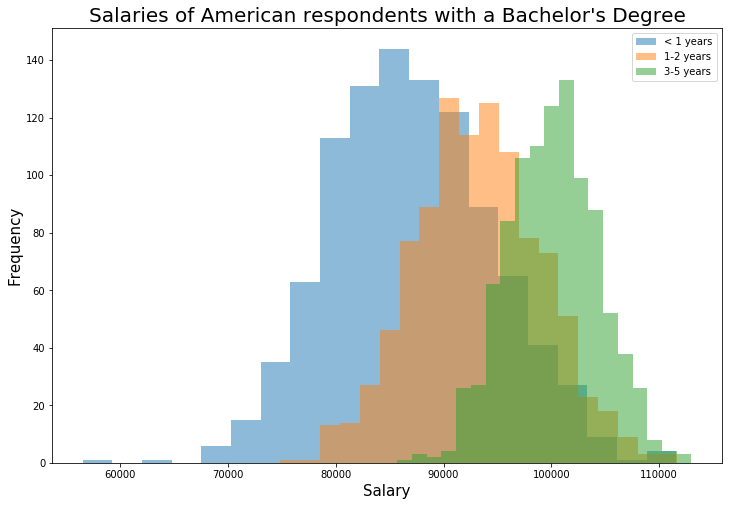

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))    
plt.hist(zero_bootstrap, bins = 20,label = '< 1 years', alpha = 0.5)
plt.hist(onetotwo_bootstrap, bins = 20,label = '1-2 years', alpha = 0.5)
plt.hist(twotofive_bootstrap, bins = 20,label = '3-5 years', alpha = 0.5)

plt.legend()
plt.xlabel('Salary', fontsize=15)
plt.ylabel('Frequency', fontsize = 15)
plt.title("Salaries of American respondents with a Bachelor's Degree", fontsize=20) 

In [89]:
f,p = stats.f_oneway(zero_bootstrap, onetotwo_bootstrap, twotofive_bootstrap)
print ("f = %g  p = %g" % (f, p))

f = 1210.02  p = 0


## b) United States - Master's Degree

In [90]:
np.random.seed(100)
#Setting the seed in order to get the same result every time
master = master[master['Country'] == 'United States of America']

zero_array= master['Salary'][master['Experience'] == '< 1 years'].to_numpy()
onetotwo_array= master['Salary'][master['Experience'] == '1-2 years'].to_numpy()
twotofive_array= master['Salary'][master['Experience'] == '3-5 years'].to_numpy()


In [91]:

group= 1000 #number of times to re-sample

zero_bootstrap = []
onetotwo_bootstrap =[]
twotofive_bootstrap =[]

for i in range(group):
    zero_salary_avg= np.mean(zero_array[np.random.randint( len(zero_array),size= len(zero_array))])
    onetotwo_salary_avg= np.mean(onetotwo_array[np.random.randint(len(onetotwo_array),size= len(onetotwo_array))])
    twotofive_salary_avg= np.mean(twotofive_array[np.random.randint(len(twotofive_array),size= len(twotofive_array))])
    zero_bootstrap.append(zero_salary_avg)
    onetotwo_bootstrap.append(onetotwo_salary_avg)
    twotofive_bootstrap.append(twotofive_salary_avg)

Text(0.5, 1.0, "Salaries of American respondents with a Master's Degree")

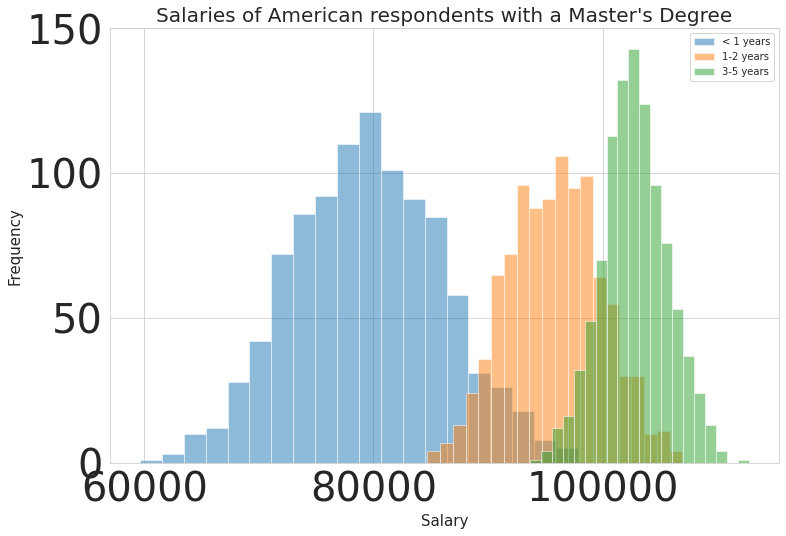

In [95]:
fig, ax = plt.subplots(figsize=(12,8))    
plt.hist(zero_bootstrap, bins = 20,label = '< 1 years', alpha = 0.5)
plt.hist(onetotwo_bootstrap, bins = 20,label = '1-2 years', alpha = 0.5)
plt.hist(twotofive_bootstrap, bins = 20,label = '3-5 years', alpha = 0.5)

plt.legend()
plt.xlabel('Salary', fontsize=15)
plt.ylabel('Frequency', fontsize = 15)
plt.title("Salaries of American respondents with a Master's Degree", fontsize=20) 

In [ ]:
f,p = stats.f_oneway(zero_bootstrap, onetotwo_bootstrap, twotofive_bootstrap)
print ("f = %g  p = %g" % (f, p))

f = 6363.68  p = 0


## c) India - Bachelor's Degree

In [96]:
bachelor = salaries[salaries['Education']== 'Bachelor’s degree']

master = salaries[salaries['Education'] == 'Master’s degree']

In [97]:
np.random.seed(100)
#Setting the seed in order to get the same result every time
bachelor = bachelor[bachelor['Country'] == 'India']

zero_array= bachelor['Salary'][bachelor['Experience'] == '< 1 years'].to_numpy()
onetotwo_array= bachelor['Salary'][bachelor['Experience'] == '1-2 years'].to_numpy()
twotofive_array= bachelor['Salary'][bachelor['Experience'] == '3-5 years'].to_numpy()


In [98]:
group= 1000 #number of times to re-sample

zero_bootstrap = []
onetotwo_bootstrap =[]
twotofive_bootstrap =[]

for i in range(group):
    zero_salary_avg= np.mean(zero_array[np.random.randint( len(zero_array),size= len(zero_array))])
    onetotwo_salary_avg= np.mean(onetotwo_array[np.random.randint(len(onetotwo_array),size= len(onetotwo_array))])
    twotofive_salary_avg= np.mean(twotofive_array[np.random.randint(len(twotofive_array),size= len(twotofive_array))])
    zero_bootstrap.append(zero_salary_avg)
    onetotwo_bootstrap.append(onetotwo_salary_avg)
    twotofive_bootstrap.append(twotofive_salary_avg)

Text(0.5, 1.0, "Salaries of Indian respondents with a Bachelor's Degree")

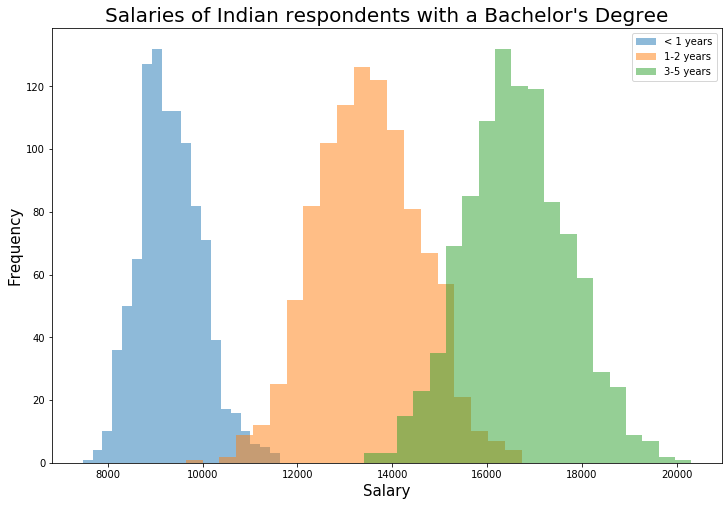

In [ ]:
fig, ax = plt.subplots(figsize=(12,8))    
plt.hist(zero_bootstrap, bins = 20,label = '< 1 years', alpha = 0.5)
plt.hist(onetotwo_bootstrap, bins = 20,label = '1-2 years', alpha = 0.5)
plt.hist(twotofive_bootstrap, bins = 20,label = '3-5 years', alpha = 0.5)

plt.legend()
plt.xlabel('Salary', fontsize=15)
plt.ylabel('Frequency', fontsize = 15)
plt.title("Salaries of Indian respondents with a Bachelor's Degree", fontsize=20) 

In [99]:
f,p = stats.f_oneway(zero_bootstrap, onetotwo_bootstrap, twotofive_bootstrap)
print ("f = %g  p = %g" % (f, p))

f = 14245.6  p = 0


## d) - Master's Degree

In [100]:
np.random.seed(100)
#Setting the seed in order to get the same result every time
master = master[master['Country'] == 'India']

zero_array= master['Salary'][master['Experience'] == '< 1 years'].to_numpy()
onetotwo_array= master['Salary'][master['Experience'] == '1-2 years'].to_numpy()
twotofive_array= master['Salary'][master['Experience'] == '3-5 years'].to_numpy()

In [101]:

group= 1000 #number of times to re-sample

zero_bootstrap = []
onetotwo_bootstrap =[]
twotofive_bootstrap =[]

for i in range(group):
    zero_salary_avg= np.mean(zero_array[np.random.randint( len(zero_array),size= len(zero_array))])
    onetotwo_salary_avg= np.mean(onetotwo_array[np.random.randint(len(onetotwo_array),size= len(onetotwo_array))])
    twotofive_salary_avg= np.mean(twotofive_array[np.random.randint(len(twotofive_array),size= len(twotofive_array))])
    zero_bootstrap.append(zero_salary_avg)
    onetotwo_bootstrap.append(onetotwo_salary_avg)
    twotofive_bootstrap.append(twotofive_salary_avg)

Text(0.5, 1.0, "Salaries of Indian respondents with a Master's Degree")

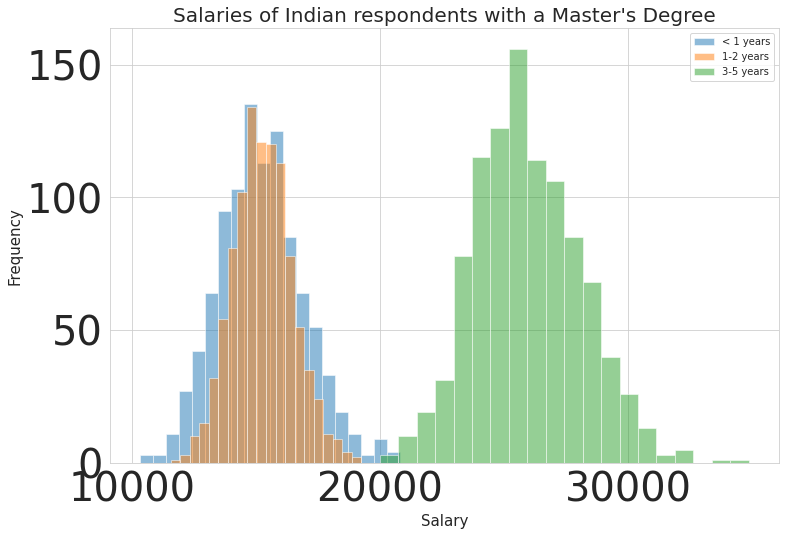

In [102]:
fig, ax = plt.subplots(figsize=(12,8))    
plt.hist(zero_bootstrap, bins = 20,label = '< 1 years', alpha = 0.5)
plt.hist(onetotwo_bootstrap, bins = 20,label = '1-2 years', alpha = 0.5)
plt.hist(twotofive_bootstrap, bins = 20,label = '3-5 years', alpha = 0.5)

plt.legend()
plt.xlabel('Salary', fontsize=15)
plt.ylabel('Frequency', fontsize = 15)
plt.title("Salaries of Indian respondents with a Master's Degree", fontsize=20) 

In [103]:
f,p = stats.f_oneway(zero_bootstrap, onetotwo_bootstrap, twotofive_bootstrap)
print ("f = %g  p = %g" % (f, p))

f = 12877.4  p = 0


As can be seen, the salaries of the respondents seem to clearly increase with a slight increase in coding experience for both data scientists/analysits in India and the United States. Therefore, this further reinforces our decision to incorporate a mandatory internship into our master's program. This would allow students to gain more work experience which might affect their starting salaries upon graduation.

# 10-Models for classifying level of courses

This part consists of building the models that will predict the level of the course and classify them as beginner or intermediate/advanced. In order to do so, we used the Coursera courses that were previously extracted and used the level of coursera courses as the dependent variable.

We will start off by cleaning the data.

In [104]:
#os.chdir("C:/Users/user/Desktop/JadZ/UofT/2-Courses/1-Fall 2020-2021/MIE1624H - Introduction to Data Science and Analytics/6-Group Project/Excel sheets")

coursera = pd.read_csv('coursera_data_science_result.csv', encoding='latin-1')

coursera = coursera.drop(['Unnamed: 0', 'number of students', 'rating', 'rating count', 'course_type', 
               'course_partner', 'detail_title', 'detail_desc'], axis=1)

unique_level = coursera['difficulty'].describe()['unique']
levels_count = coursera['difficulty'].value_counts()

In [105]:
#Deleting courses without difficulty levels.
difficulty_count = coursera['difficulty'].value_counts()
coursera[(coursera['difficulty'].isnull())]

,course title,difficulty,skills
100,Master of Machine Learning and Data Science,NaN,[]
101,Master of Science in Data Science,NaN,[]
102,Master of Data Science,NaN,[]
103,Master of Applied Data Science,NaN,[]
104,Master of Computer Science in Data Science,NaN,[]
287,Machine Learning for Analytics MasterTrackÃ¢Â...,NaN,[]
288,AI and Machine Learning MasterTrack Certificate,NaN,[]
931,Spatial Data Analysis and Visualization Master...,NaN,[]
932,Big Data MasterTrack Certificate,NaN,[]
933,Master of Public Health,NaN,[]


In [106]:
coursera = coursera.dropna(axis = 0)
coursera

,course title,difficulty,skills
0,IBM Data Science,Beginner,"['data science', 'statistical analysis', 'mach..."
1,Data Science,Beginner,"['github', 'machine learning', 'r programming'..."
2,Applied Data Science with Python,Intermediate,"['text mining', 'python programming', 'pandas'..."
3,Introduction to Data Science,Beginner,"['data science', 'relational database manageme..."
4,Data Science: Foundations using R,Beginner,"['data science', 'machine learning', 'github',..."
5,Data Science: Statistics and Machine Learning,Intermediate,"['machine learning', 'github', 'r programming'..."
6,Python for Everybody,Beginner,"['json', 'xml', 'python programming', 'databas..."
7,What is Data Science?,Beginner,[]
8,Applied Data Science,Beginner,"['data science', 'machine learning', 'python p..."
9,Advanced Data Science with IBM,Advanced,"['data science', 'internet of things (iot)', '..."


In [107]:
def course_level(txt):
    if txt == 'Beginner':
        txt = 0
    if txt == 'Intermediate' or txt == 'Mixed' or txt == 'Advanced':
        txt = 1
    return txt

coursera['difficulty'] = coursera['difficulty'].apply(course_level)


def clean_skills(txt):
    txt = re.sub("'", "", txt)
    txt = re.sub("[\(\[].*?[\)\]]", "", txt)
    txt = txt.strip('][').split(', ')
    return txt

coursera['skills'] = coursera['skills'].apply(clean_skills)


In [108]:

difficulty_count = coursera['difficulty'].value_counts()
difficulty_count

1    671
0    315
Name: difficulty, dtype: int64

Exctracting the list of the 100 most common skills. These will be used as the predictors in our models.

In [109]:
def common_skills(txt_column, k):
    txt_all = []
    for txt in txt_column:
        txt_all = txt + txt_all
    counter = Counter(txt_all)
    most_occur = counter.most_common(k)
    return most_occur

all_skills = common_skills(list(coursera['skills']), 100)
df = pd.DataFrame(all_skills, columns=["skills", "Frequency"])
df= df.drop([0], axis=0)

In [110]:
def skillToString(txt):
    txt = " ".join(txt)
    txt = txt.strip()
    txt = re.sub('   ', ' ', txt)
    txt = re.sub('  ', ' ', txt)
    txt = txt.strip()
    return txt

coursera['skills'] = coursera['skills'].apply(skillToString)


#Function to combine the similar skills
def combine_skills(txt):
    if 'artificial intelligence' in txt:
        txt = re.sub('artificial intelligence', 'ai', txt)
    if 'business analysis' in txt:
        txt = re.sub('business analysis', 'business analytics', txt)
    if 'data visualization' in txt:
        txt = re.sub('data visualization', 'visualization', txt)
    if 'machine learning algorithms' in txt:
        txt = re.sub('machine learning algorithms', 'machine learning', txt)
    return txt

coursera['skills'] = coursera['skills'].apply(combine_skills)

In [112]:
coursera = coursera[coursera['skills'] != '']
coursera.head(5)

,course title,difficulty,skills
0,IBM Data Science,0,sql
1,Data Science,0,data cleansing cluster analysis
2,Applied Data Science with Python,1,machine learning machine learning scikit-learn...
3,Introduction to Data Science,0,cloud databases python programming sql ipython
4,Data Science: Foundations using R,0,data cleansing cluster analysis


In [113]:
df
vocab_model = list(df['skills'])

for skill in vocab_model:
    skill = skill.strip()
    skill = skill.lstrip()
    skill = skill.rstrip()
    skill = re.sub('  ', ' ', skill)


In [114]:
#Here we removed the skills that weren't in english. We also removed machine learning and python since they appeared
#in the vast majority of the courses.
if 'entityâ\\x80\\x93relationship  model' in vocab_model:
    vocab_model.remove('entityâ\\x80\\x93relationship  model')
vocab_model.remove('ciencia de datos')
vocab_model.remove('machine learning')
vocab_model.remove('python programming')
vocab_model

['sql',
 'data analysis',
 'linear regression',
 'statistical hypothesis testing',
 'exploratory data analysis',
 'computer vision',
 'scikit-learn',
 'relational database',
 'deep learning',
 'business intelligence',
 'keras',
 ' algorithms',
 'data cleansing',
 'regression analysis',
 'big data',
 'data virtualization',
 'basic descriptive statistics',
 'predictive analytics',
 'pandas',
 'reinforcement learning',
 'function approximation',
 'intelligent systems',
 'data visualization ',
 'jobs',
 ' design',
 'computer programming',
 'supervised learning',
 'watson',
 'recommender systems',
 'natural language processing',
 'mysql',
 'apache spark',
 'statistics',
 'r programming',
 'visualization ',
 'dashboard',
 'feature engineering',
 'numpy',
 'cartography',
 'spatial analysis',
 'analytics',
 'ethics of artificial intelligence',
 'data mining',
 'random forest',
 'machine learning  algorithms',
 'cloud computing',
 'microsoft excel',
 'watson ',
 'google cloud platform',
 'data 

In [115]:
lemmatizer = WordNetLemmatizer()
vocab_model = [lemmatizer.lemmatize(w, pos='a') for w in vocab_model]

In [116]:
vocab_model

['sql',
 'data analysis',
 'linear regression',
 'statistical hypothesis testing',
 'exploratory data analysis',
 'computer vision',
 'scikit-learn',
 'relational database',
 'deep learning',
 'business intelligence',
 'keras',
 ' algorithms',
 'data cleansing',
 'regression analysis',
 'big data',
 'data virtualization',
 'basic descriptive statistics',
 'predictive analytics',
 'pandas',
 'reinforcement learning',
 'function approximation',
 'intelligent systems',
 'data visualization ',
 'jobs',
 ' design',
 'computer programming',
 'supervised learning',
 'watson',
 'recommender systems',
 'natural language processing',
 'mysql',
 'apache spark',
 'statistics',
 'r programming',
 'visualization ',
 'dashboard',
 'feature engineering',
 'numpy',
 'cartography',
 'spatial analysis',
 'analytics',
 'ethics of artificial intelligence',
 'data mining',
 'random forest',
 'machine learning  algorithms',
 'cloud computing',
 'microsoft excel',
 'watson ',
 'google cloud platform',
 'data 

Preparing the data for the models. In the next section, we tested the following models and selected the ones that had comparable performances and conducted hyperparameter tuning.

In [117]:
coursera = coursera.drop(['course title'], axis =1)

In [118]:
x_train, x_test, y_train, y_test = train_test_split(coursera.skills, coursera.difficulty, test_size=0.3, random_state=50)


In [119]:
vectorizer = TfidfVectorizer(strip_accents = 'ascii',
                                 max_features = 100, 
                                 ngram_range = (1,3),
                                 use_idf = True,
                                 vocabulary = vocab_model)
train_features = vectorizer.fit_transform(x_train)
test_features=vectorizer.transform(x_test)
Vals = vectorizer.get_feature_names()
print(Vals)


dense_features=train_features.toarray()
dense_test= test_features.toarray()
Accuracy=[]
Model=[]


classifiers = [
    GaussianNB(),
    LogisticRegression(solver='lbfgs', C= 1, penalty = 'l2', max_iter=1000),
    DecisionTreeClassifier(criterion='entropy', min_samples_leaf=500),
    RandomForestClassifier(n_estimators = 50, random_state = 15),
    GradientBoostingClassifier(random_state=0),
    KNeighborsClassifier(n_neighbors=3),
    SVC(),
    LinearSVC()
    ]


accuracy_best = 0
for classifier in classifiers:
    t0 = time()
    fit = classifier.fit(dense_features,y_train)
    pred = fit.predict(dense_test)
    pred_train = fit.predict(dense_features)
    train_test_time = time() - t0
    train_accuracy = accuracy_score(pred_train,y_train)
    accuracy = accuracy_score(pred,y_test)
    Accuracy.append(accuracy)
    Model.append(classifier.__class__.__name__)
    print('Test Accuracy of '+classifier.__class__.__name__+' is: {}'.format(round(accuracy,5)))
    print('Train Accuracy of '+classifier.__class__.__name__+' is: {}'.format(round(train_accuracy,5)))
    print('Time to run: {}'.format(round(train_test_time,5)))
    if accuracy > accuracy_best:
        accuracy_best = accuracy
        best_model_tf_idf = fit

accuracy_best

['sql', 'data analysis', 'linear regression', 'statistical hypothesis testing', 'exploratory data analysis', 'computer vision', 'scikit-learn', 'relational database', 'deep learning', 'business intelligence', 'keras', ' algorithms', 'data cleansing', 'regression analysis', 'big data', 'data virtualization', 'basic descriptive statistics', 'predictive analytics', 'pandas', 'reinforcement learning', 'function approximation', 'intelligent systems', 'data visualization ', 'jobs', ' design', 'computer programming', 'supervised learning', 'watson', 'recommender systems', 'natural language processing', 'mysql', 'apache spark', 'statistics', 'r programming', 'visualization ', 'dashboard', 'feature engineering', 'numpy', 'cartography', 'spatial analysis', 'analytics', 'ethics of artificial intelligence', 'data mining', 'random forest', 'machine learning  algorithms', 'cloud computing', 'microsoft excel', 'watson ', 'google cloud platform', 'data warehousing', 'matplotlib', 'predictive modelling

0.7377049180327869

Next we will do hyperparameter tuning for the following models:
LogisticRegression, RandomForestClassifier, GradientBoostingClassifier, SVC, Linear SVC and Gaussian NB.


## Gaussian NB

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(coursera.skills, coursera.difficulty, test_size=0.3, random_state=50)

def vectorize_text(x_train, x_test, max_features):
    vectorizer = TfidfVectorizer(strip_accents = 'ascii',
                                 max_features = max_features, 
                                 ngram_range = (1,3),
                                 use_idf = True,
                                vocabulary = vocab_model)
    train_features = vectorizer.fit_transform(x_train)
    test_features=vectorizer.transform(x_test)
    Vals = vectorizer.get_feature_names()
    dense_features=train_features.toarray()
    dense_test= test_features.toarray()
    return dense_features, dense_test 

x_train_NB , x_test_NB = vectorize_text(x_train, x_test, 100)

space = {
    'var_smoothing': np.logspace(0,-9, num=100)
        }

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)
model =  GaussianNB()

search = GridSearchCV(model, space, scoring='accuracy', cv=cv)

result = search.fit(x_train_NB, y_train)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.628095238095238
Best Hyperparameters: {'var_smoothing': 1.0}


In [ ]:
best_NB_model = GaussianNB(var_smoothing = 1)
fit = best_NB_model.fit(x_train_NB,y_train)
train_pred_NB = fit.predict(x_train_NB)
test_pred_NB = fit.predict(x_test_NB)

train_accuracy_NB = accuracy_score(train_pred_NB,y_train)
test_accuracy_NB = accuracy_score(test_pred_NB,y_test)

In [ ]:
print('Train accuracy = {}, Test accuracy = {}'.format(round(train_accuracy_NB,3) , round(test_accuracy_NB,3)))

Train accuracy = 0.782, Test accuracy = 0.721


In [ ]:
print(classification_report(y_test, test_pred_NB))

              precision    recall  f1-score   support

           0       0.82      0.58      0.68        31
           1       0.67      0.87      0.75        30

    accuracy                           0.72        61
   macro avg       0.74      0.72      0.72        61
weighted avg       0.74      0.72      0.72        61



## Logistic Regression

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(coursera.skills, coursera.difficulty, test_size=0.3, random_state=50)

x_train_LR , x_test_LR = vectorize_text(x_train, x_test, 100)

import warnings
#warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.filterwarnings("ignore")


space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=1)
model = LogisticRegression(max_iter=1000)

search = GridSearchCV(model, space, scoring='accuracy', cv=cv)

result = search.fit(x_train_LR, y_train)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.6063809523809524
Best Hyperparameters: {'C': 1e-05, 'penalty': 'none', 'solver': 'lbfgs'}


In [ ]:
best_LR_model = LogisticRegression(C= 1e-05, penalty = 'none', solver = 'lbfgs', max_iter=1000)
fit = best_LR_model.fit(x_train_LR,y_train)
train_pred_LR = fit.predict(x_train_LR)
test_pred_LR = fit.predict(x_test_LR)

train_accuracy_LR = accuracy_score(train_pred_LR,y_train)
test_accuracy_LR = accuracy_score(test_pred_LR,y_test)

In [ ]:
print('Train accuracy = {}, Test accuracy = {}'.format(round(train_accuracy_LR,3) , round(test_accuracy_LR,3)))

Train accuracy = 0.845, Test accuracy = 0.672


In [ ]:
print(classification_report(y_test, test_pred_LR))

              precision    recall  f1-score   support

           0       0.69      0.65      0.67        31
           1       0.66      0.70      0.68        30

    accuracy                           0.67        61
   macro avg       0.67      0.67      0.67        61
weighted avg       0.67      0.67      0.67        61



## Random forest

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(coursera.skills, coursera.difficulty, test_size=0.3, random_state=50)

x_train_RF , x_test_RF = vectorize_text(x_train, x_test, 100)

space = {'bootstrap': [True, False],
         'criterion': ['gini'],
 'max_depth': [10, 20, 30, 40, 50, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600]}


cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)
model = RandomForestClassifier(random_state=15)

search = GridSearchCV(model, space, scoring='accuracy', cv=cv)

result = search.fit(x_train_RF, y_train)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.6276190476190476
Best Hyperparameters: {'bootstrap': False, 'criterion': 'gini', 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}


In [ ]:
best_RF_model = RandomForestClassifier(bootstrap = False, criterion = 'gini',
                                       max_depth = 10, max_features = 'auto', 
                                       min_samples_leaf = 1, min_samples_split = 10,
                                       n_estimators = 200, random_state=15)
fit = best_RF_model.fit(x_train_RF,y_train)
train_pred_RF = fit.predict(x_train_RF)
test_pred_RF = fit.predict(x_test_RF)

train_accuracy_RF = accuracy_score(train_pred_RF,y_train)
test_accuracy_RF = accuracy_score(test_pred_RF,y_test)

In [ ]:
print('Train accuracy = {}, Test accuracy = {}'.format(round(train_accuracy_RF,3) , round(test_accuracy_RF,3)))

Train accuracy = 0.782, Test accuracy = 0.639


In [ ]:
print(classification_report(y_test, test_pred_RF))

              precision    recall  f1-score   support

           0       0.71      0.48      0.58        31
           1       0.60      0.80      0.69        30

    accuracy                           0.64        61
   macro avg       0.66      0.64      0.63        61
weighted avg       0.66      0.64      0.63        61



## Linear SVC

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(coursera.skills, coursera.difficulty, test_size=0.3, random_state=50)
x_train_LSVC , x_test_LSVC = vectorize_text(x_train, x_test, 100)

space = dict()
space['loss'] = ['hinge', 'squared_hinge']
space['penalty'] = ['l1', 'l2']
space['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
space['multi_class'] = ['ovr', 'crammer_singer']
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=1)
model = LinearSVC()

search = GridSearchCV(model, space, scoring='accuracy', cv=cv)

result = search.fit(x_train_LSVC, y_train)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.6288571428571429
Best Hyperparameters: {'C': 100, 'loss': 'hinge', 'multi_class': 'crammer_singer', 'penalty': 'l1'}


In [ ]:
best_LSVC_model = LinearSVC(C= 100, penalty = 'l1', loss = 'hinge', multi_class='crammer_singer')
fit = best_LSVC_model.fit(x_train_LSVC,y_train)
train_pred_LSVC = fit.predict(x_train_LSVC)
test_pred_LSVC = fit.predict(x_test_LSVC)

train_accuracy_LSVC = accuracy_score(train_pred_LSVC,y_train)
test_accuracy_LSVC = accuracy_score(test_pred_LSVC,y_test)


In [ ]:
print('Train accuracy = {}, Test accuracy = {}'.format(round(train_accuracy_LSVC,3) , round(test_accuracy_LSVC,3)))

Train accuracy = 0.845, Test accuracy = 0.689


In [ ]:
print(classification_report(y_test, test_pred_LSVC))

              precision    recall  f1-score   support

           0       0.77      0.55      0.64        31
           1       0.64      0.83      0.72        30

    accuracy                           0.69        61
   macro avg       0.71      0.69      0.68        61
weighted avg       0.71      0.69      0.68        61



## Gradient Boosting

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(coursera.skills, coursera.difficulty, test_size=0.3, random_state=50)

x_train_GB , x_test_GB = vectorize_text(x_train, x_test, 100)

space = {
    "loss":["deviance"],
    "learning_rate": [0.01, 0.05, 0.075, 0.1, 0.15, 0.2],
    "max_depth":[3,5,8],
    "max_features":["log2","sqrt"],
    "criterion": ["friedman_mse",  "mae"],
    "subsample":[0.5, 0.8, 0.9, 1.0],
    "n_estimators":[10]
    }


cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=1, random_state=1)
model = GradientBoostingClassifier(random_state=15)

search = GridSearchCV(model, space, scoring='accuracy', cv=cv)

result = search.fit(x_train_GB, y_train)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)


Best Score: 0.6414285714285715
Best Hyperparameters: {'criterion': 'friedman_mse', 'learning_rate': 0.075, 'loss': 'deviance', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 10, 'subsample': 0.9}


In [ ]:

best_GB_model = GradientBoostingClassifier(criterion = 'friedman_mse', learning_rate = 0.075, loss = 'deviance', 
                                          max_depth = 8, max_features = 'log2', n_estimators = 10, subsample = 0.9, random_state =15)
fit = best_GB_model.fit(x_train_GB,y_train)
train_pred_GB = fit.predict(x_train_GB)
test_pred_GB = fit.predict(x_test_GB)

train_accuracy_GB = accuracy_score(train_pred_GB,y_train)
test_accuracy_GB = accuracy_score(test_pred_GB,y_test)


In [ ]:
print('Train accuracy = {}, Test accuracy = {}'.format(round(train_accuracy_GB,3) , round(test_accuracy_GB,3)))

Train accuracy = 0.768, Test accuracy = 0.639


In [ ]:
print(classification_report(y_test, test_pred_GB))

              precision    recall  f1-score   support

           0       0.74      0.45      0.56        31
           1       0.60      0.83      0.69        30

    accuracy                           0.64        61
   macro avg       0.67      0.64      0.63        61
weighted avg       0.67      0.64      0.63        61



# SVC

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(coursera.skills, coursera.difficulty, test_size=0.3, random_state=50)
x_train_SVC , x_test_SVC = vectorize_text(x_train, x_test, 100)

space = {
    'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf']
        }

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=1)
model = SVC()

search = GridSearchCV(model, space, scoring='accuracy', cv=cv)

result = search.fit(x_train_SVC, y_train)
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 0.626095238095238
Best Hyperparameters: {'C': 1000, 'gamma': 0.01, 'kernel': 'rbf'}


In [ ]:
best_SVC_model = SVC(C= 1000, gamma = 0.01, kernel = 'rbf')
fit = best_SVC_model.fit(x_train_SVC,y_train)
train_pred_SVC = fit.predict(x_train_SVC)
test_pred_SVC = fit.predict(x_test_SVC)

train_accuracy_SVC = accuracy_score(train_pred_SVC,y_train)
test_accuracy_SVC = accuracy_score(test_pred_SVC,y_test)

In [ ]:
print('Train accuracy = {}, Test accuracy = {}'.format(round(train_accuracy_SVC,3) , round(test_accuracy_SVC,3)))

Train accuracy = 0.845, Test accuracy = 0.705


In [ ]:
print(classification_report(y_test, test_pred_SVC))

              precision    recall  f1-score   support

           0       0.78      0.58      0.67        31
           1       0.66      0.83      0.74        30

    accuracy                           0.70        61
   macro avg       0.72      0.71      0.70        61
weighted avg       0.72      0.70      0.70        61



In [ ]:
Model = ['GaussianNB', 'Logistic Regression', 'Random Forest', 'LinearSVC', 'Gradient Boosting', 'SVC']
train_accuracy = [train_accuracy_NB, train_accuracy_LR, train_accuracy_RF, train_accuracy_LSVC, train_accuracy_GB, train_accuracy_SVC]
test_accuracy = [test_accuracy_NB, test_accuracy_LR, test_accuracy_RF, test_accuracy_LSVC, test_accuracy_GB, test_accuracy_SVC]

all_models = pd.DataFrame(
    {'Model': Model,
     'Train accuracy': train_accuracy,
     'Test accuracy': test_accuracy
    })

all_models

,Model,Train accuracy,Test accuracy
0,GaussianNB,0.781690,0.721311
1,Logistic Regression,0.845070,0.672131
2,Random Forest,0.781690,0.639344
3,LinearSVC,0.845070,0.688525
4,Gradient Boosting,0.767606,0.639344
5,SVC,0.845070,0.704918


As we can see, GaussianNB had the best test accuracy and will thus be used for making predictions on the level of the final selected courses.

# 11-Clustering of Indeed for course generation

For this part, we will test 3 types of clustering models on the indeed dataset to determine combinations of skills for course generation.

In [ ]:
indeed_data_scientist = pd.read_csv('data_scientist_indeed.csv')
indeed_data_analyst = pd.read_csv('data_analyst_indeed.csv')
indeed_data_manager = pd.read_csv('data_manager_indeed.csv')

In [ ]:
#dropping all non needed courses
indeed_data_scientist = indeed_data_scientist.drop(['Unnamed: 0','index', 'Page Num', 'link', 'Experience', 'job_title', 'company_name', 'salary'], axis=1)
indeed_data_analyst = indeed_data_analyst.drop(['Unnamed: 0', 'index', 'Page Num', 'link', 'Experience', 'job_title', 'company_name', 'salary'], axis=1)
indeed_data_manager = indeed_data_manager.drop(['Unnamed: 0', 'index', 'Page Num', 'link', 'Experience', 'job_title', 'company_name', 'salary'], axis=1)

frames = [indeed_data_scientist, indeed_data_analyst, indeed_data_manager]
indeed = pd.concat(frames)

In [ ]:
indeed

,machine learning,python,data analysis,data science,deep learning,data visualization,tensorflow,r,statistics,artificial intelligence,...,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork,"plotly’, ‘plotlyexpress"
0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN
3,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2267,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2268,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2269,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2270,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#define a  function to cluster similar skills together
def cluster_skills(x,y):
    x = x+y
    return x
#combining similar skills
indeed['machine learning'] = indeed.apply(lambda x: cluster_skills(x['machine learning'], x['machine learning algorithms']), axis = 1)
indeed = indeed.drop(['machine learning algorithms'], axis = 1)

indeed['ai'] = indeed.apply(lambda x: cluster_skills(x['ai'], x['artificial intelligence']), axis = 1)
indeed = indeed.drop(['artificial intelligence'], axis = 1)

indeed['business analytics'] = indeed.apply(lambda x: cluster_skills(x['business analytics'], x['business analysis']), axis = 1)
indeed = indeed.drop(['business analysis'], axis = 1)

indeed['visualization'] = indeed.apply(lambda x: cluster_skills(x['visualization'], x['data visualization']), axis = 1)
indeed = indeed.drop(['data visualization'], axis = 1)


In [ ]:
skills_count = indeed.sum()
skills_count = skills_count.sort_values(ascending=False)
skills_count = pd.DataFrame(data=skills_count,columns=["Count"])
skills_count


,Count
management,1955.0
communication,1937.0
python,1914.0
analytics,1885.0
machine learning,1721.0
...,...
tuple,0.0
recurrent neural network,0.0
chi-2,0.0
intelligent systems,0.0


In [ ]:
#selecting only the 100 most common skills in the indeed job postings. This way we would be including the 100 skills that are
#most in demand to create our master's program
req_skills = list(skills_count.index[0:100])
indeed_final = indeed.loc[:, indeed.columns.isin(req_skills)]
indeed_final

,machine learning,python,data analysis,data science,deep learning,tensorflow,r,statistics,ai,sql,...,nosql,project management,consulting,presentation,documentation,time management,collaborate,organize,powerpoint,teamwork
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2267,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2268,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2269,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2270,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
def generate_skill_list(skill_encode, req_skills):
    skill_lst = []
    for idx, skill_present in enumerate(skill_encode):
        if skill_present == 1:
             skill_lst.append(req_skills[idx])
    return skill_lst

indeed_final['skills'] = indeed_final[req_skills].apply(lambda skill_encoding_lst: generate_skill_list(skill_encoding_lst, req_skills), axis=1)


In [ ]:
indeed_final['skills']

0                                            [tensorflow]
1                               [analytics, data science]
2                                [analytics, collaborate]
3       [management, python, analytics, project, data ...
4                                                      []
                              ...                        
2267                                                   []
2268                                                   []
2269                                                   []
2270                                                   []
2271                                                   []
Name: skills, Length: 6785, dtype: object

## a) Hierarchical Clustering

In [ ]:
model = gensim.models.Word2Vec(indeed_final['skills'], min_count=2)
model

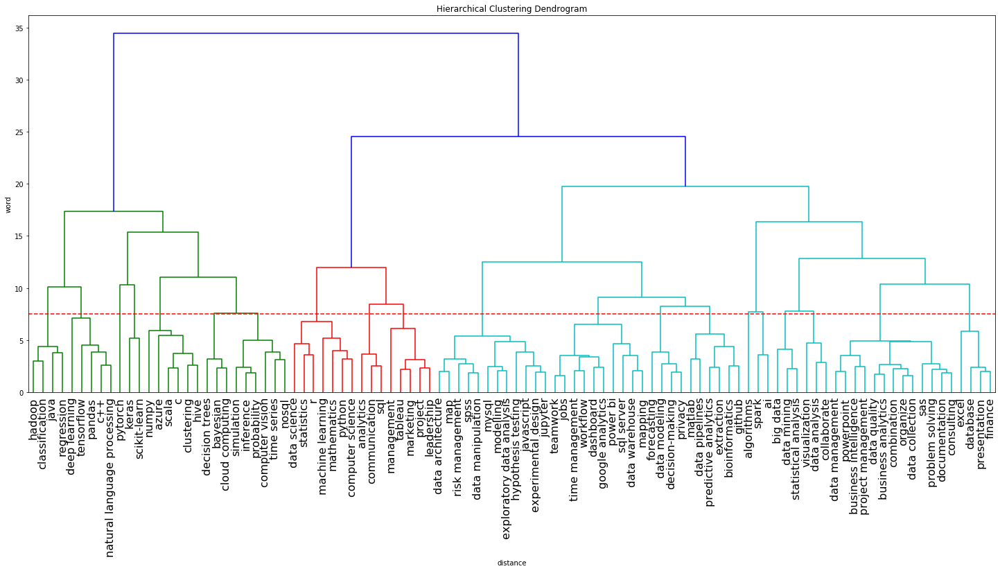

In [ ]:
l = linkage(model.wv.syn0, method='complete', metric='seuclidean')

# calculate full dendrogram
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.ylabel('word')
plt.xlabel('distance')

dendrogram(
    l,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=16.,  # font size for the x axis labels
    orientation='top',
    leaf_label_func=lambda v: str(model.wv.index2word[v])
)
plt.axhline(y=7.5, color='r', linestyle='--')
plt.show()

From the clusters above, pytorch will be added to the cluster next to it. Algorithms will also be added to the cluster next to it.

## b) DBSCAN

In [ ]:
db1 = DBSCAN(eps=0.1, min_samples=2).fit(model.wv.syn0)

In [ ]:
clusters = db1.labels_ + 1
print(clusters)

[ 0  1  0  0  1  0  0  0  0  0  2  0  2  0  0  0  0  0  0  0  0  0  0  3
  4  4  4  3  0  4  0  0  0  4  0  4  0  0  5  5  0  0  0  0  6  5  5  7
  0  0  0  5  0  6  8  7  0  0  0  0  0  0  0  0  0  8  0  0  0  7  0  7
  7  7  9  0  9 10  0  9 11  0 10 12 11 13  0 13 14 12  0 12 12  0 13  0
 14 13 12 12]


In [ ]:
d = {'Skills': req_skills, 'Cluster': clusters}
dbscan_clusters = pd.DataFrame(d)

In [ ]:
dbscan_clusters.sort_values(ascending = True, by = 'Cluster')

,Skills,Cluster
0,management,0
36,consulting,0
37,tensorflow,0
40,data management,0
41,forecasting,0
...,...,...
94,data architecture,13
97,map,13
85,spss,13
88,modelling,14


## c) K-Means

In [ ]:
from nltk.cluster import KMeansClusterer
import nltk
NUM_CLUSTERS=20
kclusterer = KMeansClusterer(NUM_CLUSTERS, distance=nltk.cluster.util.cosine_distance, repeats=25)
assigned_clusters = kclusterer.cluster(model.wv.syn0, assign_clusters=True)
print (assigned_clusters)

[19, 19, 18, 19, 19, 18, 18, 18, 18, 18, 17, 18, 17, 17, 16, 16, 17, 17, 17, 15, 14, 11, 11, 15, 15, 14, 14, 15, 3, 14, 3, 4, 3, 13, 13, 13, 0, 15, 12, 13, 9, 16, 2, 1, 1, 13, 13, 8, 1, 10, 1, 13, 1, 2, 10, 12, 0, 4, 1, 2, 6, 5, 5, 1, 1, 10, 0, 1, 6, 13, 5, 12, 12, 10, 2, 2, 2, 12, 1, 2, 2, 6, 12, 5, 2, 10, 2, 10, 7, 7, 12, 5, 10, 9, 10, 10, 7, 10, 5, 9]


In [ ]:
d1 = {'Skills': req_skills, 'Cluster': assigned_clusters}
kmeans_clusters = pd.DataFrame(d1)

In [ ]:
kmeans_clusters.sort_values(ascending = True, by = 'Cluster')

,Skills,Cluster
66,keras,0
56,pytorch,0
36,consulting,0
50,pandas,1
48,natural language processing,1
...,...,...
2,python,18
4,machine learning,19
3,analytics,19
1,communication,19


In [ ]:
dbscan_clusters.to_csv('dbscan_courses.csv')
kmeans_clusters.to_csv('kmeans_courses.csv')

DBSCAN clusters will be dropped since they were very sensitive to changes in eps (i.e. a change in 0.01 in the value of epsilon could result in changing from 20 clusters as shown above to 5 clusters). Therefore, the results aren't very reliable. In addition, DBSCAN is known to be not very reliable when working with word data. Another, reason for dropping the DBSCAN clusters is that it resultes in very unbalanced courses. The firs course for example had 37 skills, whereas the others had 2 to 7 skills.

On another note, Kmeans clusters were less sensitive to a change in the k value. However, we decided to proceed with the  herarchical clusters since they made the more sense.

The next step is to divide the selected 17 courses into beginner (i.e. to be taken first) and intermediate/advanced (to be taken after the first semester). 

In [ ]:
courses = pd.read_csv('hierarchical_courses.csv')

In [ ]:
courses = courses.drop(['Unnamed: 0'], axis=1)
courses.head(20)

,Skills,Cluster
0,hadoop,0
1,classification,0
2,java,0
3,regression,0
4,deep learning,1
5,tensorflow,1
6,pandas,1
7,c++,1
8,natural language processing,1
9,pytorch,2


In [ ]:
final_courses = pd.DataFrame({'Course_ID': range(18)})

sk = list(courses['Skills'])
cl = list(courses['Cluster'])
ids = list(final_courses['Course_ID'])

f_courses = []
for j in range(len(ids)):
    all_skills = ''
    for i in range(len(cl)):
        if ids[j] == cl[i]:
            all_skills = sk[i] + ' ' + all_skills
    f_courses.append(all_skills)        
        

In [ ]:
for i in f_courses:
    i.strip()
f_courses

['regression java classification hadoop ',
 'natural language processing c++ pandas tensorflow deep learning ',
 'sklearn keras pytorch ',
 'hive clustering c scala azure numpy ',
 'cloud computing bayesian decision trees ',
 'nosql time series computer vision probability inference simulation ',
 'computer science python mathematics machine learning r statistics data science ',
 'sql communication analytics ',
 'leadership project marketing tableau management ',
 'jupyter experimental design javascript hypothesis testing exploratory data analysis modelling mysql data manipulation spss risk management map data architecture ',
 'mapping data warehouse sql server power bi google analytics dashboard workflow time management jobs teamwork ',
 'privacy decision-making data modeling forecasting ',
 'github bioinformatics extraction predictive analytics data pipelines matlab ',
 'ai spark algorithms ',
 'statistical analysis data mining big data ',
 'collaborate data analysis visualization ',


In [ ]:
final_courses['skills'] = f_courses

In [ ]:
final_courses.head(20)

,Course_ID,skills
0,0,regression java classification hadoop
1,1,natural language processing c++ pandas tensorf...
2,2,sklearn keras pytorch
3,3,hive clustering c scala azure numpy
4,4,cloud computing bayesian decision trees
5,5,nosql time series computer vision probability ...
6,6,computer science python mathematics machine le...
7,7,sql communication analytics
8,8,leadership project marketing tableau management
9,9,jupyter experimental design javascript hypothe...


In [ ]:
skills = final_courses['skills']

vectorizer = TfidfVectorizer(strip_accents = 'ascii',
                             max_features = 100, 
                             ngram_range = (1,3),
                             use_idf = True,
                             vocabulary = vocab_model)
courses_test = vectorizer.fit_transform(skills)
Vals = vectorizer.get_feature_names()
print(Vals)

['sql', 'data analysis', 'linear regression', 'statistical hypothesis testing', 'exploratory data analysis', 'computer vision', 'scikit-learn', 'relational database', 'deep learning', 'business intelligence', 'keras', ' algorithms', 'data cleansing', 'regression analysis', 'big data', 'data virtualization', 'basic descriptive statistics', 'predictive analytics', 'pandas', 'reinforcement learning', 'function approximation', 'intelligent systems', 'data visualization ', 'jobs', ' design', 'computer programming', 'supervised learning', 'watson', 'recommender systems', 'natural language processing', 'mysql', 'apache spark', 'statistics', 'r programming', 'visualization ', 'dashboard', 'feature engineering', 'numpy', 'cartography', 'spatial analysis', 'analytics', 'ethics of artificial intelligence', 'data mining', 'random forest', 'machine learning  algorithms', 'cloud computing', 'microsoft excel', 'watson ', 'google cloud platform', 'data warehousing', 'matplotlib', 'predictive modelling

In [ ]:
dense_features=courses_test.toarray()

fit = best_NB_model.fit(x_train_NB,y_train)

pred = fit.predict(dense_features)

final_courses['course_level'] = pred

final_courses.head(20)


,Course_ID,skills,course_level
0,0,regression java classification hadoop,1
1,1,natural language processing c++ pandas tensorf...,1
2,2,sklearn keras pytorch,1
3,3,hive clustering c scala azure numpy,1
4,4,cloud computing bayesian decision trees,0
5,5,nosql time series computer vision probability ...,1
6,6,computer science python mathematics machine le...,1
7,7,sql communication analytics,0
8,8,leadership project marketing tableau management,1
9,9,jupyter experimental design javascript hypothe...,1


In [ ]:
final_courses.to_csv('final_courses.csv')

# 12-Top 10 Master Programs

In this section we extracted the courses provided in the top 10 masters in data science and AI (Forbes). These were used to identify courses based on the cluster of skills that we obtained in the previous section.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import learning_curve
from sklearn.feature_selection import RFE
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import make_scorer, r2_score, confusion_matrix
from sklearn.metrics import accuracy_score, roc_curve, classification_report
from sklearn.model_selection import GridSearchCV, KFold
from sklearn.metrics import mean_absolute_error
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.feature_selection import SelectFromModel

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.svm import SVC
from sklearn.feature_selection import RFECV

!pip install wordcloud
from html.parser import HTMLParser
import re 
import string
import nltk
from nltk.tokenize import word_tokenize 
#nltk.download('punkt')

sns.set_style('whitegrid')

# The following line is needed to show plots inline in notebooks
%matplotlib inline 

In [ ]:
#Read in University data
df = pd.read_csv('Top10MP2-csv.csv', encoding= 'unicode_escape')
df.head(10)

,Ranking,University,Masters Program,Duration,Core Courses,Elective Courses,Courses Combined,Internship or Capstone,Mission Statement,Link
0,1,MIT Sloan School of Management,Master of Business Analytics,12 months,Analytics Edge ; Optimization Methods ; Machin...,Students must take a minimum of 27 units and a...,Analytics Edge ; Optimization Methods ; Machin...,Capstone,"In just 12 months, the MIT Sloan Master of Bus...",https://mitsloan.mit.edu/master-of-business-an...
1,2,Stanford University,MSc in Statistics: Data Science,20 months,Introduction to Statistical Inference; Introdu...,NaN,Introduction to Statistical Inference; Introdu...,Capstone,Students must demonstrate breadth of knowledge...,https://statistics.stanford.edu/academic-progr...
2,3,Carnegie Mellon,Master of Computational Data Science,NaN,Cloud Computing ; Machine Learning ; Interacti...,You can take three elective courses. The elect...,Cloud Computing ; Machine Learning ; Interacti...,Both,Founded in 2004 as the MSIT in Very Large Info...,https://mcds.cs.cmu.edu/learn-us-curriculum
3,4,Imperial College,NaN,Masters of Science in Business Analytics,Analytics in Business ; Data Structures and Al...,Advanced Machine Learning; Data Management an...,Analytics in Business ; Data Structures and Al...,Capstone,Ranked #5 in the world in the QS World Univers...,https://www.imperial.ac.uk/business-school/pro...
4,5,University of Bath,MSc Data Science,12 months,Applied data science ; Statistics for data sc...,Bayesian machine learning ; \nReinforcement le...,Applied data science ; Statistics for data sc...,Dissertation,Data science drives a significant proportion o...,https://www.bath.ac.uk/courses/postgraduate-20...
5,6,University of Toronto,"Masters in Engineering, Emphasis on Analytics",12 months,Introduction to Data Science and Analytics; In...,Financial Engineering; Operations Research for...,Introduction to Data Science and Analytics; In...,Capstone,What is Data Science?\nThe goal of data scienc...,https://gradstudies.engineering.utoronto.ca/pr...
6,7,University of Helsinki,Masters Degree in Data Science,18 months,Big Data Platforms ; Computational Statistics ...,NaN,Big Data Platforms ; Computational Statistics ...,Thesis,Upon graduating from the Data Science MSc prog...,https://www.helsinki.fi/en/admissions/degree-p...
7,8,École Polytechnique,MSc in Data Science for Business,24 months,Statistics with R; Machine Learning 1; Regres...,Capgemini DataCamp Projects; Carrefour DataCam...,Statistics with R; Machine Learning 1; Regres...,Internship and Thesis,The X-HEC Data Science for Business Master of ...,https://programmes.polytechnique.edu/en/master...
8,9,Tsinghua University,Master in Advanced Computing,24 months,Machine Learning; Distributed Systems; Distrib...,NaN,Machine Learning; Distributed Systems; Distrib...,Thesis,The Tsinghua University Computer Science (CS) ...,https://ac.cs.tsinghua.edu.cn/
9,10,University of Hong Kong,Master of Data Science,18 months,Computational intelligence and machine learnin...,Advanced topics in data science ; Cluster an...,Computational intelligence and machine learnin...,Capstone,Master of Data Science (MDASC) is a taught mas...,https://www.scifac.hku.hk/prospective/tpg/MDASC


In [ ]:
def CleanCourses(tweet): 
    """ Cleans courses messages"""
    
    #Encoding HTML codes to ASCII
    tweet = tweet.encode('ascii',errors='ignore').decode()
    
    #Remove HTML tags and attributes
    tweet = re.sub(r'<[^<]+?>', ' ', tweet)
            
    #Remove URLs
    tweet = re.sub(r"http\S+", " ", tweet)   #\S+ matches all non-whitespace characters (the end of the url)
    
          
    #Transform all letters to lowercase
    tweet=tweet.lower()
    
       
    #Remove any punctuation and/or digits left
    tweet=tweet.translate(str.maketrans("","",string.punctuation))  #print(string_punctuation) returns !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
    #tweet=tweet.translate(str.maketrans("","",string.digits))
    
    #Final Check to remove any characters not detected earlier 
    tweet = re.sub('[^a-z]+ ', ' ', tweet)  #[^a-z] means match all strings that contain a non-lowercase letter or a space
    
    #Keep only one space
    tweet = re.sub('/\s\s+/g', " ", tweet)
    
    return tweet

In [ ]:
from nltk.corpus import stopwords

def Remove_StopWords(course):
    stop_words_A3 = stopwords.words('english')
    course_words = word_tokenize(course)
    course_words = [w.lstrip() for w in course_words]
    remaining_course_words = [w for w in course_words if not w in stop_words_A3] 
    return ' '.join(remaining_course_words)

In [ ]:
df['Core Courses Cleaned'] = ""
df['Core Courses Cleaned'] = df['Courses Combined'].apply(CleanCourses)
df['Core Courses Cleaned'] = df['Core Courses Cleaned'].apply(Remove_StopWords)


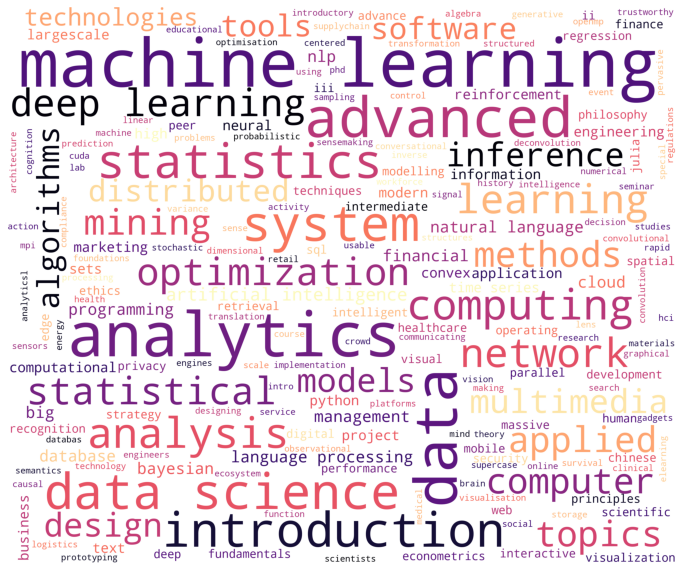

In [ ]:
#WordCloud for tweets from us_df with positive sentiments
from wordcloud import WordCloud
wordcloud = WordCloud(background_color='white',
                      width=3000,
                      height=2500,
                      colormap='magma',
                     ).generate(' '.join(df['Core Courses Cleaned']))

plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
from nltk import word_tokenize          
#nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer 
class LemmaTokenizer(object):
    def __init__(self):
        self.wnl = WordNetLemmatizer()
    def __call__(self, articles):
        return [self.wnl.lemmatize(t) for t in word_tokenize(articles)]

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(tokenizer=LemmaTokenizer(),max_features=40,ngram_range=(2, 3))
X = vectorizer.fit_transform(df['Core Courses Cleaned'])
Vals = vectorizer.get_feature_names()
print(Vals)
print(X.toarray())

['advanced multimedia', 'advanced statistical', 'applied statistic', 'artificial intelligence', 'bayesian inference advanced', 'big data', 'cloud computing', 'computing iii', 'computing machine', 'convex optimization', 'data mining', 'data science', 'data science data', 'data set', 'database system', 'deep learning', 'high performance', 'iii tool', 'language processing', 'language statistic', 'learning big', 'learning deep', 'learning text', 'machine learning', 'machine learning introduction', 'marketing analytics', 'natural language', 'natural language processing', 'network nlp', 'neural network', 'nlp machine', 'performance computing', 'reinforcement learning', 'science data', 'scientific computing', 'statistical inference', 'system advanced', 'text mining', 'time series', 'tool high']
[[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1
   0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  1  3  1  0  0  0  0  0  1  1  0  0  1  0  2  0  0  1  0  0  2  0  0
  

In [ ]:
type(X)

scipy.sparse.csr.csr_matrix

In [ ]:
import scipy.sparse
results = pd.DataFrame.sparse.from_spmatrix(X, columns = Vals, index = df['University'])

In [ ]:
results['University']=''
for i in range(10):
    results['University'][i] = df['University'][i]

<ipython-input-11-29f93ced3d95>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['University'][i] = df['University'][i]


In [ ]:
 results.append(results.sum(), ignore_index=True)

,advanced multimedia,advanced statistical,applied statistic,artificial intelligence,bayesian inference advanced,big data,cloud computing,computing iii,computing machine,convex optimization,...,performance computing,reinforcement learning,science data,scientific computing,statistical inference,system advanced,text mining,time series,tool high,University
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,MIT Sloan School of Management
1,0,1,3,1,0,0,0,0,0,1,...,0,1,0,0,1,0,0,0,0,Stanford University
2,2,0,0,0,0,2,2,0,1,2,...,0,1,1,0,0,2,2,0,0,Carnegie Mellon
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Imperial College
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,University of Bath
5,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,University of Toronto
6,0,0,0,3,2,1,0,2,0,0,...,2,0,0,2,0,0,0,1,2,University of Helsinki
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,École Polytechnique
8,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Tsinghua University
9,0,2,0,0,0,0,1,0,1,0,...,0,0,1,0,2,0,0,1,0,University of Hong Kong


In [ ]:
#Manually pick significant terms pertaining to course topics from Vals
Courses=['advanced multimedia', 'statistic', 'artificial intelligence',
         'big data', 'cloud computing', 'convex optimization', 'data mining', 'data science',
         'deep learning',  'language processing', 'machine learning', 'marketing analytics', 
         'neural network', 'reinforcement learning', 'time series']

len(Courses)

15

In [ ]:
dict= {}
for term in Courses:
    for i in range(len(df)):
        key = term
        if term in df['Core Courses Cleaned'][i]:
            uni = df['University'][i]
            dict[key] = df['University'][i]
            print("Course on " + term + " is found in " + uni)
                


Course on advanced multimedia is found in Carnegie Mellon
Course on advanced multimedia is found in Tsinghua University
Course on statistic is found in Stanford University 
Course on statistic is found in Carnegie Mellon
Course on statistic is found in Imperial College
Course on statistic is found in University of Bath
Course on statistic is found in University of Helsinki
Course on statistic is found in École Polytechnique
Course on statistic is found in University of Hong Kong 
Course on artificial intelligence is found in Stanford University 
Course on artificial intelligence is found in University of Toronto
Course on artificial intelligence is found in University of Helsinki
Course on big data is found in Carnegie Mellon
Course on big data is found in University of Helsinki
Course on big data is found in Tsinghua University
Course on cloud computing is found in Carnegie Mellon
Course on cloud computing is found in University of Hong Kong 
Course on convex optimization is found in 